Notebook to implement experiments from [Galashov & al. 2024]

In [1]:
#Import
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import math
import torch.nn.functional as F
from torchvision import datasets, transforms

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


### Kernels

In [2]:
def RBF_kernel(x,y,sigma):
    """
    Compute RBF kernel for x,y of the size (N,d) and (M,d)
    """
    x2 = torch.sum(x**2, dim=1, keepdim=True)
    y2 = torch.sum(y**2, dim=1, keepdim=True)
    diff2 = x2 + y2.T - 2.0 * (x @ y.T)   # shape (N, M)
    return torch.exp(-diff2 / (2 * sigma**2))

In [3]:
def Linear_kernel(x,y):
    """
    Compute Linear kernel for x,y of the size (N,d) and (M,d)
    """
    return x@y.T

In [4]:
N = 100
M = 100
K=200
d =  10
x = torch.rand((N,d))
y = torch.rand((M,d))
z = torch.rand((K,d))
RBF_kernel(x,y,1).shape,Linear_kernel(x,y).shape

(torch.Size([100, 100]), torch.Size([100, 100]))

### function

In [5]:
def mmd2_unbiased(x, y, kernel):
    """
    Compute MMD unbiased estimate
    x : (N, d)
    y : (M, d)
    """
    N = x.shape[0]
    M = y.shape[0]

    Kxx = kernel(x, x)
    Kyy = kernel(y, y)
    Kxy = kernel(x, y)

    # 0 on diag of Kxx et Kyy for unbiased
    Kxx_offdiag = Kxx - torch.diag(torch.diag(Kxx))
    Kyy_offdiag = Kyy - torch.diag(torch.diag(Kyy))

    term_xx = torch.sum(Kxx_offdiag) / (N * (N - 1))
    term_yy = torch.sum(Kyy_offdiag) / (M * (M - 1))
    term_xy = torch.sum(Kxy) / (N * M)

    mmd2 = term_xx + term_yy - 2.0 * term_xy

    return mmd2

def MMD(x,y,kernel):
    """
    Compute the approximate MMD^2 distance with riesz kernel
    take x,y of the size (N,d), (M,d)
    """

    kxx = kernel(x,x)
    kyy = kernel(y,y)
    kxy = kernel(x,y)

    mmd = kxx.mean() + kyy.mean() - 2 * kxy.mean()
    return mmd

In [6]:
def empirical_witness_fct(z,x,y,k_base):

    interraction_x = torch.mean(k_base(x,z),dim=0)
    interraction_y = torch.mean(k_base(y,z),dim=0)

    return interraction_x - interraction_y

def gradient_penalty(x,y,k_base):

    alpha = torch.rand((x.shape[0], 1), device=device)

    z = alpha * x + (1 - alpha) * y
    z.requires_grad_(True)

    f_z = empirical_witness_fct(z,x,y,k_base)

    grad = torch.autograd.grad(
    outputs=f_z.sum(),
    inputs=z,
    create_graph=True,
    retain_graph=True,
    only_inputs=True)[0]

    grad_norm = torch.norm(grad, dim=1)
    grad_penalty = ((grad_norm - 1) ** 2).mean()

    return grad_penalty

def empirical_witness_fct2d(z,x,y,k_base):
    """
    Compute empirical witness function for x,y,z of the size (N,d), (N,d) and (K,d)
    """

    interraction_x = torch.mean(k_base(x,z),dim=0)
    interraction_y = torch.mean(k_base(y,z),dim=0)

    return interraction_x - interraction_y

def gradient_penalty2d(x,y,k_base):
    alpha = torch.rand((x.shape[0], 1), device=device)

    z = alpha * x + (1 - alpha) * y
    z.requires_grad_(True)

    f_z = torch.mean(k_base(x,z),dim=0) - torch.mean(k_base(y,z),dim=0)

    grad = torch.autograd.grad(
    outputs=f_z.sum(),
    inputs=z,
    create_graph=True,
    retain_graph=True,
    only_inputs=True,)[0]

    grad_norm = torch.norm(grad, dim=1)
    grad_penalty = ((grad_norm - 1) ** 2).mean()

    return grad_penalty

In [7]:
def forward_phase(X_data,lr,lbda_l2,lbda_grad,n_iter,batch_size,n_noise,T,kernel,phi):
    """
    Implementation of Algorithm1: Train noise-conditional MMD discriminator (forward pass)
    X : (N_data,d)
    """

    N_data = X_data.shape[0]
    optimizer = torch.optim.Adam(phi.parameters(),lr=lr)

    betas = torch.linspace(1e-4, 2e-2, T, device=device)
    alphas = 1.0 - betas
    alpha_bar = torch.cumprod(alphas, dim=0)

    if lbda_l2 == 0 :
        l2 = 0

    tmin = 0.05
    tmax = 1.0

    for iter in range(n_iter):

        #Batch of real data
        indices = torch.randperm(N_data)[:batch_size]
        X = X_data[indices]

        #print(X.shape)

        loss = 0.0
        mmd_tot = 0.0
        for n in range(n_noise):

            t = tmin + (tmax - tmin) * torch.rand(1, device=device)
            t.requires_grad_()

            #forward
            with torch.no_grad():
              t_idx = (t * (T - 1)).long()
              ab = alpha_bar[t_idx]
            noise = torch.randn_like(X)
            X_noisy = torch.sqrt(ab) * X + torch.sqrt(1. - ab) * noise

            #Compute the loss
            phi_X = phi(X,t)
            phi_X_noisy = phi(X_noisy,t)
            mmd = - mmd2_unbiased(phi_X,phi_X_noisy,kernel)
            if lbda_l2 > 0:
                l2 = torch.mean(torch.sum(phi_X**2,dim=1)) + torch.mean(torch.sum(phi_X_noisy**2,dim=1))
            grad = gradient_penalty(phi_X,phi_X_noisy,kernel)
            loss = loss + mmd + lbda_l2 * l2  + lbda_grad * grad
            mmd_tot = mmd_tot + mmd

        loss_tot = (1/n_noise) * loss
        mmd_tot = (1/n_noise) * mmd_tot

        #Update phi
        optimizer.zero_grad()
        loss_tot.backward()
        optimizer.step()
        print(f"iter={iter} | mmd ={-mmd_tot}| loss={loss_tot}")


In [8]:
def make_rbf_kernel(sigma):
    def kernel_fn(x, y):
        return RBF_kernel(x, y, sigma)
    return kernel_fn


def forward_phase2d(X_data,lr,lbda_l2,lbda_grad,n_iter,batch_size,n_noise,T,kernel,phi):
    """
    Implementation of Algorithm1: Train noise-conditional MMD discriminator (forward pass)
    X : (N_data,d)
    """

    N_data = X_data.shape[0]
    optimizer = torch.optim.Adam(phi.parameters(),lr=lr)

    betas = torch.linspace(1e-4, 2e-4, T, device=device)
    alphas = 1.0 - betas
    alpha_bar = torch.cumprod(alphas, dim=0)

    if lbda_l2 == 0 :
        l2 = 0

    tmin = 0.05
    tmax = 1.0

    for iter in range(n_iter):

        #Batch of real data
        indices = torch.randperm(N_data)[:batch_size]
        X = X_data[indices]

        loss = 0.0
        mmd_tot = 0.0
        for n in range(n_noise):

            t = tmin + (tmax - tmin) * torch.rand(1, device=device)
            t.requires_grad_()

            #forward
            with torch.no_grad():
              t_idx = (t * (T - 1)).long()
              ab = alpha_bar[t_idx]
            noise = torch.randn_like(X)
            X_noisy = torch.sqrt(ab) * X + torch.sqrt(1. - ab) * noise

            #print(f"sqrt(ab)={torch.sqrt(1-ab)} | t={t}")

            #Compute the loss
            sigma_t = phi(t).view(1)

            # print("sigma_t:", sigma_t.item(), "| requires_grad:", sigma_t.requires_grad)
            # print("sigma_t.grad_fn:", sigma_t.grad_fn)

            rbf = make_rbf_kernel(sigma_t)
            #mmd = - mmd2_unbiased(X,X_noisy,rbf)
            mmd = - MMD(X,X_noisy,rbf)
            if lbda_l2 > 0:
                l2 = torch.mean(torch.sum(X**2,dim=1)) + torch.mean(torch.sum(X_noisy**2,dim=1))
            grad = gradient_penalty2d(X,X_noisy,rbf)
            loss = loss + mmd + lbda_l2 * l2  + lbda_grad * grad
            mmd_tot = mmd_tot + mmd
            #print(f"learned sigma={sigma_t.item()} | t={t}")

        loss_tot = (1/n_noise) * loss
        mmd_tot = (1/n_noise) * mmd_tot
        #print(f"learned sigma={sigma_t.item()}| t={t}")

        #Update phi
        optimizer.zero_grad()
        loss_tot.backward()
        optimizer.step()
        print(f"iter={iter} | mmd ={-mmd_tot} | loss={loss_tot} ")
        # for name, param in phi.named_parameters():
        #   if param.grad is None:
        #       print(f"[{name}] gradient = None")
        #   else:
        #       print(f"[{name}] grad norm = {param.grad.norm().item():.5e}")

        if iter % 10 == 0:
          a = np.linspace(0, 1, 500)
          b = []

          for i in range(len(a)):
              h = torch.tensor([a[i]], device=device).float()  # <- maintenant t a la forme (1,)
              b.append(phi(h).item())

          plt.plot(a, b)
          plt.xlabel("t")
          plt.ylabel("sigma(t)")
          plt.title("Courbe de σ(t) apprise")
          plt.grid(True)
          plt.show()


In [9]:
def sampling_phase(X_data,lr,N_s,N_p,T,t_min,t_max,phi,batch_size):

  #Sample initial noisy particles
  Z = torch.randn((N_p,1,28,28),device=device)
  Z.requires_grad_()

  indices = torch.randperm(X_data.shape[0])[:batch_size]
  X = X_data[indices]

  lbda_t = (t_max - t_min) / T

  for i in range(T,-1,-1):
    t = t_min + i * lbda_t
    t = torch.tensor([t],device=device)

    for n in range(N_s):

      phi_X = phi(X,t)
      phi_Z = phi(Z,t)

      f_Z = empirical_witness_fct(phi_Z,phi_Z,phi_X,kernel)

      grad_Z = torch.autograd.grad(outputs=f_Z.sum(),inputs=Z,create_graph=False,only_inputs=True)[0]
      Z = Z - lr * grad_Z
      print(f"Gradient Flow n{T-i}/{T} with noise level {t.item()}, iter={n} | mmd={mmd2_unbiased(phi_X,phi_Z,kernel)}")

      if n % 10 == 0:
        fig, axs = plt.subplots(1, 5, figsize=(15, 3))
        for j in range(5):
            axs[j].imshow(Z[j].detach().cpu().numpy().squeeze(), cmap='gray')
            axs[j].axis('off')
        plt.show()
  return Z

In [10]:
def sampling_phase2d(X_data,lr,N_s,N_p,T,t_min,t_max,phi):

  #Sample initial noisy particles
  Z = torch.randn((N_p,2),device=device)
  Z.requires_grad_()

  lbda_t = (t_max - t_min) / T

  for i in range(T,-1,-1):
    t = t_min + i * lbda_t
    t = torch.tensor([t],device=device)

    for n in range(N_s):
      #sigma_t = phi(t).view(1)
      sigma = 0.4
      rbf = make_rbf_kernel(sigma)
      f_Z = empirical_witness_fct2d(Z,Z,X_data,rbf)
      grad_Z = torch.autograd.grad(outputs=f_Z.sum(),inputs=Z,create_graph=False,only_inputs=True)[0]
      Z_ant = Z
      Z = Z - lr * grad_Z
      print(f"Gradient Flow n{T-i}/{T} with noise level {t.item()}, iter={n} | mmd={mmd2_unbiased(X_data,Z,rbf)}")
      print(torch.norm(Z-Z_ant).item())

    plt.scatter(Z[:, 0].detach().cpu(), Z[:, 1].detach().cpu(), s=5)
    plt.title(f"Gradient Flow n{i}/{T}")
    plt.axis("equal")
    plt.grid(True)
    plt.show()

  return Z


In [11]:
def classical_MMD_GF(X_data,N_p,lr,N_iter,sigma):

  rbf = make_rbf_kernel(sigma)

  Z = torch.randn((N_p,2),device=device)
  Z.requires_grad_()

  for iter in range(N_iter):

    f_Z = empirical_witness_fct2d(Z,Z,X_data,rbf)

    grad_Z = torch.autograd.grad(outputs=f_Z.sum(),inputs=Z,create_graph=False,only_inputs=True)[0]
    Z = Z - lr * grad_Z
    print(f"GF iter={iter} | mmd={mmd2_unbiased(X_data,Z,rbf)}")

    if iter % 200 == 0:
      plt.scatter(Z[:, 0].detach().cpu(), Z[:, 1].detach().cpu(), s=5)
      plt.title(f"GF iter {iter}")
      plt.axis("equal")
      plt.grid(True)
      plt.show()
  return Z


### Toy application

#### data

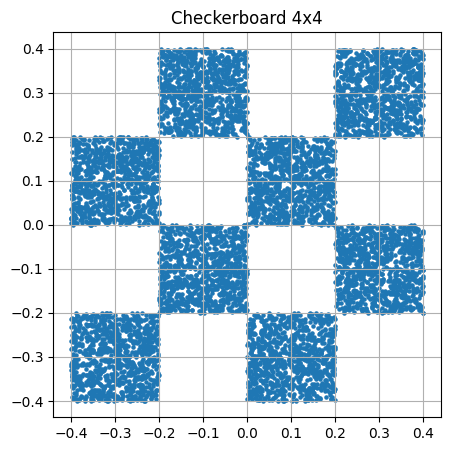

In [11]:
def create_checkerboard_4x4(n_per_square=1000):
    data = []
    spacing = 0.2  # distance entre les centres
    size = 0.1     # demi-côté de chaque carré (taille réelle = 0.2)

    for i in range(4):
        for j in range(4):
            if (i + j) % 2 == 0:  # case "noire"
                cx = (i - 1.5) * spacing
                cy = (j - 1.5) * spacing
                square = torch.rand(n_per_square, 2) * 2 * size - size
                square += torch.tensor([cx, cy])
                data.append(square)

    return torch.cat(data, dim=0)

# Exemple d'affichage
data = create_checkerboard_4x4()
plt.figure(figsize=(5, 5))
plt.scatter(data[:, 0], data[:, 1], s=5)
plt.title("Checkerboard 4x4")
plt.axis("equal")
plt.grid(True)
plt.show()


#### Model fo phi

In [18]:
class SinusoidalEmbedding(nn.Module):
    def __init__(self, embedding_dim=1024):
        super().__init__()
        self.embedding_dim = embedding_dim
        self.freqs = torch.exp(
            -math.log(10000) * torch.arange(0, embedding_dim, 2).float() / embedding_dim
        )  # (embedding_dim // 2,)

    def forward(self, t):
        """
        t : (batch_size,) ou (1,)
        return : (batch_size, embedding_dim)
        """
        if len(t.shape) == 0:
            t = t[None]  # -> (1,)
        elif len(t.shape) == 1:
            t = t.unsqueeze(1)  # (batch_size, 1)

        freqs = self.freqs.to(t.device)
        args = t * freqs  # (batch_size, embedding_dim // 2)
        embed = torch.cat([torch.sin(args), torch.cos(args)], dim=1)  # (batch_size, embedding_dim)
        return embed


class SigmaMLP(nn.Module):
    def __init__(self, sigma_min=0.001, emb_dim=1024):
        super().__init__()
        self.sigma_min = sigma_min
        self.net = nn.Sequential(
            nn.Linear(emb_dim, 64),
            nn.Softplus(),
            nn.Linear(64, 32),
            nn.Softplus(),
            nn.Linear(32, 16),
            nn.Softplus(),
            nn.Linear(16, 1),
            nn.Softplus() # Ensure positivity before adding sigma_min
        )

    def forward(self, t_embed):
        sigma_offset = self.net(t_embed)  # (batch_size, 1)
        return self.sigma_min + sigma_offset  # assure sigma(t) > 0


class Phi(nn.Module):
    def __init__(self, sigma_min=0.001, emb_dim=1024):
        super().__init__()
        self.t_embed = SinusoidalEmbedding(embedding_dim=emb_dim)
        self.sigma_mlp = SigmaMLP(sigma_min=sigma_min, emb_dim=emb_dim)


    def forward(self, t):
        """
        x : (batch_size, 2)
        t : (1,) ou (batch_size,)
        """
        t_emb = self.t_embed(t)  # (batch_size, emb_dim)
        sigma = self.sigma_mlp(t_emb)  # (batch_size, 1)
        return sigma


#### Train

In [19]:
def init_weights(m):
  if isinstance(m, nn.Linear):
      nn.init.kaiming_uniform_(m.weight, nonlinearity='relu')
      if m.bias is not None:
          m.bias.data.fill_(0.5)

Phi(
  (t_embed): SinusoidalEmbedding()
  (sigma_mlp): SigmaMLP(
    (net): Sequential(
      (0): Linear(in_features=1024, out_features=64, bias=True)
      (1): Softplus(beta=1.0, threshold=20.0)
      (2): Linear(in_features=64, out_features=32, bias=True)
      (3): Softplus(beta=1.0, threshold=20.0)
      (4): Linear(in_features=32, out_features=16, bias=True)
      (5): Softplus(beta=1.0, threshold=20.0)
      (6): Linear(in_features=16, out_features=1, bias=True)
      (7): Softplus(beta=1.0, threshold=20.0)
    )
  )
)

In [26]:
1e-5 >= 0.00001

True

iter=0 | mmd =0.016546834260225296 | loss=0.04850313812494278 


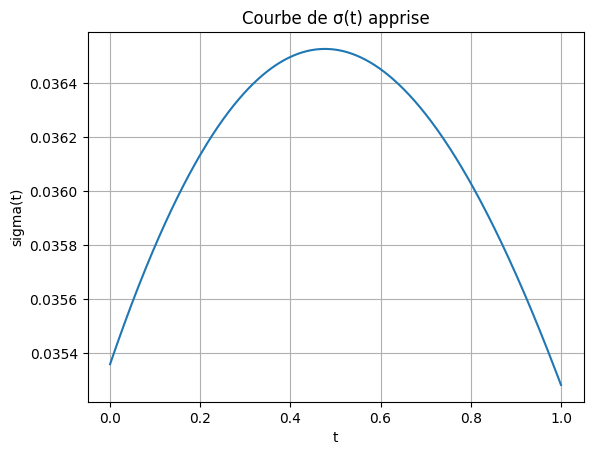

iter=1 | mmd =0.016005463898181915 | loss=0.04926668852567673 
iter=2 | mmd =0.017470119521021843 | loss=0.04687032476067543 
iter=3 | mmd =0.01806916669011116 | loss=0.04611080884933472 
iter=4 | mmd =0.018773434683680534 | loss=0.04383594170212746 
iter=5 | mmd =0.01879381760954857 | loss=0.04407557100057602 
iter=6 | mmd =0.01826414465904236 | loss=0.04465826228260994 
iter=7 | mmd =0.01982509158551693 | loss=0.04187743365764618 
iter=8 | mmd =0.0184905044734478 | loss=0.04470786079764366 
iter=9 | mmd =0.021154461428523064 | loss=0.038766175508499146 
iter=10 | mmd =0.022130489349365234 | loss=0.035952262580394745 


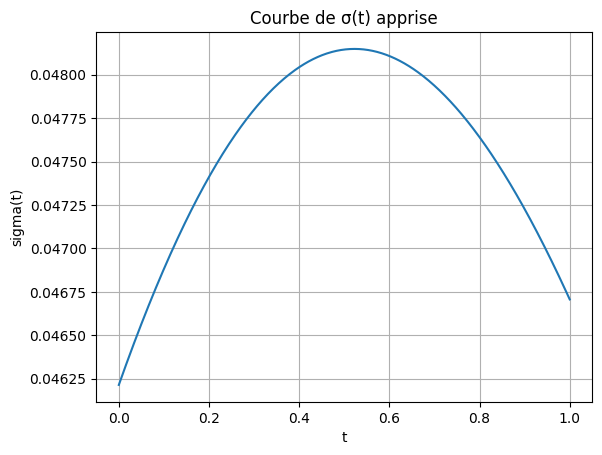

iter=11 | mmd =0.019227979704737663 | loss=0.04224995896220207 
iter=12 | mmd =0.020602313801646233 | loss=0.03991428762674332 
iter=13 | mmd =0.02575044520199299 | loss=0.028586050495505333 
iter=14 | mmd =0.02291254699230194 | loss=0.03517988324165344 
iter=15 | mmd =0.023002279922366142 | loss=0.03465631604194641 
iter=16 | mmd =0.02199385315179825 | loss=0.036806389689445496 
iter=17 | mmd =0.023118341341614723 | loss=0.033133164048194885 
iter=18 | mmd =0.02520170994102955 | loss=0.030089646577835083 
iter=19 | mmd =0.022364217787981033 | loss=0.03520110994577408 
iter=20 | mmd =0.02404869720339775 | loss=0.03379429504275322 


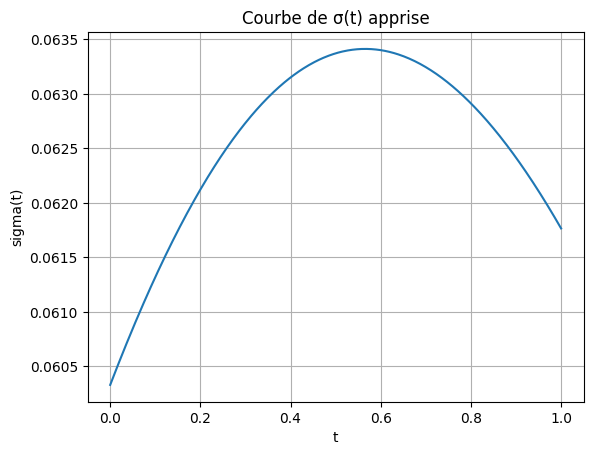

iter=21 | mmd =0.0267097856849432 | loss=0.02744206227362156 
iter=22 | mmd =0.02774551697075367 | loss=0.02595105580985546 
iter=23 | mmd =0.024817144498229027 | loss=0.031023526564240456 
iter=24 | mmd =0.02715720236301422 | loss=0.02579754963517189 
iter=25 | mmd =0.027733435854315758 | loss=0.026523226872086525 
iter=26 | mmd =0.02596963383257389 | loss=0.02953249402344227 
iter=27 | mmd =0.027521278709173203 | loss=0.025813007727265358 
iter=28 | mmd =0.02713475190103054 | loss=0.028200043365359306 
iter=29 | mmd =0.02900388091802597 | loss=0.025230756029486656 
iter=30 | mmd =0.028573278337717056 | loss=0.026006195694208145 


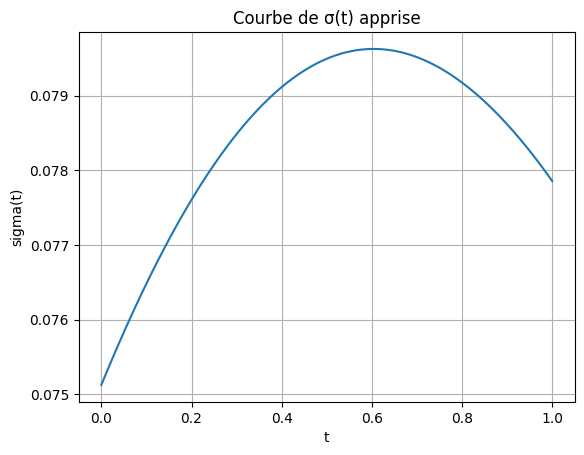

iter=31 | mmd =0.026182953268289566 | loss=0.030282752588391304 
iter=32 | mmd =0.028986765071749687 | loss=0.02466435357928276 
iter=33 | mmd =0.02669592946767807 | loss=0.028423666954040527 
iter=34 | mmd =0.028941716998815536 | loss=0.02395753562450409 
iter=35 | mmd =0.030173007398843765 | loss=0.02308114990592003 
iter=36 | mmd =0.029753219336271286 | loss=0.02446029894053936 
iter=37 | mmd =0.030003178864717484 | loss=0.024135973304510117 
iter=38 | mmd =0.02922830544412136 | loss=0.026410285383462906 
iter=39 | mmd =0.028880087658762932 | loss=0.02647918276488781 
iter=40 | mmd =0.02806539461016655 | loss=0.028595170006155968 


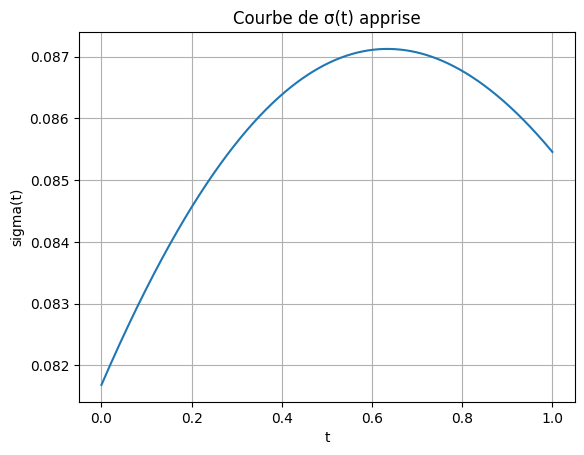

iter=41 | mmd =0.03263811022043228 | loss=0.02104087546467781 
iter=42 | mmd =0.03145784139633179 | loss=0.021693212911486626 
iter=43 | mmd =0.031830545514822006 | loss=0.021192660555243492 
iter=44 | mmd =0.028335776180028915 | loss=0.027365058660507202 
iter=45 | mmd =0.0288340263068676 | loss=0.026792459189891815 
iter=46 | mmd =0.02760924957692623 | loss=0.027265768498182297 
iter=47 | mmd =0.02832021936774254 | loss=0.02741478942334652 
iter=48 | mmd =0.02844819985330105 | loss=0.02750966139137745 
iter=49 | mmd =0.02876773290336132 | loss=0.026094399392604828 
iter=50 | mmd =0.028307640925049782 | loss=0.02777198888361454 


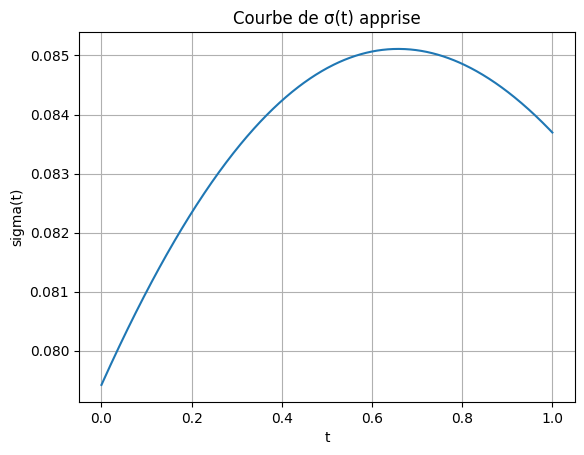

iter=51 | mmd =0.02742989920079708 | loss=0.0288122296333313 
iter=52 | mmd =0.028603753075003624 | loss=0.025934215635061264 
iter=53 | mmd =0.031075406819581985 | loss=0.022141458466649055 
iter=54 | mmd =0.028556669130921364 | loss=0.026785094290971756 
iter=55 | mmd =0.030443266034126282 | loss=0.023554019629955292 
iter=56 | mmd =0.027987295761704445 | loss=0.027072550728917122 
iter=57 | mmd =0.029498090967535973 | loss=0.024574413895606995 
iter=58 | mmd =0.030044879764318466 | loss=0.02332216128706932 
iter=59 | mmd =0.02919238805770874 | loss=0.024654703214764595 
iter=60 | mmd =0.027011526748538017 | loss=0.02770448848605156 


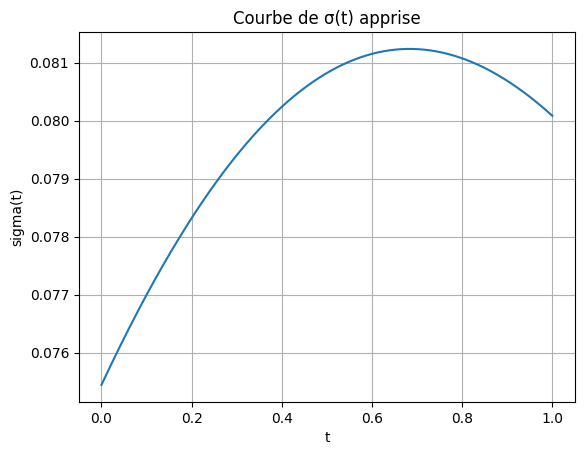

iter=61 | mmd =0.026592671871185303 | loss=0.028986860066652298 
iter=62 | mmd =0.028980473056435585 | loss=0.025180265307426453 
iter=63 | mmd =0.028164958581328392 | loss=0.026884324848651886 
iter=64 | mmd =0.029741019010543823 | loss=0.023495221510529518 
iter=65 | mmd =0.0293995663523674 | loss=0.0242827907204628 
iter=66 | mmd =0.02836359106004238 | loss=0.02626609057188034 
iter=67 | mmd =0.027608346194028854 | loss=0.027503199875354767 
iter=68 | mmd =0.02651430107653141 | loss=0.0291738361120224 
iter=69 | mmd =0.027863774448633194 | loss=0.02535553090274334 
iter=70 | mmd =0.028425665572285652 | loss=0.027100175619125366 


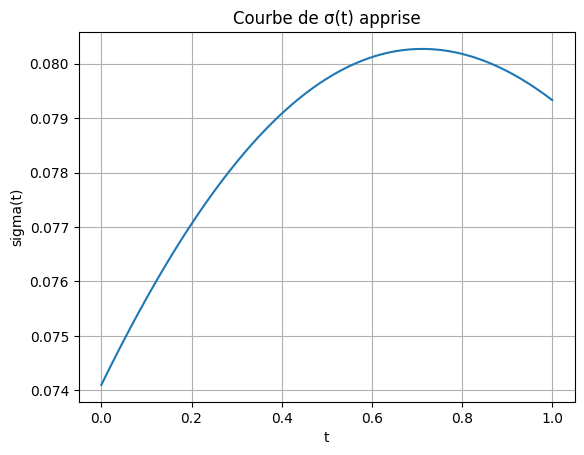

iter=71 | mmd =0.02865174226462841 | loss=0.024221152067184448 
iter=72 | mmd =0.02778107114136219 | loss=0.02712921053171158 
iter=73 | mmd =0.027010193094611168 | loss=0.028565961867570877 
iter=74 | mmd =0.0266711562871933 | loss=0.029133012518286705 
iter=75 | mmd =0.02712489664554596 | loss=0.02863067016005516 
iter=76 | mmd =0.02685052715241909 | loss=0.028446068987250328 
iter=77 | mmd =0.030382225289940834 | loss=0.02387372963130474 
iter=78 | mmd =0.030041750520467758 | loss=0.023248281329870224 
iter=79 | mmd =0.0263430867344141 | loss=0.0284829530864954 
iter=80 | mmd =0.031425412744283676 | loss=0.020003385841846466 


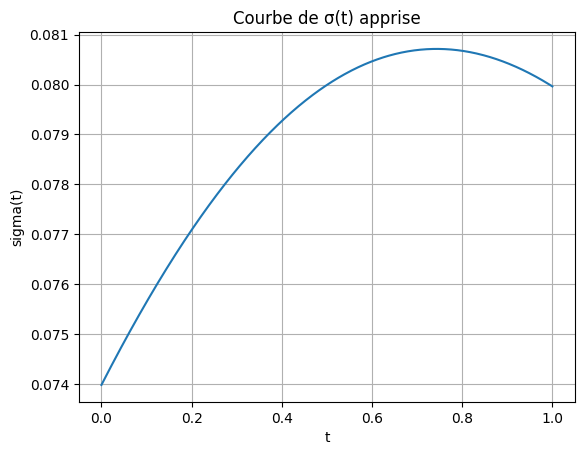

iter=81 | mmd =0.030332764610648155 | loss=0.02318747714161873 
iter=82 | mmd =0.030694277957081795 | loss=0.022345302626490593 
iter=83 | mmd =0.029530154541134834 | loss=0.023516377434134483 
iter=84 | mmd =0.025995468720793724 | loss=0.02925592102110386 
iter=85 | mmd =0.028035303577780724 | loss=0.025480899959802628 
iter=86 | mmd =0.027397170662879944 | loss=0.027266547083854675 
iter=87 | mmd =0.028658943250775337 | loss=0.025990888476371765 
iter=88 | mmd =0.028987396508455276 | loss=0.024132544174790382 
iter=89 | mmd =0.028057647868990898 | loss=0.0281801950186491 
iter=90 | mmd =0.028170963749289513 | loss=0.026122435927391052 


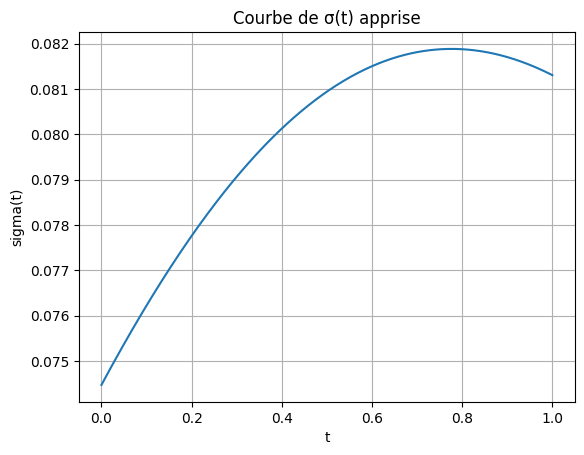

iter=91 | mmd =0.027991754934191704 | loss=0.02701854519546032 
iter=92 | mmd =0.029257411137223244 | loss=0.024027859792113304 
iter=93 | mmd =0.030374474823474884 | loss=0.022590763866901398 
iter=94 | mmd =0.025874612852931023 | loss=0.030012238770723343 
iter=95 | mmd =0.02873053401708603 | loss=0.025836225599050522 
iter=96 | mmd =0.02527771145105362 | loss=0.03181898221373558 
iter=97 | mmd =0.027087314054369926 | loss=0.027525614947080612 
iter=98 | mmd =0.02859867922961712 | loss=0.02513737976551056 
iter=99 | mmd =0.029638364911079407 | loss=0.0244174562394619 


In [27]:
phi = Phi().to(device)
phi.apply(init_weights)
X_data = data.to(device)
lr = 0.00001
lbda_l2 = 0.0
lbda_grad = 0.1
n_iter = 100
batch_size = 256
n_noise = 128
T = 1000
kernel = RBF_kernel

forward_phase2d(X_data,lr,lbda_l2,lbda_grad,n_iter,batch_size,n_noise,T,kernel,phi)

Gradient Flow n0/60 with noise level 1.0, iter=0 | mmd=0.3930160105228424
0.2816407084465027
Gradient Flow n0/60 with noise level 1.0, iter=1 | mmd=0.38965097069740295
0.27963846921920776
Gradient Flow n0/60 with noise level 1.0, iter=2 | mmd=0.386318564414978
0.27756407856941223
Gradient Flow n0/60 with noise level 1.0, iter=3 | mmd=0.3830201029777527
0.27542194724082947
Gradient Flow n0/60 with noise level 1.0, iter=4 | mmd=0.379756897687912
0.2732166647911072
Gradient Flow n0/60 with noise level 1.0, iter=5 | mmd=0.3765299916267395
0.2709525525569916
Gradient Flow n0/60 with noise level 1.0, iter=6 | mmd=0.37334057688713074
0.26863402128219604
Gradient Flow n0/60 with noise level 1.0, iter=7 | mmd=0.3701896071434021
0.2662653625011444
Gradient Flow n0/60 with noise level 1.0, iter=8 | mmd=0.3670777976512909
0.26385077834129333
Gradient Flow n0/60 with noise level 1.0, iter=9 | mmd=0.36400604248046875
0.26139432191848755


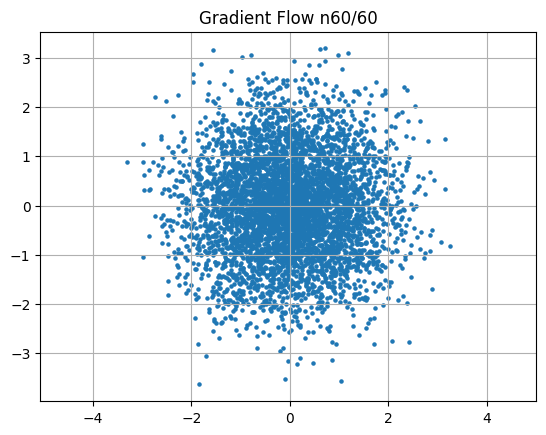

Gradient Flow n1/60 with noise level 0.98416668176651, iter=0 | mmd=0.36097490787506104
0.25890010595321655
Gradient Flow n1/60 with noise level 0.98416668176651, iter=1 | mmd=0.3579850494861603
0.2563720941543579
Gradient Flow n1/60 with noise level 0.98416668176651, iter=2 | mmd=0.3550368845462799
0.25381389260292053
Gradient Flow n1/60 with noise level 0.98416668176651, iter=3 | mmd=0.35213086009025574
0.25122934579849243
Gradient Flow n1/60 with noise level 0.98416668176651, iter=4 | mmd=0.34926721453666687
0.24862197041511536
Gradient Flow n1/60 with noise level 0.98416668176651, iter=5 | mmd=0.34644630551338196
0.2459951639175415
Gradient Flow n1/60 with noise level 0.98416668176651, iter=6 | mmd=0.34366822242736816
0.24335235357284546
Gradient Flow n1/60 with noise level 0.98416668176651, iter=7 | mmd=0.34093308448791504
0.24069662392139435
Gradient Flow n1/60 with noise level 0.98416668176651, iter=8 | mmd=0.3382408618927002
0.23803110420703888
Gradient Flow n1/60 with noise le

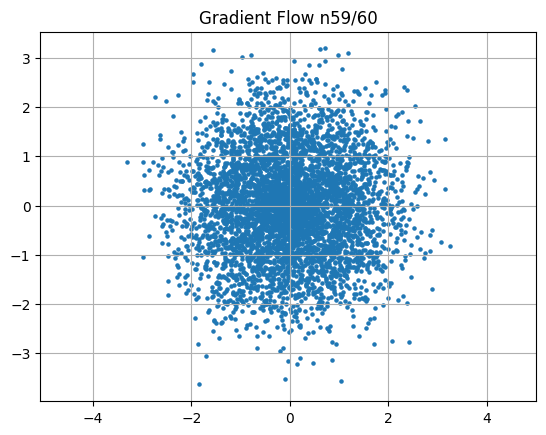

Gradient Flow n2/60 with noise level 0.9683333039283752, iter=0 | mmd=0.3329853117465973
0.23268218338489532
Gradient Flow n2/60 with noise level 0.9683333039283752, iter=1 | mmd=0.33042171597480774
0.23000426590442657
Gradient Flow n2/60 with noise level 0.9683333039283752, iter=2 | mmd=0.32790061831474304
0.22732746601104736
Gradient Flow n2/60 with noise level 0.9683333039283752, iter=3 | mmd=0.32542186975479126
0.22465425729751587
Gradient Flow n2/60 with noise level 0.9683333039283752, iter=4 | mmd=0.32298511266708374
0.22198691964149475
Gradient Flow n2/60 with noise level 0.9683333039283752, iter=5 | mmd=0.32059013843536377
0.2193276435136795
Gradient Flow n2/60 with noise level 0.9683333039283752, iter=6 | mmd=0.31823644042015076
0.2166784256696701
Gradient Flow n2/60 with noise level 0.9683333039283752, iter=7 | mmd=0.3159237205982208
0.21404129266738892
Gradient Flow n2/60 with noise level 0.9683333039283752, iter=8 | mmd=0.31365153193473816
0.21141797304153442
Gradient Flow 

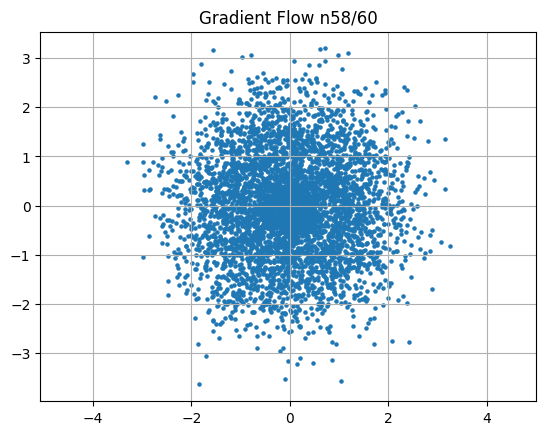

Gradient Flow n3/60 with noise level 0.9524999856948853, iter=0 | mmd=0.3092270493507385
0.2062196433544159
Gradient Flow n3/60 with noise level 0.9524999856948853, iter=1 | mmd=0.3070736825466156
0.2036477029323578
Gradient Flow n3/60 with noise level 0.9524999856948853, iter=2 | mmd=0.30495893955230713
0.2010957896709442
Gradient Flow n3/60 with noise level 0.9524999856948853, iter=3 | mmd=0.30288225412368774
0.19856519997119904
Gradient Flow n3/60 with noise level 0.9524999856948853, iter=4 | mmd=0.3008430302143097
0.19605709612369537
Gradient Flow n3/60 with noise level 0.9524999856948853, iter=5 | mmd=0.29884079098701477
0.19357255101203918
Gradient Flow n3/60 with noise level 0.9524999856948853, iter=6 | mmd=0.29687488079071045
0.19111259281635284
Gradient Flow n3/60 with noise level 0.9524999856948853, iter=7 | mmd=0.29494473338127136
0.1886781007051468
Gradient Flow n3/60 with noise level 0.9524999856948853, iter=8 | mmd=0.29304978251457214
0.18626993894577026
Gradient Flow n3/

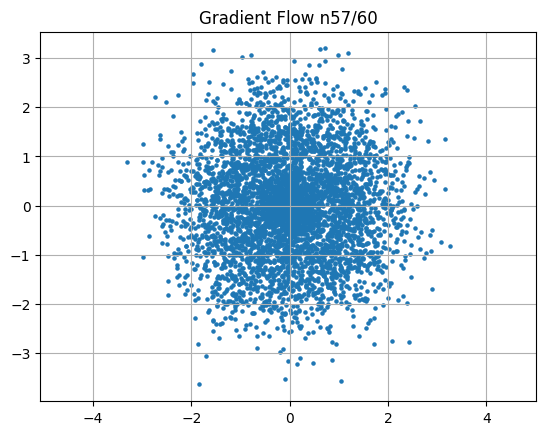

Gradient Flow n4/60 with noise level 0.9366666674613953, iter=0 | mmd=0.28936299681663513
0.1815352588891983
Gradient Flow n4/60 with noise level 0.9366666674613953, iter=1 | mmd=0.28756996989250183
0.17921005189418793
Gradient Flow n4/60 with noise level 0.9366666674613953, iter=2 | mmd=0.28580960631370544
0.17691361904144287
Gradient Flow n4/60 with noise level 0.9366666674613953, iter=3 | mmd=0.28408142924308777
0.17464642226696014
Gradient Flow n4/60 with noise level 0.9366666674613953, iter=4 | mmd=0.2823847532272339
0.1724088191986084
Gradient Flow n4/60 with noise level 0.9366666674613953, iter=5 | mmd=0.28071898221969604
0.1702011078596115
Gradient Flow n4/60 with noise level 0.9366666674613953, iter=6 | mmd=0.2790835201740265
0.16802363097667694
Gradient Flow n4/60 with noise level 0.9366666674613953, iter=7 | mmd=0.27747777104377747
0.16587647795677185
Gradient Flow n4/60 with noise level 0.9366666674613953, iter=8 | mmd=0.27590101957321167
0.16375990211963654
Gradient Flow n

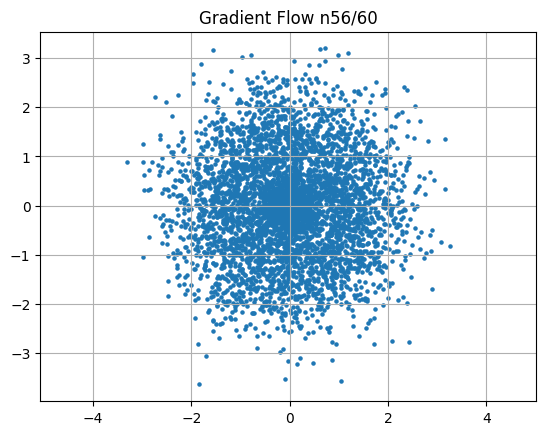

Gradient Flow n5/60 with noise level 0.9208333492279053, iter=0 | mmd=0.27283260226249695
0.15961869060993195
Gradient Flow n5/60 with noise level 0.9208333492279053, iter=1 | mmd=0.2713397145271301
0.15759409964084625
Gradient Flow n5/60 with noise level 0.9208333492279053, iter=2 | mmd=0.2698734700679779
0.15560026466846466
Gradient Flow n5/60 with noise level 0.9208333492279053, iter=3 | mmd=0.26843351125717163
0.15363702178001404
Gradient Flow n5/60 with noise level 0.9208333492279053, iter=4 | mmd=0.267019122838974
0.1517043262720108
Gradient Flow n5/60 with noise level 0.9208333492279053, iter=5 | mmd=0.2656298279762268
0.14980201423168182
Gradient Flow n5/60 with noise level 0.9208333492279053, iter=6 | mmd=0.2642650306224823
0.14792999625205994
Gradient Flow n5/60 with noise level 0.9208333492279053, iter=7 | mmd=0.26292428374290466
0.14608801901340485
Gradient Flow n5/60 with noise level 0.9208333492279053, iter=8 | mmd=0.26160699129104614
0.14427587389945984
Gradient Flow n5/

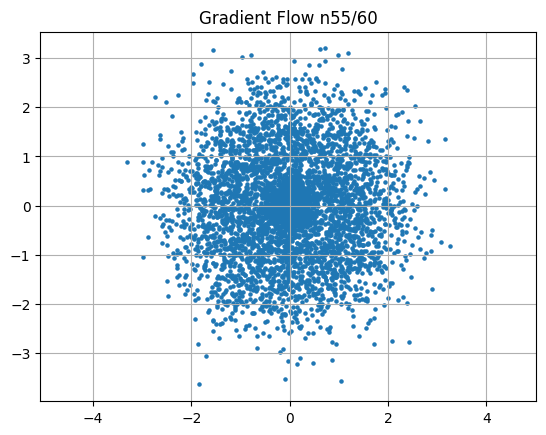

Gradient Flow n6/60 with noise level 0.9049999713897705, iter=0 | mmd=0.2590407133102417
0.14074020087718964
Gradient Flow n6/60 with noise level 0.9049999713897705, iter=1 | mmd=0.25779083371162415
0.13901616632938385
Gradient Flow n6/60 with noise level 0.9049999713897705, iter=2 | mmd=0.25656235218048096
0.1373208910226822
Gradient Flow n6/60 with noise level 0.9049999713897705, iter=3 | mmd=0.2553548514842987
0.13565413653850555
Gradient Flow n6/60 with noise level 0.9049999713897705, iter=4 | mmd=0.2541678845882416
0.13401557505130768
Gradient Flow n6/60 with noise level 0.9049999713897705, iter=5 | mmd=0.253000944852829
0.13240481913089752
Gradient Flow n6/60 with noise level 0.9049999713897705, iter=6 | mmd=0.2518536448478699
0.13082151114940643
Gradient Flow n6/60 with noise level 0.9049999713897705, iter=7 | mmd=0.25072553753852844
0.1292654126882553
Gradient Flow n6/60 with noise level 0.9049999713897705, iter=8 | mmd=0.24961620569229126
0.12773606181144714
Gradient Flow n6/6

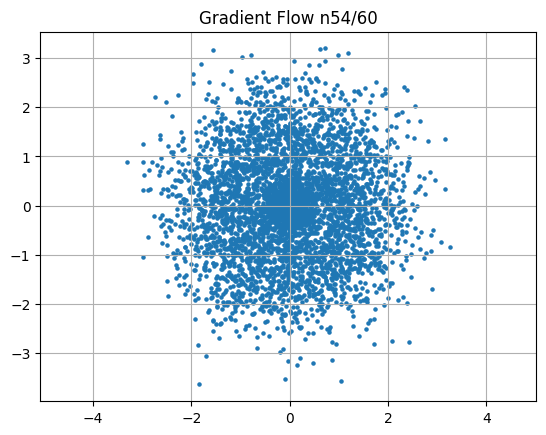

Gradient Flow n7/60 with noise level 0.8891666531562805, iter=0 | mmd=0.24745190143585205
0.12475620955228806
Gradient Flow n7/60 with noise level 0.8891666531562805, iter=1 | mmd=0.24639630317687988
0.12330492585897446
Gradient Flow n7/60 with noise level 0.8891666531562805, iter=2 | mmd=0.2453577220439911
0.12187892198562622
Gradient Flow n7/60 with noise level 0.8891666531562805, iter=3 | mmd=0.24433594942092896
0.12047775834798813
Gradient Flow n7/60 with noise level 0.8891666531562805, iter=4 | mmd=0.24333053827285767
0.11910104751586914
Gradient Flow n7/60 with noise level 0.8891666531562805, iter=5 | mmd=0.24234113097190857
0.1177484393119812
Gradient Flow n7/60 with noise level 0.8891666531562805, iter=6 | mmd=0.24136731028556824
0.11641950160264969
Gradient Flow n7/60 with noise level 0.8891666531562805, iter=7 | mmd=0.24040880799293518
0.11511385440826416
Gradient Flow n7/60 with noise level 0.8891666531562805, iter=8 | mmd=0.23946526646614075
0.1138310581445694
Gradient Flow

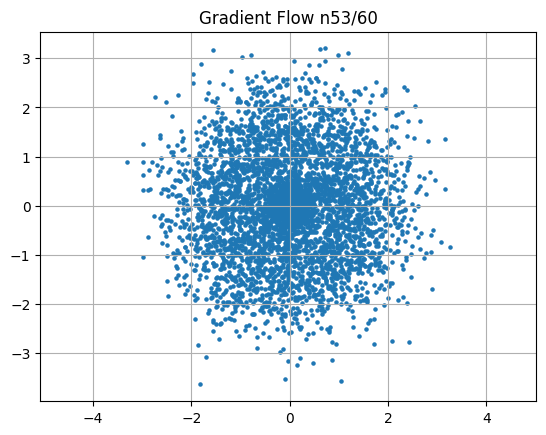

Gradient Flow n8/60 with noise level 0.8733333349227905, iter=0 | mmd=0.2376217544078827
0.11133257299661636
Gradient Flow n8/60 with noise level 0.8733333349227905, iter=1 | mmd=0.23672115802764893
0.11011607199907303
Gradient Flow n8/60 with noise level 0.8733333349227905, iter=2 | mmd=0.23583421111106873
0.1089208647608757
Gradient Flow n8/60 with noise level 0.8733333349227905, iter=3 | mmd=0.234960675239563
0.10774661600589752
Gradient Flow n8/60 with noise level 0.8733333349227905, iter=4 | mmd=0.23410019278526306
0.10659284889698029
Gradient Flow n8/60 with noise level 0.8733333349227905, iter=5 | mmd=0.23325255513191223
0.10545927286148071
Gradient Flow n8/60 with noise level 0.8733333349227905, iter=6 | mmd=0.23241746425628662
0.10434543341398239
Gradient Flow n8/60 with noise level 0.8733333349227905, iter=7 | mmd=0.23159459233283997
0.10325099527835846
Gradient Flow n8/60 with noise level 0.8733333349227905, iter=8 | mmd=0.23078379034996033
0.10217563062906265
Gradient Flow 

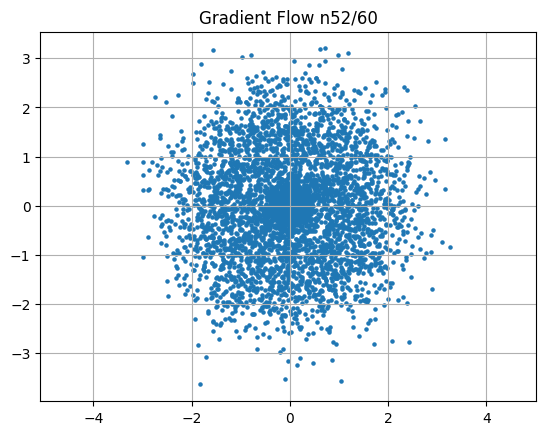

Gradient Flow n9/60 with noise level 0.8575000166893005, iter=0 | mmd=0.22919708490371704
0.1000804454088211
Gradient Flow n9/60 with noise level 0.8575000166893005, iter=1 | mmd=0.22842076420783997
0.09905995428562164
Gradient Flow n9/60 with noise level 0.8575000166893005, iter=2 | mmd=0.22765541076660156
0.09805702418088913
Gradient Flow n9/60 with noise level 0.8575000166893005, iter=3 | mmd=0.22690093517303467
0.09707138687372208
Gradient Flow n9/60 with noise level 0.8575000166893005, iter=4 | mmd=0.22615700960159302
0.09610261768102646
Gradient Flow n9/60 with noise level 0.8575000166893005, iter=5 | mmd=0.22542333602905273
0.0951504111289978
Gradient Flow n9/60 with noise level 0.8575000166893005, iter=6 | mmd=0.22469985485076904
0.09421443939208984
Gradient Flow n9/60 with noise level 0.8575000166893005, iter=7 | mmd=0.22398632764816284
0.09329437464475632
Gradient Flow n9/60 with noise level 0.8575000166893005, iter=8 | mmd=0.22328245639801025
0.09238989651203156
Gradient Flo

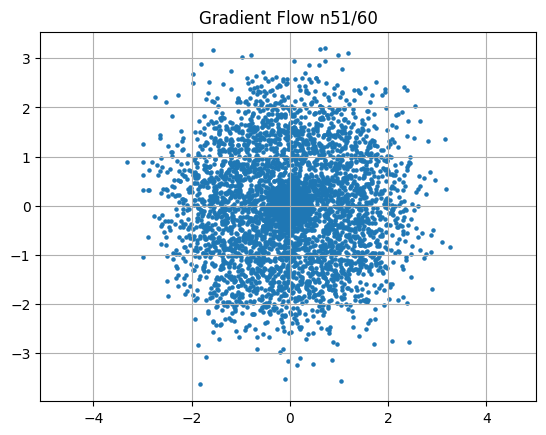

Gradient Flow n10/60 with noise level 0.8416666388511658, iter=0 | mmd=0.22190317511558533
0.09062647074460983
Gradient Flow n10/60 with noise level 0.8416666388511658, iter=1 | mmd=0.22122734785079956
0.08976690471172333
Gradient Flow n10/60 with noise level 0.8416666388511658, iter=2 | mmd=0.22056052088737488
0.0889216884970665
Gradient Flow n10/60 with noise level 0.8416666388511658, iter=3 | mmd=0.2199023962020874
0.08809052407741547
Gradient Flow n10/60 with noise level 0.8416666388511658, iter=4 | mmd=0.21925294399261475
0.08727316558361053
Gradient Flow n10/60 with noise level 0.8416666388511658, iter=5 | mmd=0.2186119556427002
0.08646934479475021
Gradient Flow n10/60 with noise level 0.8416666388511658, iter=6 | mmd=0.2179792821407318
0.08567870408296585
Gradient Flow n10/60 with noise level 0.8416666388511658, iter=7 | mmd=0.2173546850681305
0.08490105718374252
Gradient Flow n10/60 with noise level 0.8416666388511658, iter=8 | mmd=0.21673795580863953
0.08413606882095337
Gradie

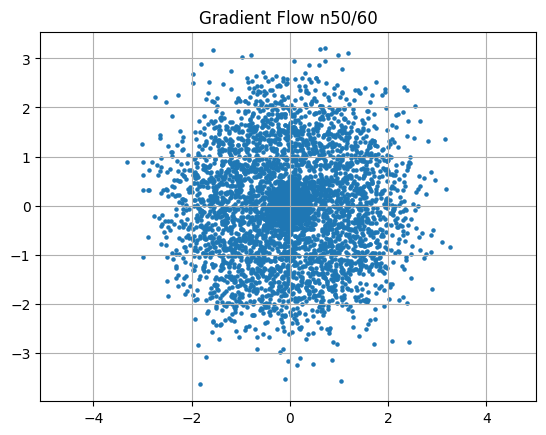

Gradient Flow n11/60 with noise level 0.8258333206176758, iter=0 | mmd=0.21552804112434387
0.08264320343732834
Gradient Flow n11/60 with noise level 0.8258333206176758, iter=1 | mmd=0.2149343490600586
0.08191470056772232
Gradient Flow n11/60 with noise level 0.8258333206176758, iter=2 | mmd=0.21434813737869263
0.08119796216487885
Gradient Flow n11/60 with noise level 0.8258333206176758, iter=3 | mmd=0.21376916766166687
0.08049268275499344
Gradient Flow n11/60 with noise level 0.8258333206176758, iter=4 | mmd=0.2131972312927246
0.07979857921600342
Gradient Flow n11/60 with noise level 0.8258333206176758, iter=5 | mmd=0.21263229846954346
0.07911545783281326
Gradient Flow n11/60 with noise level 0.8258333206176758, iter=6 | mmd=0.2120741903781891
0.07844313234090805
Gradient Flow n11/60 with noise level 0.8258333206176758, iter=7 | mmd=0.21152296662330627
0.07778137177228928
Gradient Flow n11/60 with noise level 0.8258333206176758, iter=8 | mmd=0.2109781801700592
0.07712990045547485
Gradi

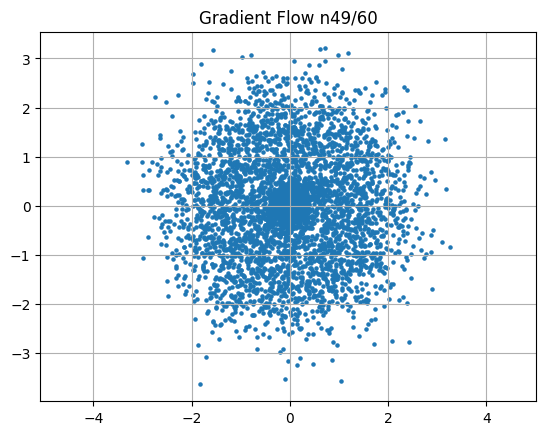

Gradient Flow n12/60 with noise level 0.8100000023841858, iter=0 | mmd=0.209908127784729
0.07585714012384415
Gradient Flow n12/60 with noise level 0.8100000023841858, iter=1 | mmd=0.20938250422477722
0.07523541897535324
Gradient Flow n12/60 with noise level 0.8100000023841858, iter=2 | mmd=0.20886307954788208
0.07462325692176819
Gradient Flow n12/60 with noise level 0.8100000023841858, iter=3 | mmd=0.20834964513778687
0.07402043789625168
Gradient Flow n12/60 with noise level 0.8100000023841858, iter=4 | mmd=0.20784223079681396
0.07342670112848282
Gradient Flow n12/60 with noise level 0.8100000023841858, iter=5 | mmd=0.20734059810638428
0.07284195721149445
Gradient Flow n12/60 with noise level 0.8100000023841858, iter=6 | mmd=0.20684480667114258
0.07226598262786865
Gradient Flow n12/60 with noise level 0.8100000023841858, iter=7 | mmd=0.20635449886322021
0.07169867306947708
Gradient Flow n12/60 with noise level 0.8100000023841858, iter=8 | mmd=0.2058698534965515
0.07113978266716003
Grad

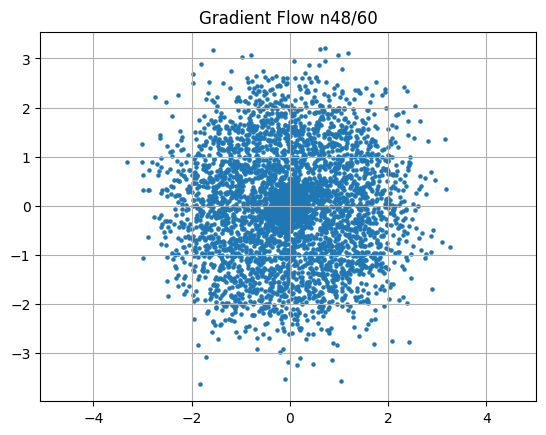

Gradient Flow n13/60 with noise level 0.7941666841506958, iter=0 | mmd=0.20491677522659302
0.07004661113023758
Gradient Flow n13/60 with noise level 0.7941666841506958, iter=1 | mmd=0.20444822311401367
0.0695120096206665
Gradient Flow n13/60 with noise level 0.7941666841506958, iter=2 | mmd=0.203984797000885
0.06898527592420578
Gradient Flow n13/60 with noise level 0.7941666841506958, iter=3 | mmd=0.20352649688720703
0.06846607476472855
Gradient Flow n13/60 with noise level 0.7941666841506958, iter=4 | mmd=0.20307332277297974
0.06795445829629898
Gradient Flow n13/60 with noise level 0.7941666841506958, iter=5 | mmd=0.20262491703033447
0.06745018810033798
Gradient Flow n13/60 with noise level 0.7941666841506958, iter=6 | mmd=0.20218157768249512
0.06695308536291122
Gradient Flow n13/60 with noise level 0.7941666841506958, iter=7 | mmd=0.20174282789230347
0.06646308302879333
Gradient Flow n13/60 with noise level 0.7941666841506958, iter=8 | mmd=0.20130890607833862
0.06598004698753357
Grad

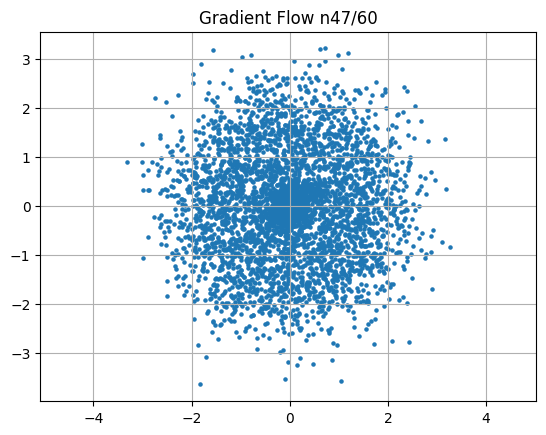

Gradient Flow n14/60 with noise level 0.778333306312561, iter=0 | mmd=0.2004549503326416
0.0650341659784317
Gradient Flow n14/60 with noise level 0.778333306312561, iter=1 | mmd=0.20003467798233032
0.06457114964723587
Gradient Flow n14/60 with noise level 0.778333306312561, iter=2 | mmd=0.1996188759803772
0.06411455571651459
Gradient Flow n14/60 with noise level 0.778333306312561, iter=3 | mmd=0.19920748472213745
0.0636642724275589
Gradient Flow n14/60 with noise level 0.778333306312561, iter=4 | mmd=0.19880032539367676
0.06322015076875687
Gradient Flow n14/60 with noise level 0.778333306312561, iter=5 | mmd=0.19839739799499512
0.06278212368488312
Gradient Flow n14/60 with noise level 0.778333306312561, iter=6 | mmd=0.19799870252609253
0.06235005706548691
Gradient Flow n14/60 with noise level 0.778333306312561, iter=7 | mmd=0.19760411977767944
0.06192381680011749
Gradient Flow n14/60 with noise level 0.778333306312561, iter=8 | mmd=0.1972135305404663
0.06150336191058159
Gradient Flow n

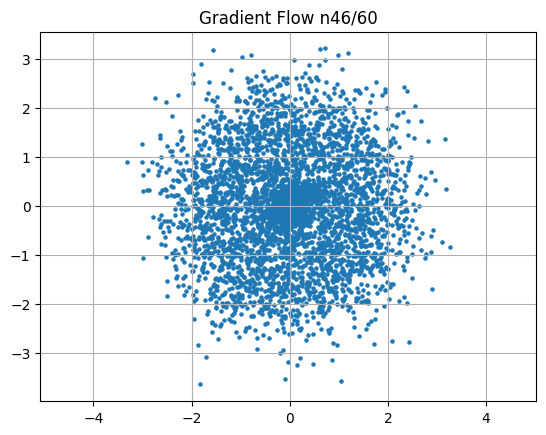

Gradient Flow n15/60 with noise level 0.762499988079071, iter=0 | mmd=0.1964443325996399
0.060679253190755844
Gradient Flow n15/60 with noise level 0.762499988079071, iter=1 | mmd=0.1960654854774475
0.060275375843048096
Gradient Flow n15/60 with noise level 0.762499988079071, iter=2 | mmd=0.1956905722618103
0.05987688899040222
Gradient Flow n15/60 with noise level 0.762499988079071, iter=3 | mmd=0.19531935453414917
0.059483613818883896
Gradient Flow n15/60 with noise level 0.762499988079071, iter=4 | mmd=0.1949518322944641
0.05909554287791252
Gradient Flow n15/60 with noise level 0.762499988079071, iter=5 | mmd=0.1945880651473999
0.05871249735355377
Gradient Flow n15/60 with noise level 0.762499988079071, iter=6 | mmd=0.19422787427902222
0.05833439528942108
Gradient Flow n15/60 with noise level 0.762499988079071, iter=7 | mmd=0.19387125968933105
0.05796123668551445
Gradient Flow n15/60 with noise level 0.762499988079071, iter=8 | mmd=0.19351810216903687
0.05759285390377045
Gradient Flo

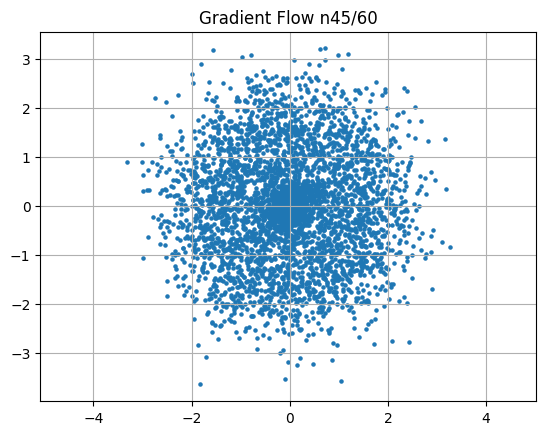

Gradient Flow n16/60 with noise level 0.746666669845581, iter=0 | mmd=0.19282221794128418
0.056870218366384506
Gradient Flow n16/60 with noise level 0.746666669845581, iter=1 | mmd=0.19247931241989136
0.056515760719776154
Gradient Flow n16/60 with noise level 0.746666669845581, iter=2 | mmd=0.19213974475860596
0.05616575479507446
Gradient Flow n16/60 with noise level 0.746666669845581, iter=3 | mmd=0.1918034553527832
0.055820170789957047
Gradient Flow n16/60 with noise level 0.746666669845581, iter=4 | mmd=0.1914704442024231
0.05547889322042465
Gradient Flow n16/60 with noise level 0.746666669845581, iter=5 | mmd=0.19114059209823608
0.05514197424054146
Gradient Flow n16/60 with noise level 0.746666669845581, iter=6 | mmd=0.19081389904022217
0.054809100925922394
Gradient Flow n16/60 with noise level 0.746666669845581, iter=7 | mmd=0.1904902458190918
0.05448047071695328
Gradient Flow n16/60 with noise level 0.746666669845581, iter=8 | mmd=0.1901698112487793
0.05415580794215202
Gradient F

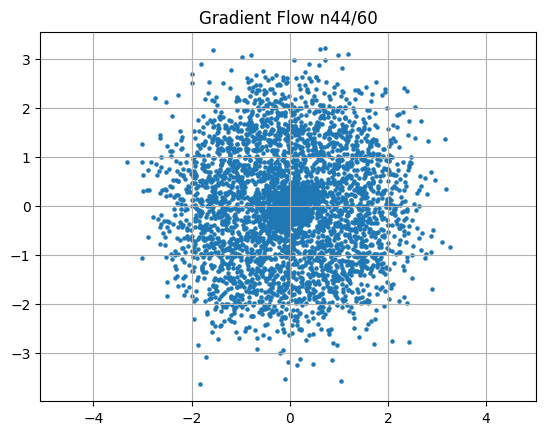

Gradient Flow n17/60 with noise level 0.7308333516120911, iter=0 | mmd=0.18953782320022583
0.05351841449737549
Gradient Flow n17/60 with noise level 0.7308333516120911, iter=1 | mmd=0.18922626972198486
0.053205523639917374
Gradient Flow n17/60 with noise level 0.7308333516120911, iter=2 | mmd=0.18891775608062744
0.05289643630385399
Gradient Flow n17/60 with noise level 0.7308333516120911, iter=3 | mmd=0.1886119246482849
0.052590977400541306
Gradient Flow n17/60 with noise level 0.7308333516120911, iter=4 | mmd=0.18830907344818115
0.05228933319449425
Gradient Flow n17/60 with noise level 0.7308333516120911, iter=5 | mmd=0.18800896406173706
0.05199124291539192
Gradient Flow n17/60 with noise level 0.7308333516120911, iter=6 | mmd=0.1877116560935974
0.05169668421149254
Gradient Flow n17/60 with noise level 0.7308333516120911, iter=7 | mmd=0.18741708993911743
0.05140560865402222
Gradient Flow n17/60 with noise level 0.7308333516120911, iter=8 | mmd=0.18712520599365234
0.05111806467175484
G

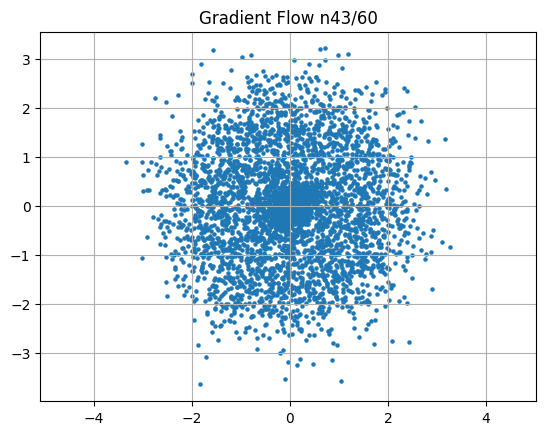

Gradient Flow n18/60 with noise level 0.7149999737739563, iter=0 | mmd=0.18654948472976685
0.050552848726511
Gradient Flow n18/60 with noise level 0.7149999737739563, iter=1 | mmd=0.18626552820205688
0.05027526617050171
Gradient Flow n18/60 with noise level 0.7149999737739563, iter=2 | mmd=0.18598419427871704
0.05000092089176178
Gradient Flow n18/60 with noise level 0.7149999737739563, iter=3 | mmd=0.18570536375045776
0.04972971975803375
Gradient Flow n18/60 with noise level 0.7149999737739563, iter=4 | mmd=0.18542897701263428
0.04946161434054375
Gradient Flow n18/60 with noise level 0.7149999737739563, iter=5 | mmd=0.18515515327453613
0.04919659346342087
Gradient Flow n18/60 with noise level 0.7149999737739563, iter=6 | mmd=0.18488383293151855
0.0489346981048584
Gradient Flow n18/60 with noise level 0.7149999737739563, iter=7 | mmd=0.184614896774292
0.04867574945092201
Gradient Flow n18/60 with noise level 0.7149999737739563, iter=8 | mmd=0.18434828519821167
0.04841966554522514
Gradie

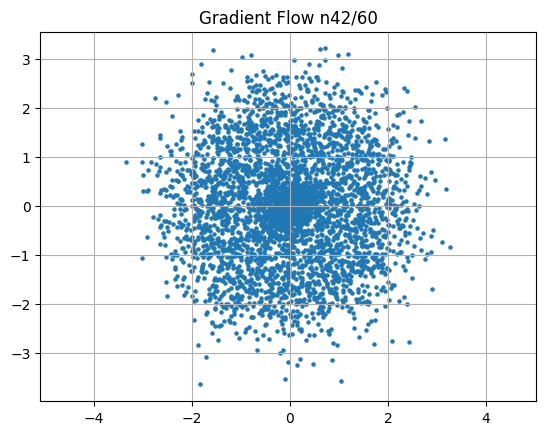

Gradient Flow n19/60 with noise level 0.6991666555404663, iter=0 | mmd=0.18382227420806885
0.04791631922125816
Gradient Flow n19/60 with noise level 0.6991666555404663, iter=1 | mmd=0.18356281518936157
0.04766883701086044
Gradient Flow n19/60 with noise level 0.6991666555404663, iter=2 | mmd=0.1833055019378662
0.04742417484521866
Gradient Flow n19/60 with noise level 0.6991666555404663, iter=3 | mmd=0.1830505132675171
0.04718225821852684
Gradient Flow n19/60 with noise level 0.6991666555404663, iter=4 | mmd=0.18279772996902466
0.046942971646785736
Gradient Flow n19/60 with noise level 0.6991666555404663, iter=5 | mmd=0.18254733085632324
0.04670637845993042
Gradient Flow n19/60 with noise level 0.6991666555404663, iter=6 | mmd=0.1822989583015442
0.046472370624542236
Gradient Flow n19/60 with noise level 0.6991666555404663, iter=7 | mmd=0.18205279111862183
0.046240899711847305
Gradient Flow n19/60 with noise level 0.6991666555404663, iter=8 | mmd=0.1818087100982666
0.04601198062300682
Gr

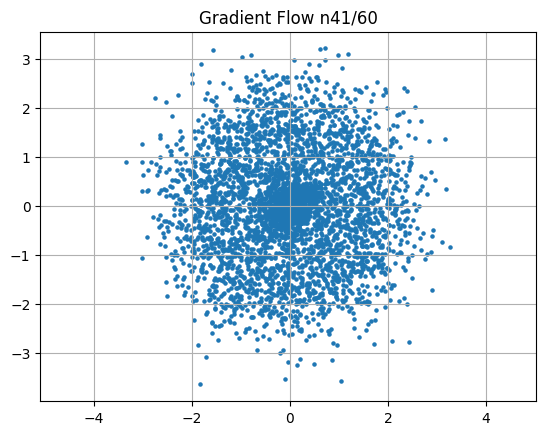

Gradient Flow n20/60 with noise level 0.6833333373069763, iter=0 | mmd=0.18132692575454712
0.04556167498230934
Gradient Flow n20/60 with noise level 0.6833333373069763, iter=1 | mmd=0.18108916282653809
0.045340150594711304
Gradient Flow n20/60 with noise level 0.6833333373069763, iter=2 | mmd=0.18085336685180664
0.04512103646993637
Gradient Flow n20/60 with noise level 0.6833333373069763, iter=3 | mmd=0.18061965703964233
0.04490429162979126
Gradient Flow n20/60 with noise level 0.6833333373069763, iter=4 | mmd=0.18038785457611084
0.04468982294201851
Gradient Flow n20/60 with noise level 0.6833333373069763, iter=5 | mmd=0.18015819787979126
0.04447760805487633
Gradient Flow n20/60 with noise level 0.6833333373069763, iter=6 | mmd=0.17993032932281494
0.04426776245236397
Gradient Flow n20/60 with noise level 0.6833333373069763, iter=7 | mmd=0.17970454692840576
0.04406009241938591
Gradient Flow n20/60 with noise level 0.6833333373069763, iter=8 | mmd=0.17948049306869507
0.04385453462600708


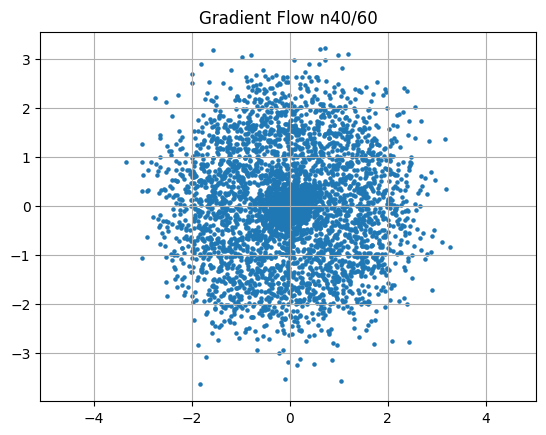

Gradient Flow n21/60 with noise level 0.6675000190734863, iter=0 | mmd=0.17903822660446167
0.04345003515481949
Gradient Flow n21/60 with noise level 0.6675000190734863, iter=1 | mmd=0.17881989479064941
0.043250881135463715
Gradient Flow n21/60 with noise level 0.6675000190734863, iter=2 | mmd=0.17860335111618042
0.043053917586803436
Gradient Flow n21/60 with noise level 0.6675000190734863, iter=3 | mmd=0.1783885359764099
0.042858850210905075
Gradient Flow n21/60 with noise level 0.6675000190734863, iter=4 | mmd=0.178175687789917
0.04266590252518654
Gradient Flow n21/60 with noise level 0.6675000190734863, iter=5 | mmd=0.17796456813812256
0.04247486591339111
Gradient Flow n21/60 with noise level 0.6675000190734863, iter=6 | mmd=0.17775511741638184
0.042285844683647156
Gradient Flow n21/60 with noise level 0.6675000190734863, iter=7 | mmd=0.17754745483398438
0.042098693549633026
Gradient Flow n21/60 with noise level 0.6675000190734863, iter=8 | mmd=0.17734146118164062
0.04191348701715469

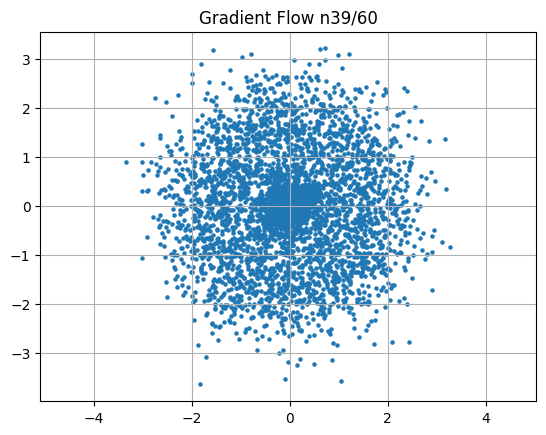

Gradient Flow n22/60 with noise level 0.6516666412353516, iter=0 | mmd=0.17693454027175903
0.04154860973358154
Gradient Flow n22/60 with noise level 0.6516666412353516, iter=1 | mmd=0.1767336130142212
0.04136894270777702
Gradient Flow n22/60 with noise level 0.6516666412353516, iter=2 | mmd=0.1765342354774475
0.04119104519486427
Gradient Flow n22/60 with noise level 0.6516666412353516, iter=3 | mmd=0.17633658647537231
0.041014935821294785
Gradient Flow n22/60 with noise level 0.6516666412353516, iter=4 | mmd=0.17614048719406128
0.04084054008126259
Gradient Flow n22/60 with noise level 0.6516666412353516, iter=5 | mmd=0.17594605684280396
0.04066791012883186
Gradient Flow n22/60 with noise level 0.6516666412353516, iter=6 | mmd=0.17575311660766602
0.04049694538116455
Gradient Flow n22/60 with noise level 0.6516666412353516, iter=7 | mmd=0.17556172609329224
0.040327638387680054
Gradient Flow n22/60 with noise level 0.6516666412353516, iter=8 | mmd=0.17537200450897217
0.04016002267599106
G

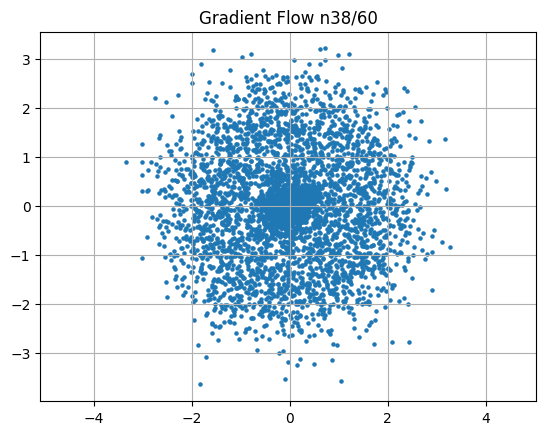

Gradient Flow n23/60 with noise level 0.6358333230018616, iter=0 | mmd=0.17499691247940063
0.03982958942651749
Gradient Flow n23/60 with noise level 0.6358333230018616, iter=1 | mmd=0.17481160163879395
0.03966681286692619
Gradient Flow n23/60 with noise level 0.6358333230018616, iter=2 | mmd=0.17462778091430664
0.03950553387403488
Gradient Flow n23/60 with noise level 0.6358333230018616, iter=3 | mmd=0.17444539070129395
0.03934583067893982
Gradient Flow n23/60 with noise level 0.6358333230018616, iter=4 | mmd=0.17426449060440063
0.039187654852867126
Gradient Flow n23/60 with noise level 0.6358333230018616, iter=5 | mmd=0.17408502101898193
0.03903093934059143
Gradient Flow n23/60 with noise level 0.6358333230018616, iter=6 | mmd=0.17390698194503784
0.038875676691532135
Gradient Flow n23/60 with noise level 0.6358333230018616, iter=7 | mmd=0.17373031377792358
0.03872193768620491
Gradient Flow n23/60 with noise level 0.6358333230018616, iter=8 | mmd=0.17355501651763916
0.03856955841183662

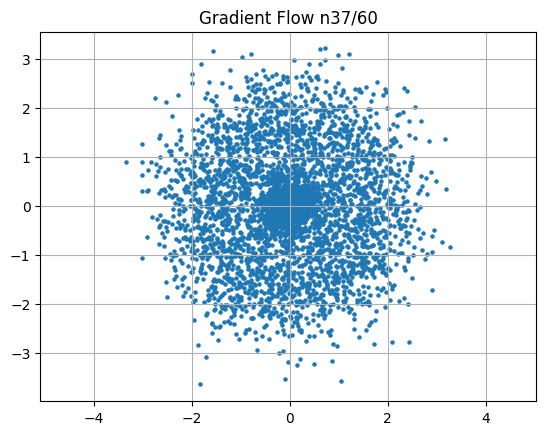

Gradient Flow n24/60 with noise level 0.6200000047683716, iter=0 | mmd=0.17320865392684937
0.03826911374926567
Gradient Flow n24/60 with noise level 0.6200000047683716, iter=1 | mmd=0.17303740978240967
0.03812098503112793
Gradient Flow n24/60 with noise level 0.6200000047683716, iter=2 | mmd=0.17286759614944458
0.03797417879104614
Gradient Flow n24/60 with noise level 0.6200000047683716, iter=3 | mmd=0.17269903421401978
0.03782873600721359
Gradient Flow n24/60 with noise level 0.6200000047683716, iter=4 | mmd=0.17253178358078003
0.0376846119761467
Gradient Flow n24/60 with noise level 0.6200000047683716, iter=5 | mmd=0.17236584424972534
0.03754175454378128
Gradient Flow n24/60 with noise level 0.6200000047683716, iter=6 | mmd=0.17220115661621094
0.03740021958947182
Gradient Flow n24/60 with noise level 0.6200000047683716, iter=7 | mmd=0.17203766107559204
0.03725995868444443
Gradient Flow n24/60 with noise level 0.6200000047683716, iter=8 | mmd=0.1718754768371582
0.03712092712521553
Gra

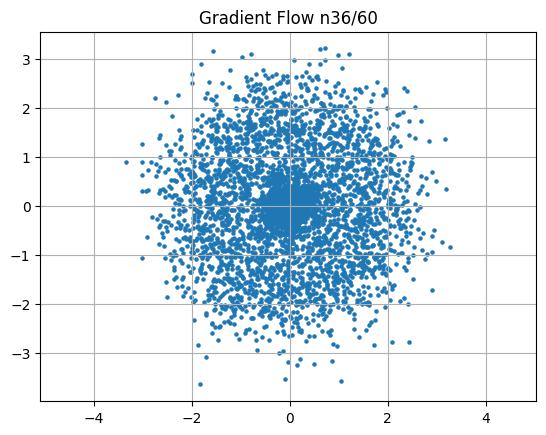

Gradient Flow n25/60 with noise level 0.6041666865348816, iter=0 | mmd=0.17155492305755615
0.036846522241830826
Gradient Flow n25/60 with noise level 0.6041666865348816, iter=1 | mmd=0.17139649391174316
0.03671117499470711
Gradient Flow n25/60 with noise level 0.6041666865348816, iter=2 | mmd=0.1712391972541809
0.036576926708221436
Gradient Flow n25/60 with noise level 0.6041666865348816, iter=3 | mmd=0.17108315229415894
0.03644389659166336
Gradient Flow n25/60 with noise level 0.6041666865348816, iter=4 | mmd=0.1709282398223877
0.036312032490968704
Gradient Flow n25/60 with noise level 0.6041666865348816, iter=5 | mmd=0.17077451944351196
0.036181285977363586
Gradient Flow n25/60 with noise level 0.6041666865348816, iter=6 | mmd=0.1706218719482422
0.03605162724852562
Gradient Flow n25/60 with noise level 0.6041666865348816, iter=7 | mmd=0.1704704761505127
0.03592310845851898
Gradient Flow n25/60 with noise level 0.6041666865348816, iter=8 | mmd=0.17032015323638916
0.03579564765095711
G

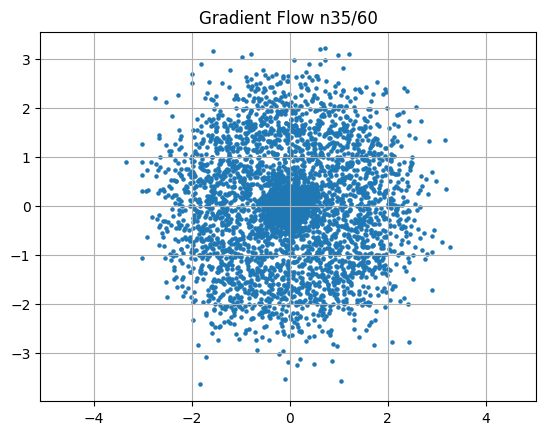

Gradient Flow n26/60 with noise level 0.5883333086967468, iter=0 | mmd=0.1700229048728943
0.035544004291296005
Gradient Flow n26/60 with noise level 0.5883333086967468, iter=1 | mmd=0.1698758602142334
0.03541978448629379
Gradient Flow n26/60 with noise level 0.5883333086967468, iter=2 | mmd=0.16973000764846802
0.0352964922785759
Gradient Flow n26/60 with noise level 0.5883333086967468, iter=3 | mmd=0.16958516836166382
0.03517434000968933
Gradient Flow n26/60 with noise level 0.5883333086967468, iter=4 | mmd=0.16944146156311035
0.0350530780851841
Gradient Flow n26/60 with noise level 0.5883333086967468, iter=5 | mmd=0.16929864883422852
0.03493284061551094
Gradient Flow n26/60 with noise level 0.5883333086967468, iter=6 | mmd=0.16915708780288696
0.03481367975473404
Gradient Flow n26/60 with noise level 0.5883333086967468, iter=7 | mmd=0.16901636123657227
0.034695323556661606
Gradient Flow n26/60 with noise level 0.5883333086967468, iter=8 | mmd=0.1688767671585083
0.03457797318696976
Grad

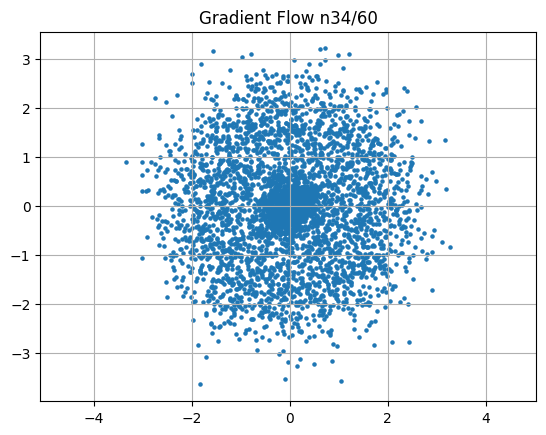

Gradient Flow n27/60 with noise level 0.5724999904632568, iter=0 | mmd=0.16860061883926392
0.03434615209698677
Gradient Flow n27/60 with noise level 0.5724999904632568, iter=1 | mmd=0.16846394538879395
0.03423154354095459
Gradient Flow n27/60 with noise level 0.5724999904632568, iter=2 | mmd=0.16832834482192993
0.03411789983510971
Gradient Flow n27/60 with noise level 0.5724999904632568, iter=3 | mmd=0.16819363832473755
0.034005146473646164
Gradient Flow n27/60 with noise level 0.5724999904632568, iter=4 | mmd=0.16806000471115112
0.03389320150017738
Gradient Flow n27/60 with noise level 0.5724999904632568, iter=5 | mmd=0.16792726516723633
0.033782247453927994
Gradient Flow n27/60 with noise level 0.5724999904632568, iter=6 | mmd=0.16779547929763794
0.03367204591631889
Gradient Flow n27/60 with noise level 0.5724999904632568, iter=7 | mmd=0.16766458749771118
0.033562660217285156
Gradient Flow n27/60 with noise level 0.5724999904632568, iter=8 | mmd=0.1675347089767456
0.03345412760972977

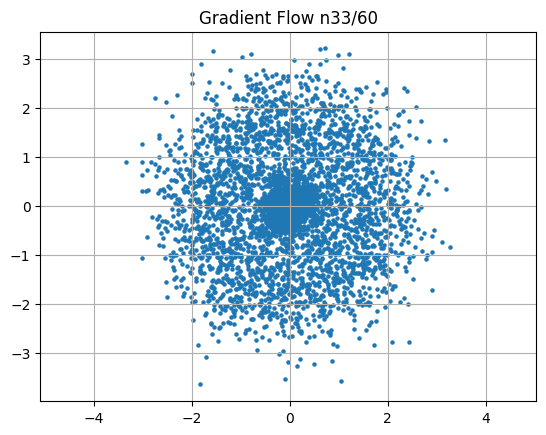

Gradient Flow n28/60 with noise level 0.5566666722297668, iter=0 | mmd=0.16727757453918457
0.03323958069086075
Gradient Flow n28/60 with noise level 0.5566666722297668, iter=1 | mmd=0.1671503782272339
0.03313346952199936
Gradient Flow n28/60 with noise level 0.5566666722297668, iter=2 | mmd=0.16702407598495483
0.03302814066410065
Gradient Flow n28/60 with noise level 0.5566666722297668, iter=3 | mmd=0.16689854860305786
0.0329236164689064
Gradient Flow n28/60 with noise level 0.5566666722297668, iter=4 | mmd=0.1667739748954773
0.032819852232933044
Gradient Flow n28/60 with noise level 0.5566666722297668, iter=5 | mmd=0.16665035486221313
0.03271680325269699
Gradient Flow n28/60 with noise level 0.5566666722297668, iter=6 | mmd=0.16652745008468628
0.032614566385746
Gradient Flow n28/60 with noise level 0.5566666722297668, iter=7 | mmd=0.16640549898147583
0.03251304104924202
Gradient Flow n28/60 with noise level 0.5566666722297668, iter=8 | mmd=0.16628432273864746
0.03241226077079773
Gradi

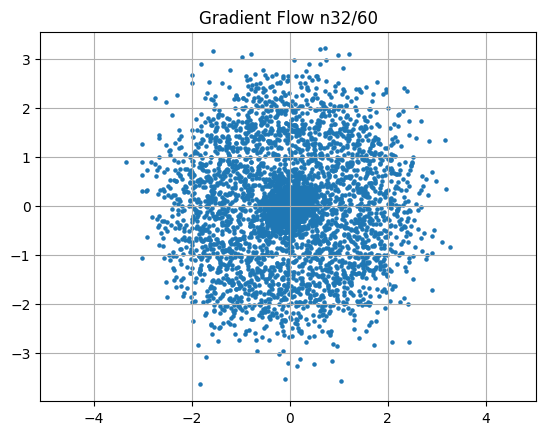

Gradient Flow n29/60 with noise level 0.5408333539962769, iter=0 | mmd=0.1660444736480713
0.0322127528488636
Gradient Flow n29/60 with noise level 0.5408333539962769, iter=1 | mmd=0.16592568159103394
0.032114069908857346
Gradient Flow n29/60 with noise level 0.5408333539962769, iter=2 | mmd=0.165807843208313
0.032016098499298096
Gradient Flow n29/60 with noise level 0.5408333539962769, iter=3 | mmd=0.16569072008132935
0.031918786466121674
Gradient Flow n29/60 with noise level 0.5408333539962769, iter=4 | mmd=0.16557443141937256
0.03182210028171539
Gradient Flow n29/60 with noise level 0.5408333539962769, iter=5 | mmd=0.16545891761779785
0.03172619640827179
Gradient Flow n29/60 with noise level 0.5408333539962769, iter=6 | mmd=0.16534417867660522
0.031630877405405045
Gradient Flow n29/60 with noise level 0.5408333539962769, iter=7 | mmd=0.1652301549911499
0.03153615444898605
Gradient Flow n29/60 with noise level 0.5408333539962769, iter=8 | mmd=0.16511690616607666
0.03144211322069168
Gr

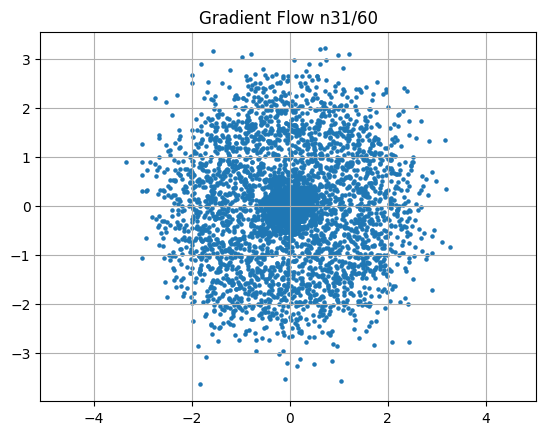

Gradient Flow n30/60 with noise level 0.5249999761581421, iter=0 | mmd=0.16489267349243164
0.03125593811273575
Gradient Flow n30/60 with noise level 0.5249999761581421, iter=1 | mmd=0.16478174924850464
0.031163839623332024
Gradient Flow n30/60 with noise level 0.5249999761581421, iter=2 | mmd=0.1646714210510254
0.031072240322828293
Gradient Flow n30/60 with noise level 0.5249999761581421, iter=3 | mmd=0.16456198692321777
0.030981209129095078
Gradient Flow n30/60 with noise level 0.5249999761581421, iter=4 | mmd=0.16445308923721313
0.030890854075551033
Gradient Flow n30/60 with noise level 0.5249999761581421, iter=5 | mmd=0.1643449068069458
0.030801095068454742
Gradient Flow n30/60 with noise level 0.5249999761581421, iter=6 | mmd=0.16423749923706055
0.030711796134710312
Gradient Flow n30/60 with noise level 0.5249999761581421, iter=7 | mmd=0.16413086652755737
0.030623264610767365
Gradient Flow n30/60 with noise level 0.5249999761581421, iter=8 | mmd=0.16402477025985718
0.03053513169288

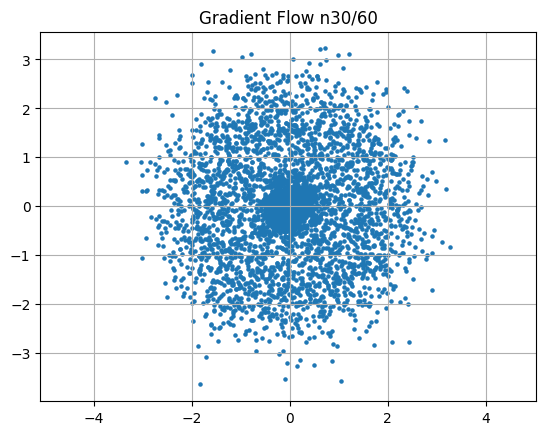

Gradient Flow n31/60 with noise level 0.5091666579246521, iter=0 | mmd=0.16381478309631348
0.030360588803887367
Gradient Flow n31/60 with noise level 0.5091666579246521, iter=1 | mmd=0.16371077299118042
0.030274154618382454
Gradient Flow n31/60 with noise level 0.5091666579246521, iter=2 | mmd=0.1636074185371399
0.03018825501203537
Gradient Flow n31/60 with noise level 0.5091666579246521, iter=3 | mmd=0.16350477933883667
0.03010294958949089
Gradient Flow n31/60 with noise level 0.5091666579246521, iter=4 | mmd=0.16340267658233643
0.030018074437975883
Gradient Flow n31/60 with noise level 0.5091666579246521, iter=5 | mmd=0.16330140829086304
0.02993375062942505
Gradient Flow n31/60 with noise level 0.5091666579246521, iter=6 | mmd=0.16320055723190308
0.029849879443645477
Gradient Flow n31/60 with noise level 0.5091666579246521, iter=7 | mmd=0.16310054063796997
0.029766594991087914
Gradient Flow n31/60 with noise level 0.5091666579246521, iter=8 | mmd=0.16300106048583984
0.029683815315365

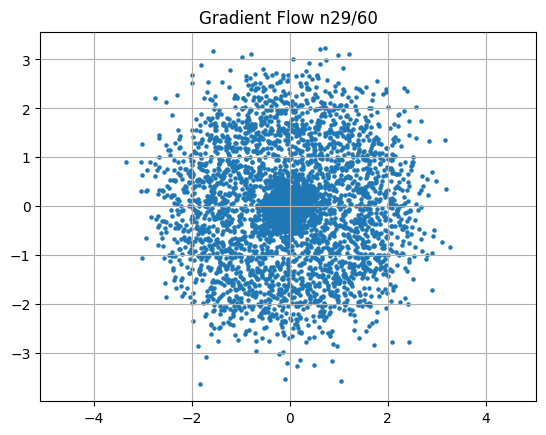

Gradient Flow n32/60 with noise level 0.4933333396911621, iter=0 | mmd=0.16280382871627808
0.02951965481042862
Gradient Flow n32/60 with noise level 0.4933333396911621, iter=1 | mmd=0.162706196308136
0.02943824604153633
Gradient Flow n32/60 with noise level 0.4933333396911621, iter=2 | mmd=0.16260915994644165
0.029357384890317917
Gradient Flow n32/60 with noise level 0.4933333396911621, iter=3 | mmd=0.16251271963119507
0.029276898130774498
Gradient Flow n32/60 with noise level 0.4933333396911621, iter=4 | mmd=0.16241687536239624
0.029196999967098236
Gradient Flow n32/60 with noise level 0.4933333396911621, iter=5 | mmd=0.1623215675354004
0.02911752462387085
Gradient Flow n32/60 with noise level 0.4933333396911621, iter=6 | mmd=0.1622268557548523
0.02903849259018898
Gradient Flow n32/60 with noise level 0.4933333396911621, iter=7 | mmd=0.16213274002075195
0.028959881514310837
Gradient Flow n32/60 with noise level 0.4933333396911621, iter=8 | mmd=0.1620391607284546
0.02888176403939724
Gr

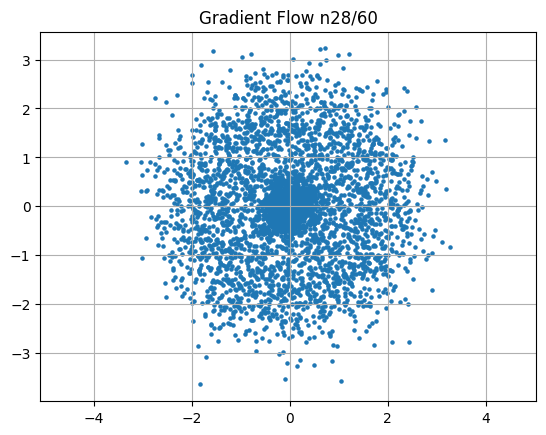

Gradient Flow n33/60 with noise level 0.47749999165534973, iter=0 | mmd=0.16185373067855835
0.028726767748594284
Gradient Flow n33/60 with noise level 0.47749999165534973, iter=1 | mmd=0.1617618203163147
0.028649918735027313
Gradient Flow n33/60 with noise level 0.47749999165534973, iter=2 | mmd=0.16167056560516357
0.02857350744307041
Gradient Flow n33/60 with noise level 0.47749999165534973, iter=3 | mmd=0.16157972812652588
0.028497500345110893
Gradient Flow n33/60 with noise level 0.47749999165534973, iter=4 | mmd=0.16148942708969116
0.028421888127923012
Gradient Flow n33/60 with noise level 0.47749999165534973, iter=5 | mmd=0.1613997220993042
0.02834669128060341
Gradient Flow n33/60 with noise level 0.47749999165534973, iter=6 | mmd=0.161310613155365
0.028272047638893127
Gradient Flow n33/60 with noise level 0.47749999165534973, iter=7 | mmd=0.1612219214439392
0.028197597712278366
Gradient Flow n33/60 with noise level 0.47749999165534973, iter=8 | mmd=0.16113370656967163
0.028123648

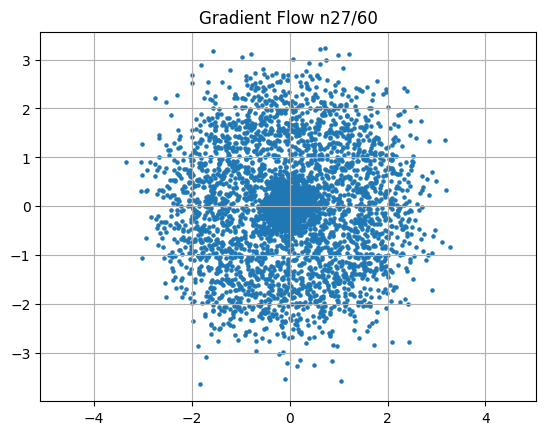

Gradient Flow n34/60 with noise level 0.46166667342185974, iter=0 | mmd=0.16095894575119019
0.027976851910352707
Gradient Flow n34/60 with noise level 0.46166667342185974, iter=1 | mmd=0.16087228059768677
0.027904028072953224
Gradient Flow n34/60 with noise level 0.46166667342185974, iter=2 | mmd=0.16078615188598633
0.027831707149744034
Gradient Flow n34/60 with noise level 0.46166667342185974, iter=3 | mmd=0.16070055961608887
0.027759626507759094
Gradient Flow n34/60 with noise level 0.46166667342185974, iter=4 | mmd=0.16061538457870483
0.027688011527061462
Gradient Flow n34/60 with noise level 0.46166667342185974, iter=5 | mmd=0.16053074598312378
0.027616655454039574
Gradient Flow n34/60 with noise level 0.46166667342185974, iter=6 | mmd=0.16044652462005615
0.027545731514692307
Gradient Flow n34/60 with noise level 0.46166667342185974, iter=7 | mmd=0.16036289930343628
0.027475103735923767
Gradient Flow n34/60 with noise level 0.46166667342185974, iter=8 | mmd=0.16027963161468506
0.02

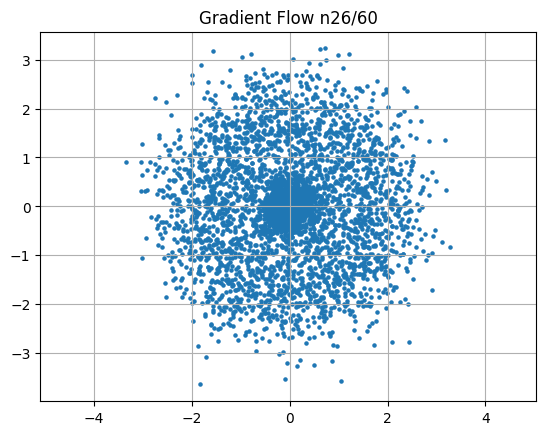

Gradient Flow n35/60 with noise level 0.44583332538604736, iter=0 | mmd=0.16011452674865723
0.0272655226290226
Gradient Flow n35/60 with noise level 0.44583332538604736, iter=1 | mmd=0.16003268957138062
0.02719639427959919
Gradient Flow n35/60 with noise level 0.44583332538604736, iter=2 | mmd=0.15995138883590698
0.027127550914883614
Gradient Flow n35/60 with noise level 0.44583332538604736, iter=3 | mmd=0.15987038612365723
0.027059057727456093
Gradient Flow n35/60 with noise level 0.44583332538604736, iter=4 | mmd=0.15978991985321045
0.026990940794348717
Gradient Flow n35/60 with noise level 0.44583332538604736, iter=5 | mmd=0.15970981121063232
0.026923108845949173
Gradient Flow n35/60 with noise level 0.44583332538604736, iter=6 | mmd=0.15963023900985718
0.026855656877160072
Gradient Flow n35/60 with noise level 0.44583332538604736, iter=7 | mmd=0.15955102443695068
0.02678854577243328
Gradient Flow n35/60 with noise level 0.44583332538604736, iter=8 | mmd=0.1594722867012024
0.0267217

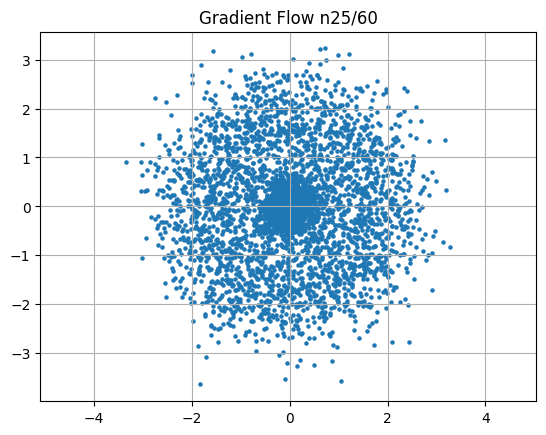

Gradient Flow n36/60 with noise level 0.4300000071525574, iter=0 | mmd=0.15931612253189087
0.026589050889015198
Gradient Flow n36/60 with noise level 0.4300000071525574, iter=1 | mmd=0.15923863649368286
0.026523159816861153
Gradient Flow n36/60 with noise level 0.4300000071525574, iter=2 | mmd=0.15916162729263306
0.02645758166909218
Gradient Flow n36/60 with noise level 0.4300000071525574, iter=3 | mmd=0.15908491611480713
0.026392389088869095
Gradient Flow n36/60 with noise level 0.4300000071525574, iter=4 | mmd=0.1590086817741394
0.026327453553676605
Gradient Flow n36/60 with noise level 0.4300000071525574, iter=5 | mmd=0.1589328646659851
0.026262806728482246
Gradient Flow n36/60 with noise level 0.4300000071525574, iter=6 | mmd=0.15885740518569946
0.026198484003543854
Gradient Flow n36/60 with noise level 0.4300000071525574, iter=7 | mmd=0.15878242254257202
0.026134448125958443
Gradient Flow n36/60 with noise level 0.4300000071525574, iter=8 | mmd=0.15870773792266846
0.02607073448598

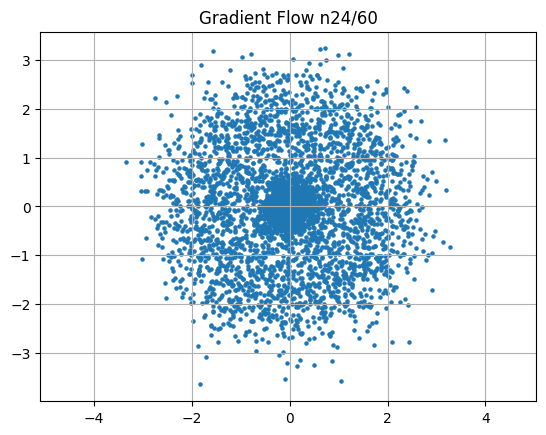

Gradient Flow n37/60 with noise level 0.414166659116745, iter=0 | mmd=0.15855973958969116
0.02594413049519062
Gradient Flow n37/60 with noise level 0.414166659116745, iter=1 | mmd=0.15848618745803833
0.02588128298521042
Gradient Flow n37/60 with noise level 0.414166659116745, iter=2 | mmd=0.15841317176818848
0.0258187148720026
Gradient Flow n37/60 with noise level 0.414166659116745, iter=3 | mmd=0.15834033489227295
0.02575640380382538
Gradient Flow n37/60 with noise level 0.414166659116745, iter=4 | mmd=0.1582680344581604
0.025694435462355614
Gradient Flow n37/60 with noise level 0.414166659116745, iter=5 | mmd=0.15819603204727173
0.025632699951529503
Gradient Flow n37/60 with noise level 0.414166659116745, iter=6 | mmd=0.1581243872642517
0.02557126060128212
Gradient Flow n37/60 with noise level 0.414166659116745, iter=7 | mmd=0.15805327892303467
0.025510065257549286
Gradient Flow n37/60 with noise level 0.414166659116745, iter=8 | mmd=0.15798228979110718
0.025449099019169807
Gradient 

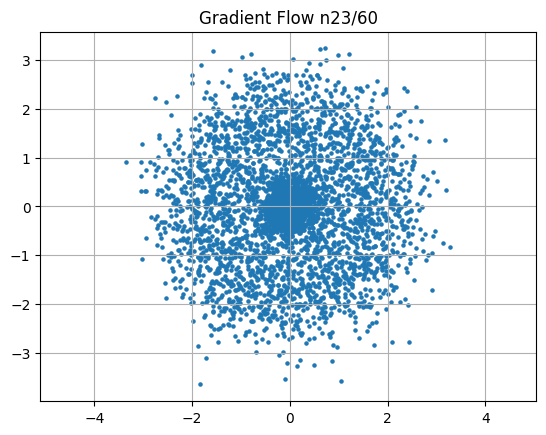

Gradient Flow n38/60 with noise level 0.398333340883255, iter=0 | mmd=0.15784162282943726
0.025328196585178375
Gradient Flow n38/60 with noise level 0.398333340883255, iter=1 | mmd=0.1577717661857605
0.02526809461414814
Gradient Flow n38/60 with noise level 0.398333340883255, iter=2 | mmd=0.1577022671699524
0.025208264589309692
Gradient Flow n38/60 with noise level 0.398333340883255, iter=3 | mmd=0.1576332449913025
0.02514868602156639
Gradient Flow n38/60 with noise level 0.398333340883255, iter=4 | mmd=0.15756440162658691
0.025089403614401817
Gradient Flow n38/60 with noise level 0.398333340883255, iter=5 | mmd=0.15749603509902954
0.02503039874136448
Gradient Flow n38/60 with noise level 0.398333340883255, iter=6 | mmd=0.15742796659469604
0.02497147023677826
Gradient Flow n38/60 with noise level 0.398333340883255, iter=7 | mmd=0.15736019611358643
0.024912919849157333
Gradient Flow n38/60 with noise level 0.398333340883255, iter=8 | mmd=0.15729272365570068
0.02485465444624424
Gradient 

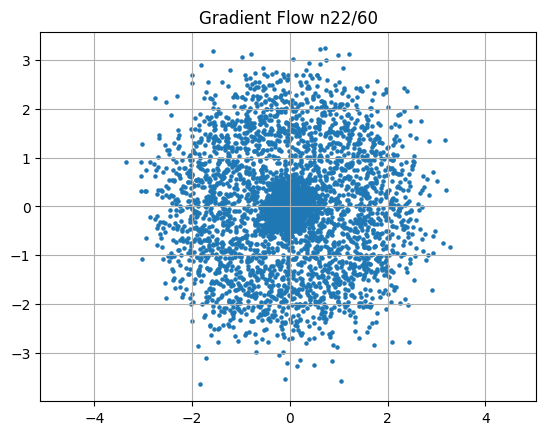

Gradient Flow n39/60 with noise level 0.3824999928474426, iter=0 | mmd=0.15715885162353516
0.024738840758800507
Gradient Flow n39/60 with noise level 0.3824999928474426, iter=1 | mmd=0.1570923924446106
0.02468135580420494
Gradient Flow n39/60 with noise level 0.3824999928474426, iter=2 | mmd=0.1570262312889099
0.024623945355415344
Gradient Flow n39/60 with noise level 0.3824999928474426, iter=3 | mmd=0.15696048736572266
0.02456699125468731
Gradient Flow n39/60 with noise level 0.3824999928474426, iter=4 | mmd=0.1568949818611145
0.024510102346539497
Gradient Flow n39/60 with noise level 0.3824999928474426, iter=5 | mmd=0.15682977437973022
0.024453550577163696
Gradient Flow n39/60 with noise level 0.3824999928474426, iter=6 | mmd=0.1567649245262146
0.02439710684120655
Gradient Flow n39/60 with noise level 0.3824999928474426, iter=7 | mmd=0.15670037269592285
0.024341067299246788
Gradient Flow n39/60 with noise level 0.3824999928474426, iter=8 | mmd=0.15663611888885498
0.02428518608212471


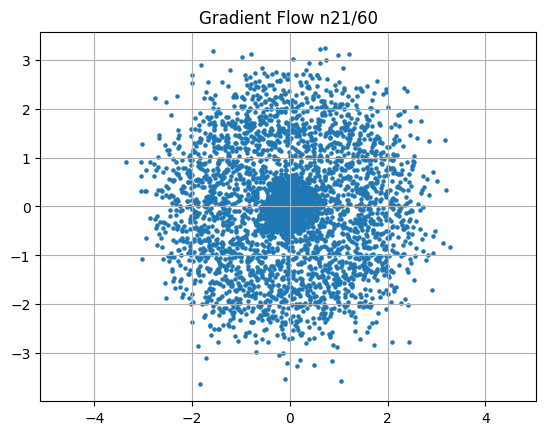

Gradient Flow n40/60 with noise level 0.36666667461395264, iter=0 | mmd=0.15650856494903564
0.024174083024263382
Gradient Flow n40/60 with noise level 0.36666667461395264, iter=1 | mmd=0.1564452052116394
0.024118991568684578
Gradient Flow n40/60 with noise level 0.36666667461395264, iter=2 | mmd=0.15638214349746704
0.02406405285000801
Gradient Flow n40/60 with noise level 0.36666667461395264, iter=3 | mmd=0.15631943941116333
0.024009279906749725
Gradient Flow n40/60 with noise level 0.36666667461395264, iter=4 | mmd=0.15625685453414917
0.02395476959645748
Gradient Flow n40/60 with noise level 0.36666667461395264, iter=5 | mmd=0.15619468688964844
0.02390042319893837
Gradient Flow n40/60 with noise level 0.36666667461395264, iter=6 | mmd=0.15613281726837158
0.023846415802836418
Gradient Flow n40/60 with noise level 0.36666667461395264, iter=7 | mmd=0.15607118606567383
0.023792603984475136
Gradient Flow n40/60 with noise level 0.36666667461395264, iter=8 | mmd=0.15600985288619995
0.023738

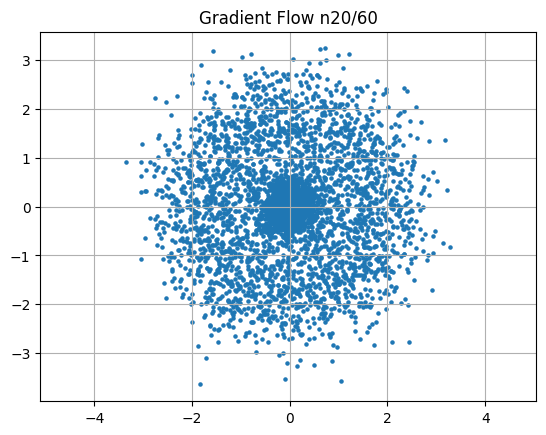

Gradient Flow n41/60 with noise level 0.35083332657814026, iter=0 | mmd=0.15588808059692383
0.023632343858480453
Gradient Flow n41/60 with noise level 0.35083332657814026, iter=1 | mmd=0.1558275818824768
0.023579416796565056
Gradient Flow n41/60 with noise level 0.35083332657814026, iter=2 | mmd=0.1557673215866089
0.02352655678987503
Gradient Flow n41/60 with noise level 0.35083332657814026, iter=3 | mmd=0.15570735931396484
0.023474061861634254
Gradient Flow n41/60 with noise level 0.35083332657814026, iter=4 | mmd=0.15564775466918945
0.023421727120876312
Gradient Flow n41/60 with noise level 0.35083332657814026, iter=5 | mmd=0.1555883288383484
0.023369643837213516
Gradient Flow n41/60 with noise level 0.35083332657814026, iter=6 | mmd=0.1555292010307312
0.02331765927374363
Gradient Flow n41/60 with noise level 0.35083332657814026, iter=7 | mmd=0.15547025203704834
0.02326599508523941
Gradient Flow n41/60 with noise level 0.35083332657814026, iter=8 | mmd=0.15541160106658936
0.023214412

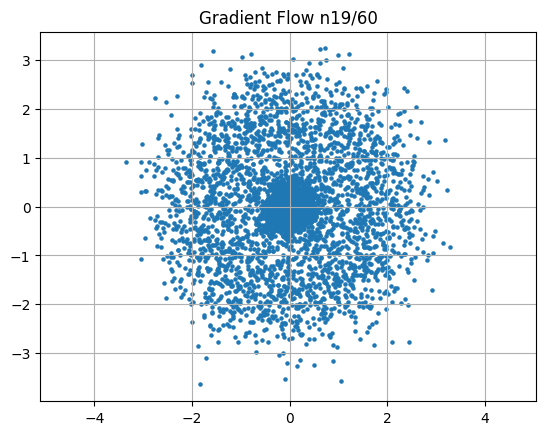

Gradient Flow n42/60 with noise level 0.33500000834465027, iter=0 | mmd=0.15529513359069824
0.023112023249268532
Gradient Flow n42/60 with noise level 0.33500000834465027, iter=1 | mmd=0.1552373766899109
0.023061159998178482
Gradient Flow n42/60 with noise level 0.33500000834465027, iter=2 | mmd=0.15517973899841309
0.023010428994894028
Gradient Flow n42/60 with noise level 0.33500000834465027, iter=3 | mmd=0.15512233972549438
0.02295992150902748
Gradient Flow n42/60 with noise level 0.33500000834465027, iter=4 | mmd=0.15506529808044434
0.022909631952643394
Gradient Flow n42/60 with noise level 0.33500000834465027, iter=5 | mmd=0.15500837564468384
0.022859586402773857
Gradient Flow n42/60 with noise level 0.33500000834465027, iter=6 | mmd=0.154951810836792
0.02280956692993641
Gradient Flow n42/60 with noise level 0.33500000834465027, iter=7 | mmd=0.15489548444747925
0.022759882733225822
Gradient Flow n42/60 with noise level 0.33500000834465027, iter=8 | mmd=0.15483933687210083
0.0227102

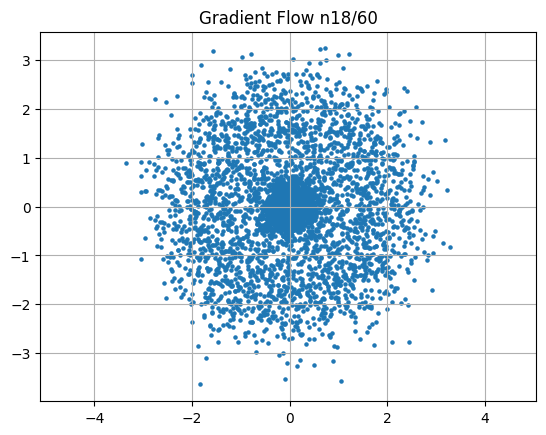

Gradient Flow n43/60 with noise level 0.3191666603088379, iter=0 | mmd=0.15472787618637085
0.022611845284700394
Gradient Flow n43/60 with noise level 0.3191666603088379, iter=1 | mmd=0.15467244386672974
0.02256290800869465
Gradient Flow n43/60 with noise level 0.3191666603088379, iter=2 | mmd=0.1546173095703125
0.02251405455172062
Gradient Flow n43/60 with noise level 0.3191666603088379, iter=3 | mmd=0.15456229448318481
0.022465573623776436
Gradient Flow n43/60 with noise level 0.3191666603088379, iter=4 | mmd=0.15450763702392578
0.02241712622344494
Gradient Flow n43/60 with noise level 0.3191666603088379, iter=5 | mmd=0.15445315837860107
0.022368934005498886
Gradient Flow n43/60 with noise level 0.3191666603088379, iter=6 | mmd=0.15439891815185547
0.022320950403809547
Gradient Flow n43/60 with noise level 0.3191666603088379, iter=7 | mmd=0.15434491634368896
0.02227306365966797
Gradient Flow n43/60 with noise level 0.3191666603088379, iter=8 | mmd=0.1542910933494568
0.02222544327378273

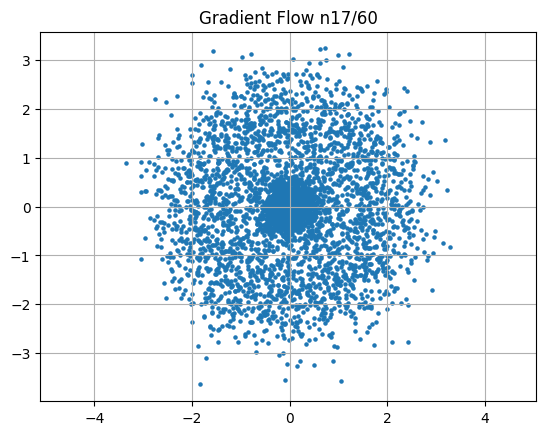

Gradient Flow n44/60 with noise level 0.3033333420753479, iter=0 | mmd=0.15418416261672974
0.02213062345981598
Gradient Flow n44/60 with noise level 0.3033333420753479, iter=1 | mmd=0.15413111448287964
0.022083548828959465
Gradient Flow n44/60 with noise level 0.3033333420753479, iter=2 | mmd=0.15407812595367432
0.022036554291844368
Gradient Flow n44/60 with noise level 0.3033333420753479, iter=3 | mmd=0.15402555465698242
0.021989865228533745
Gradient Flow n44/60 with noise level 0.3033333420753479, iter=4 | mmd=0.15397310256958008
0.021943198516964912
Gradient Flow n44/60 with noise level 0.3033333420753479, iter=5 | mmd=0.15392076969146729
0.02189684472978115
Gradient Flow n44/60 with noise level 0.3033333420753479, iter=6 | mmd=0.15386879444122314
0.021850625053048134
Gradient Flow n44/60 with noise level 0.3033333420753479, iter=7 | mmd=0.15381693840026855
0.02180452272295952
Gradient Flow n44/60 with noise level 0.3033333420753479, iter=8 | mmd=0.15376538038253784
0.02175865322351

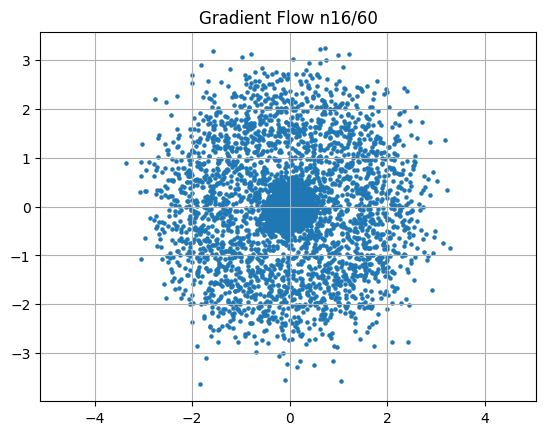

Gradient Flow n45/60 with noise level 0.2874999940395355, iter=0 | mmd=0.15366268157958984
0.021667394787073135
Gradient Flow n45/60 with noise level 0.2874999940395355, iter=1 | mmd=0.1536116600036621
0.02162204682826996
Gradient Flow n45/60 with noise level 0.2874999940395355, iter=2 | mmd=0.15356087684631348
0.021576808765530586
Gradient Flow n45/60 with noise level 0.2874999940395355, iter=3 | mmd=0.15351027250289917
0.021531810984015465
Gradient Flow n45/60 with noise level 0.2874999940395355, iter=4 | mmd=0.15346002578735352
0.021486934274435043
Gradient Flow n45/60 with noise level 0.2874999940395355, iter=5 | mmd=0.15340977907180786
0.021442251279950142
Gradient Flow n45/60 with noise level 0.2874999940395355, iter=6 | mmd=0.1533597707748413
0.021397681906819344
Gradient Flow n45/60 with noise level 0.2874999940395355, iter=7 | mmd=0.15331000089645386
0.021353285759687424
Gradient Flow n45/60 with noise level 0.2874999940395355, iter=8 | mmd=0.15326035022735596
0.02130912616848

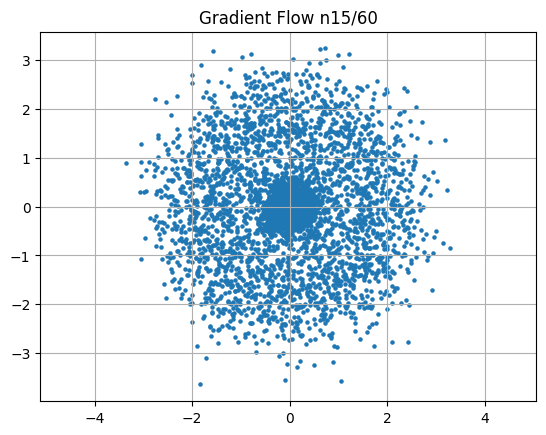

Gradient Flow n46/60 with noise level 0.27166667580604553, iter=0 | mmd=0.15316170454025269
0.0212212186306715
Gradient Flow n46/60 with noise level 0.27166667580604553, iter=1 | mmd=0.1531127691268921
0.021177487447857857
Gradient Flow n46/60 with noise level 0.27166667580604553, iter=2 | mmd=0.15306395292282104
0.021133938804268837
Gradient Flow n46/60 with noise level 0.27166667580604553, iter=3 | mmd=0.1530153751373291
0.021090570837259293
Gradient Flow n46/60 with noise level 0.27166667580604553, iter=4 | mmd=0.15296679735183716
0.02104726992547512
Gradient Flow n46/60 with noise level 0.27166667580604553, iter=5 | mmd=0.15291857719421387
0.02100427635014057
Gradient Flow n46/60 with noise level 0.27166667580604553, iter=6 | mmd=0.1528705358505249
0.020961333066225052
Gradient Flow n46/60 with noise level 0.27166667580604553, iter=7 | mmd=0.15282267332077026
0.020918631926178932
Gradient Flow n46/60 with noise level 0.27166667580604553, iter=8 | mmd=0.1527748703956604
0.0208759419

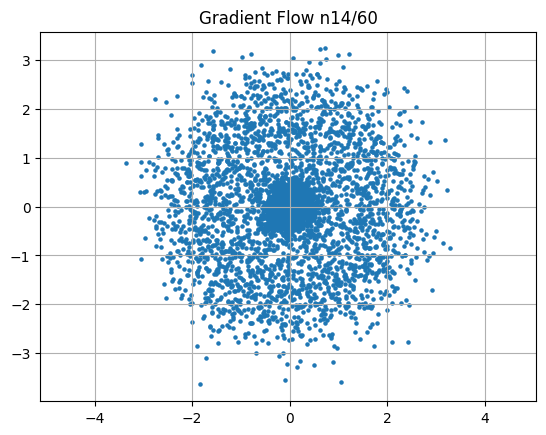

Gradient Flow n47/60 with noise level 0.25583332777023315, iter=0 | mmd=0.15268009901046753
0.0207911878824234
Gradient Flow n47/60 with noise level 0.25583332777023315, iter=1 | mmd=0.15263289213180542
0.020749034360051155
Gradient Flow n47/60 with noise level 0.25583332777023315, iter=2 | mmd=0.1525859236717224
0.020707083866000175
Gradient Flow n47/60 with noise level 0.25583332777023315, iter=3 | mmd=0.15253913402557373
0.020665239542722702
Gradient Flow n47/60 with noise level 0.25583332777023315, iter=4 | mmd=0.15249252319335938
0.020623618736863136
Gradient Flow n47/60 with noise level 0.25583332777023315, iter=5 | mmd=0.15244615077972412
0.020582057535648346
Gradient Flow n47/60 with noise level 0.25583332777023315, iter=6 | mmd=0.15239983797073364
0.020540688186883926
Gradient Flow n47/60 with noise level 0.25583332777023315, iter=7 | mmd=0.15235376358032227
0.02049941010773182
Gradient Flow n47/60 with noise level 0.25583332777023315, iter=8 | mmd=0.15230780839920044
0.020458

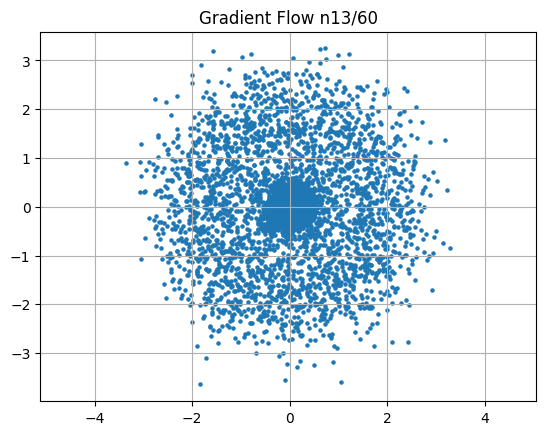

Gradient Flow n48/60 with noise level 0.23999999463558197, iter=0 | mmd=0.15221649408340454
0.02037663757801056
Gradient Flow n48/60 with noise level 0.23999999463558197, iter=1 | mmd=0.15217113494873047
0.020336028188467026
Gradient Flow n48/60 with noise level 0.23999999463558197, iter=2 | mmd=0.15212583541870117
0.02029559202492237
Gradient Flow n48/60 with noise level 0.23999999463558197, iter=3 | mmd=0.15208077430725098
0.02025524526834488
Gradient Flow n48/60 with noise level 0.23999999463558197, iter=4 | mmd=0.15203583240509033
0.020215019583702087
Gradient Flow n48/60 with noise level 0.23999999463558197, iter=5 | mmd=0.151991069316864
0.020175011828541756
Gradient Flow n48/60 with noise level 0.23999999463558197, iter=6 | mmd=0.15194648504257202
0.020135030150413513
Gradient Flow n48/60 with noise level 0.23999999463558197, iter=7 | mmd=0.15190213918685913
0.020095301792025566
Gradient Flow n48/60 with noise level 0.23999999463558197, iter=8 | mmd=0.15185779333114624
0.0200557

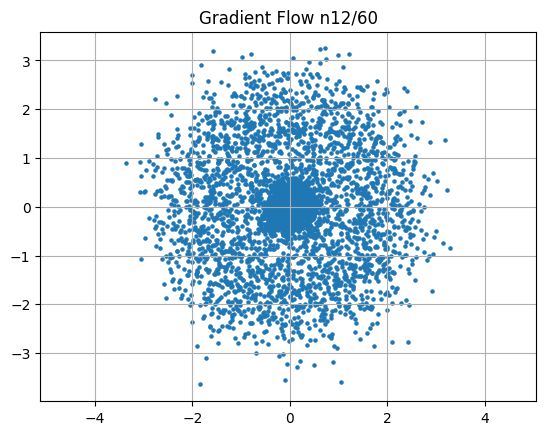

Gradient Flow n49/60 with noise level 0.2241666615009308, iter=0 | mmd=0.15176981687545776
0.019976895302534103
Gradient Flow n49/60 with noise level 0.2241666615009308, iter=1 | mmd=0.15172606706619263
0.019937660545110703
Gradient Flow n49/60 with noise level 0.2241666615009308, iter=2 | mmd=0.15168243646621704
0.019898641854524612
Gradient Flow n49/60 with noise level 0.2241666615009308, iter=3 | mmd=0.15163898468017578
0.019859716296195984
Gradient Flow n49/60 with noise level 0.2241666615009308, iter=4 | mmd=0.15159571170806885
0.01982099749147892
Gradient Flow n49/60 with noise level 0.2241666615009308, iter=5 | mmd=0.15155255794525146
0.019782332703471184
Gradient Flow n49/60 with noise level 0.2241666615009308, iter=6 | mmd=0.1515095829963684
0.019743720069527626
Gradient Flow n49/60 with noise level 0.2241666615009308, iter=7 | mmd=0.1514667272567749
0.01970541663467884
Gradient Flow n49/60 with noise level 0.2241666615009308, iter=8 | mmd=0.15142405033111572
0.019667234271764

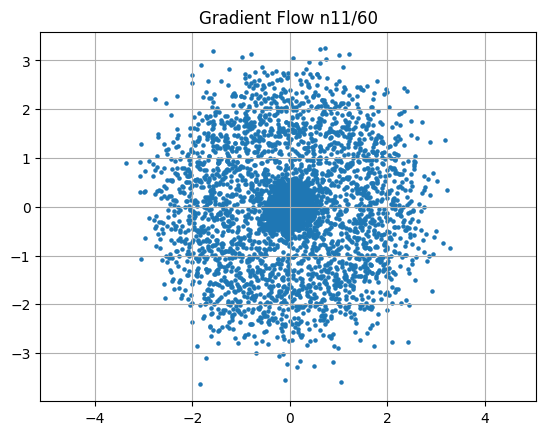

Gradient Flow n50/60 with noise level 0.2083333283662796, iter=0 | mmd=0.15133917331695557
0.0195911917835474
Gradient Flow n50/60 with noise level 0.2083333283662796, iter=1 | mmd=0.1512969732284546
0.01955336332321167
Gradient Flow n50/60 with noise level 0.2083333283662796, iter=2 | mmd=0.15125489234924316
0.019515668973326683
Gradient Flow n50/60 with noise level 0.2083333283662796, iter=3 | mmd=0.1512128710746765
0.01947818323969841
Gradient Flow n50/60 with noise level 0.2083333283662796, iter=4 | mmd=0.15117114782333374
0.019440708681941032
Gradient Flow n50/60 with noise level 0.2083333283662796, iter=5 | mmd=0.15112948417663574
0.019403403624892235
Gradient Flow n50/60 with noise level 0.2083333283662796, iter=6 | mmd=0.15108799934387207
0.01936625875532627
Gradient Flow n50/60 with noise level 0.2083333283662796, iter=7 | mmd=0.15104663372039795
0.019329287111759186
Gradient Flow n50/60 with noise level 0.2083333283662796, iter=8 | mmd=0.15100550651550293
0.01929231733083725


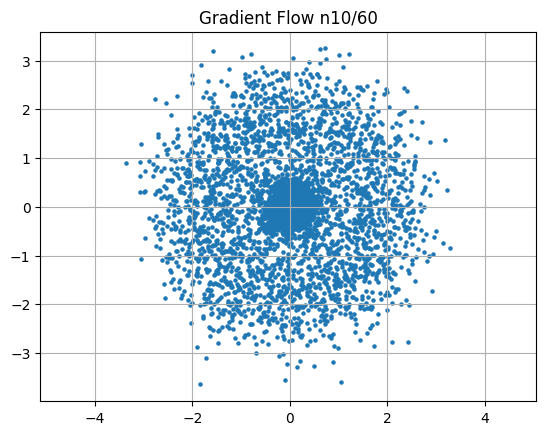

Gradient Flow n51/60 with noise level 0.19249999523162842, iter=0 | mmd=0.15092355012893677
0.019218983128666878
Gradient Flow n51/60 with noise level 0.19249999523162842, iter=1 | mmd=0.15088272094726562
0.019182441756129265
Gradient Flow n51/60 with noise level 0.19249999523162842, iter=2 | mmd=0.15084218978881836
0.01914610154926777
Gradient Flow n51/60 with noise level 0.19249999523162842, iter=3 | mmd=0.15080171823501587
0.019109776243567467
Gradient Flow n51/60 with noise level 0.19249999523162842, iter=4 | mmd=0.15076130628585815
0.019073771312832832
Gradient Flow n51/60 with noise level 0.19249999523162842, iter=5 | mmd=0.15072119235992432
0.019037703052163124
Gradient Flow n51/60 with noise level 0.19249999523162842, iter=6 | mmd=0.15068107843399048
0.019001811742782593
Gradient Flow n51/60 with noise level 0.19249999523162842, iter=7 | mmd=0.15064114332199097
0.018966104835271835
Gradient Flow n51/60 with noise level 0.19249999523162842, iter=8 | mmd=0.15060138702392578
0.018

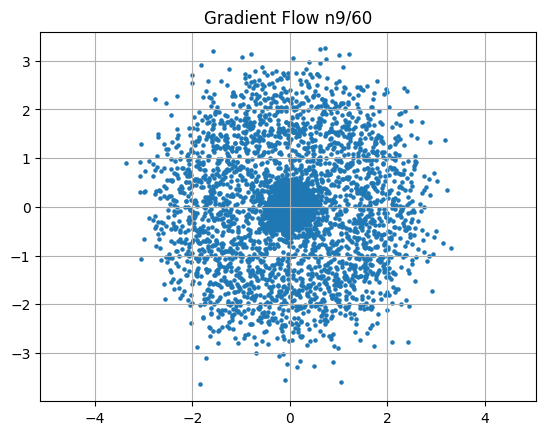

Gradient Flow n52/60 with noise level 0.17666666209697723, iter=0 | mmd=0.1505221724510193
0.018859636038541794
Gradient Flow n52/60 with noise level 0.17666666209697723, iter=1 | mmd=0.15048277378082275
0.01882433332502842
Gradient Flow n52/60 with noise level 0.17666666209697723, iter=2 | mmd=0.15044349431991577
0.01878928393125534
Gradient Flow n52/60 with noise level 0.17666666209697723, iter=3 | mmd=0.1504044532775879
0.018754281103610992
Gradient Flow n52/60 with noise level 0.17666666209697723, iter=4 | mmd=0.15036541223526
0.018719462677836418
Gradient Flow n52/60 with noise level 0.17666666209697723, iter=5 | mmd=0.15032660961151123
0.018684662878513336
Gradient Flow n52/60 with noise level 0.17666666209697723, iter=6 | mmd=0.15028786659240723
0.018650038167834282
Gradient Flow n52/60 with noise level 0.17666666209697723, iter=7 | mmd=0.15024930238723755
0.018615545704960823
Gradient Flow n52/60 with noise level 0.17666666209697723, iter=8 | mmd=0.15021085739135742
0.018581109

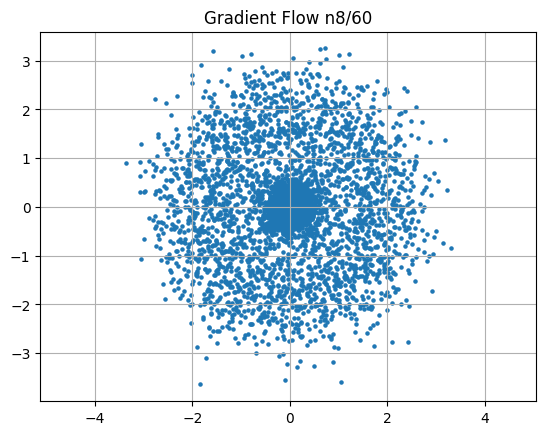

Gradient Flow n53/60 with noise level 0.16083332896232605, iter=0 | mmd=0.15013426542282104
0.01851269230246544
Gradient Flow n53/60 with noise level 0.16083332896232605, iter=1 | mmd=0.15009623765945435
0.01847865805029869
Gradient Flow n53/60 with noise level 0.16083332896232605, iter=2 | mmd=0.15005826950073242
0.018444744870066643
Gradient Flow n53/60 with noise level 0.16083332896232605, iter=3 | mmd=0.15002042055130005
0.018410947173833847
Gradient Flow n53/60 with noise level 0.16083332896232605, iter=4 | mmd=0.14998281002044678
0.018377305939793587
Gradient Flow n53/60 with noise level 0.16083332896232605, iter=5 | mmd=0.14994513988494873
0.018343722447752953
Gradient Flow n53/60 with noise level 0.16083332896232605, iter=6 | mmd=0.14990770816802979
0.0183103047311306
Gradient Flow n53/60 with noise level 0.16083332896232605, iter=7 | mmd=0.14987045526504517
0.018276985734701157
Gradient Flow n53/60 with noise level 0.16083332896232605, iter=8 | mmd=0.14983326196670532
0.018243

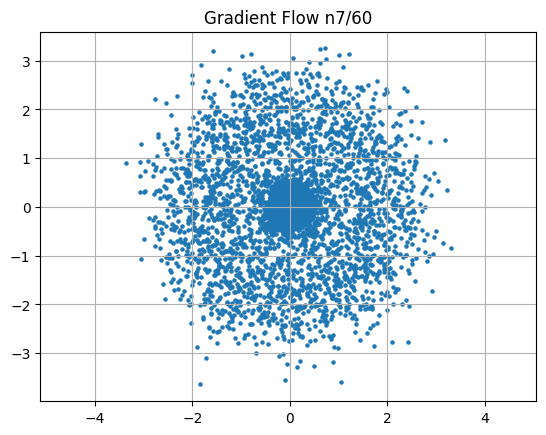

Gradient Flow n54/60 with noise level 0.14499999582767487, iter=0 | mmd=0.1497591733932495
0.01817767322063446
Gradient Flow n54/60 with noise level 0.14499999582767487, iter=1 | mmd=0.1497223973274231
0.018144777044653893
Gradient Flow n54/60 with noise level 0.14499999582767487, iter=2 | mmd=0.14968568086624146
0.018112050369381905
Gradient Flow n54/60 with noise level 0.14499999582767487, iter=3 | mmd=0.14964908361434937
0.018079407513141632
Gradient Flow n54/60 with noise level 0.14499999582767487, iter=4 | mmd=0.14961260557174683
0.018046827986836433
Gradient Flow n54/60 with noise level 0.14499999582767487, iter=5 | mmd=0.1495763063430786
0.01801440864801407
Gradient Flow n54/60 with noise level 0.14499999582767487, iter=6 | mmd=0.14954006671905518
0.017982203513383865
Gradient Flow n54/60 with noise level 0.14499999582767487, iter=7 | mmd=0.1495038866996765
0.01794997788965702
Gradient Flow n54/60 with noise level 0.14499999582767487, iter=8 | mmd=0.14946794509887695
0.017917854

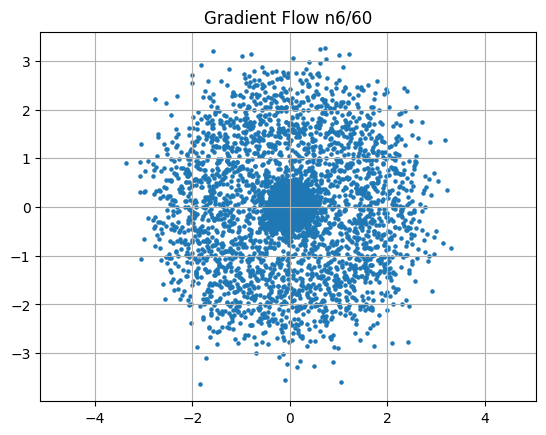

Gradient Flow n55/60 with noise level 0.12916666269302368, iter=0 | mmd=0.14939630031585693
0.017854010686278343
Gradient Flow n55/60 with noise level 0.12916666269302368, iter=1 | mmd=0.14936059713363647
0.017822252586483955
Gradient Flow n55/60 with noise level 0.12916666269302368, iter=2 | mmd=0.1493251919746399
0.017790619283914566
Gradient Flow n55/60 with noise level 0.12916666269302368, iter=3 | mmd=0.14928966760635376
0.017759127542376518
Gradient Flow n55/60 with noise level 0.12916666269302368, iter=4 | mmd=0.14925438165664673
0.017727607861161232
Gradient Flow n55/60 with noise level 0.12916666269302368, iter=5 | mmd=0.14921915531158447
0.017696332186460495
Gradient Flow n55/60 with noise level 0.12916666269302368, iter=6 | mmd=0.14918416738510132
0.017665144056081772
Gradient Flow n55/60 with noise level 0.12916666269302368, iter=7 | mmd=0.1491491198539734
0.01763395220041275
Gradient Flow n55/60 with noise level 0.12916666269302368, iter=8 | mmd=0.14911431074142456
0.01760

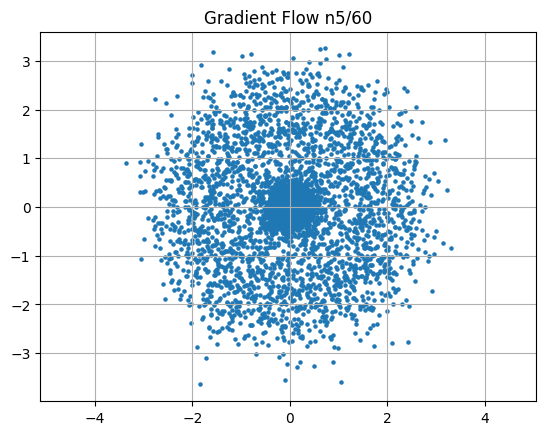

Gradient Flow n56/60 with noise level 0.1133333370089531, iter=0 | mmd=0.149044930934906
0.017541293054819107
Gradient Flow n56/60 with noise level 0.1133333370089531, iter=1 | mmd=0.14901041984558105
0.017510661855340004
Gradient Flow n56/60 with noise level 0.1133333370089531, iter=2 | mmd=0.14897596836090088
0.01748005673289299
Gradient Flow n56/60 with noise level 0.1133333370089531, iter=3 | mmd=0.14894163608551025
0.01744953729212284
Gradient Flow n56/60 with noise level 0.1133333370089531, iter=4 | mmd=0.14890748262405396
0.017419185489416122
Gradient Flow n56/60 with noise level 0.1133333370089531, iter=5 | mmd=0.14887338876724243
0.017388945445418358
Gradient Flow n56/60 with noise level 0.1133333370089531, iter=6 | mmd=0.14883941411972046
0.01735871657729149
Gradient Flow n56/60 with noise level 0.1133333370089531, iter=7 | mmd=0.14880555868148804
0.017328660935163498
Gradient Flow n56/60 with noise level 0.1133333370089531, iter=8 | mmd=0.1487717628479004
0.01729873195290565

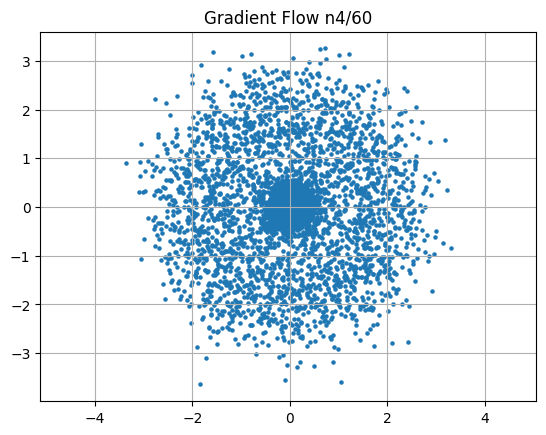

Gradient Flow n57/60 with noise level 0.09749999642372131, iter=0 | mmd=0.14870458841323853
0.017239151522517204
Gradient Flow n57/60 with noise level 0.09749999642372131, iter=1 | mmd=0.14867115020751953
0.017209433019161224
Gradient Flow n57/60 with noise level 0.09749999642372131, iter=2 | mmd=0.1486377716064453
0.017179861664772034
Gradient Flow n57/60 with noise level 0.09749999642372131, iter=3 | mmd=0.14860451221466064
0.017150411382317543
Gradient Flow n57/60 with noise level 0.09749999642372131, iter=4 | mmd=0.1485714316368103
0.017121097072958946
Gradient Flow n57/60 with noise level 0.09749999642372131, iter=5 | mmd=0.14853835105895996
0.01709178276360035
Gradient Flow n57/60 with noise level 0.09749999642372131, iter=6 | mmd=0.14850538969039917
0.01706266961991787
Gradient Flow n57/60 with noise level 0.09749999642372131, iter=7 | mmd=0.1484726071357727
0.017033560201525688
Gradient Flow n57/60 with noise level 0.09749999642372131, iter=8 | mmd=0.14843988418579102
0.0170045

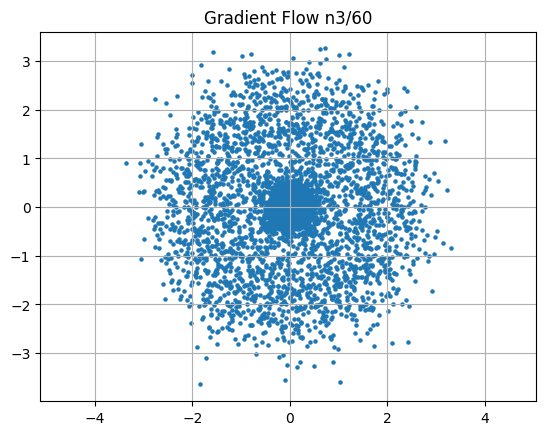

Gradient Flow n58/60 with noise level 0.08166666328907013, iter=0 | mmd=0.1483747363090515
0.016946924850344658
Gradient Flow n58/60 with noise level 0.08166666328907013, iter=1 | mmd=0.1483423113822937
0.01691831648349762
Gradient Flow n58/60 with noise level 0.08166666328907013, iter=2 | mmd=0.14831000566482544
0.016889743506908417
Gradient Flow n58/60 with noise level 0.08166666328907013, iter=3 | mmd=0.14827775955200195
0.01686118170619011
Gradient Flow n58/60 with noise level 0.08166666328907013, iter=4 | mmd=0.14824557304382324
0.01683281920850277
Gradient Flow n58/60 with noise level 0.08166666328907013, iter=5 | mmd=0.14821356534957886
0.01680459827184677
Gradient Flow n58/60 with noise level 0.08166666328907013, iter=6 | mmd=0.14818167686462402
0.016776375472545624
Gradient Flow n58/60 with noise level 0.08166666328907013, iter=7 | mmd=0.14814984798431396
0.01674828678369522
Gradient Flow n58/60 with noise level 0.08166666328907013, iter=8 | mmd=0.14811813831329346
0.016720289

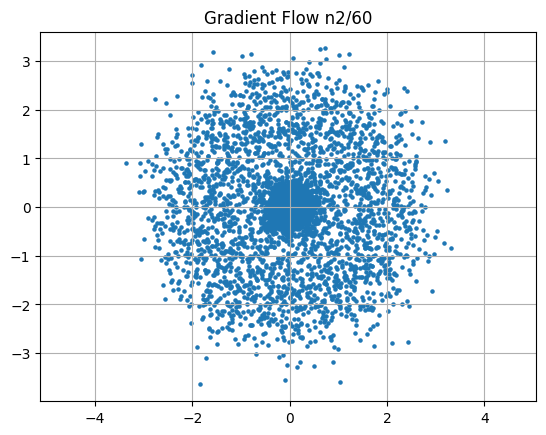

Gradient Flow n59/60 with noise level 0.06583333015441895, iter=0 | mmd=0.14805489778518677
0.01666448824107647
Gradient Flow n59/60 with noise level 0.06583333015441895, iter=1 | mmd=0.14802348613739014
0.016636798158288002
Gradient Flow n59/60 with noise level 0.06583333015441895, iter=2 | mmd=0.14799219369888306
0.01660916395485401
Gradient Flow n59/60 with noise level 0.06583333015441895, iter=3 | mmd=0.14796090126037598
0.016581615433096886
Gradient Flow n59/60 with noise level 0.06583333015441895, iter=4 | mmd=0.14792972803115845
0.016554158180952072
Gradient Flow n59/60 with noise level 0.06583333015441895, iter=5 | mmd=0.14789867401123047
0.01652679592370987
Gradient Flow n59/60 with noise level 0.06583333015441895, iter=6 | mmd=0.14786767959594727
0.016499601304531097
Gradient Flow n59/60 with noise level 0.06583333015441895, iter=7 | mmd=0.14783668518066406
0.01647244580090046
Gradient Flow n59/60 with noise level 0.06583333015441895, iter=8 | mmd=0.14780598878860474
0.016445

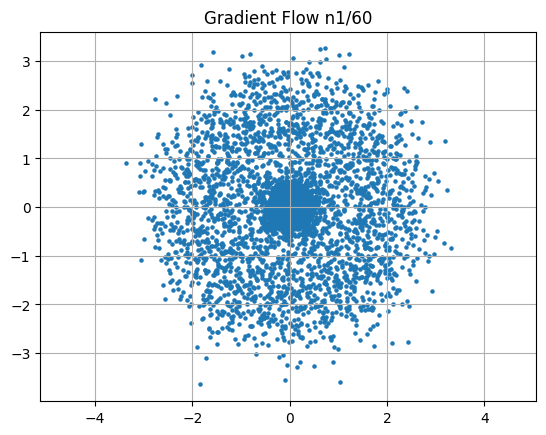

Gradient Flow n60/60 with noise level 0.05000000074505806, iter=0 | mmd=0.1477447748184204
0.016391415148973465
Gradient Flow n60/60 with noise level 0.05000000074505806, iter=1 | mmd=0.14771419763565063
0.016364561393857002
Gradient Flow n60/60 with noise level 0.05000000074505806, iter=2 | mmd=0.14768379926681519
0.016337886452674866
Gradient Flow n60/60 with noise level 0.05000000074505806, iter=3 | mmd=0.14765340089797974
0.016311295330524445
Gradient Flow n60/60 with noise level 0.05000000074505806, iter=4 | mmd=0.1476232409477234
0.01628468744456768
Gradient Flow n60/60 with noise level 0.05000000074505806, iter=5 | mmd=0.14759302139282227
0.016258209943771362
Gradient Flow n60/60 with noise level 0.05000000074505806, iter=6 | mmd=0.14756298065185547
0.01623188890516758
Gradient Flow n60/60 with noise level 0.05000000074505806, iter=7 | mmd=0.14753299951553345
0.016205573454499245
Gradient Flow n60/60 with noise level 0.05000000074505806, iter=8 | mmd=0.14750313758850098
0.016179

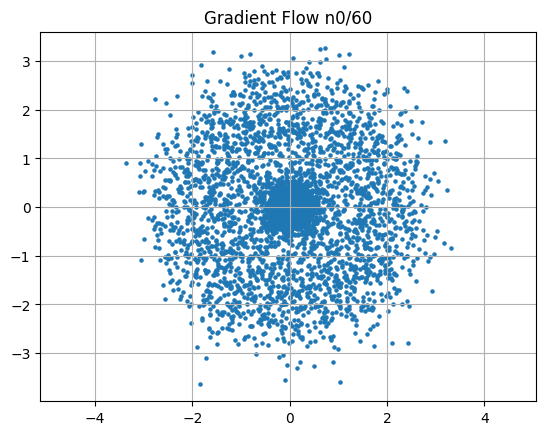

tensor([[-0.0281, -0.0333],
        [-1.1236, -0.3252],
        [ 0.2216, -0.3642],
        ...,
        [-0.2710, -0.2295],
        [-0.4990, -0.2168],
        [-0.2304,  0.4109]], device='cuda:0', grad_fn=<SubBackward0>)

In [21]:
X_data = data.to(device)
lr = 0.01
N_s = 10
T = 60
t_min = 0.05
t_max = 1.0
N_p = 5000

sampling_phase2d(X_data,lr,N_s,N_p,T,t_min,t_max,phi)

GF iter=0 | mmd=0.39335355162620544


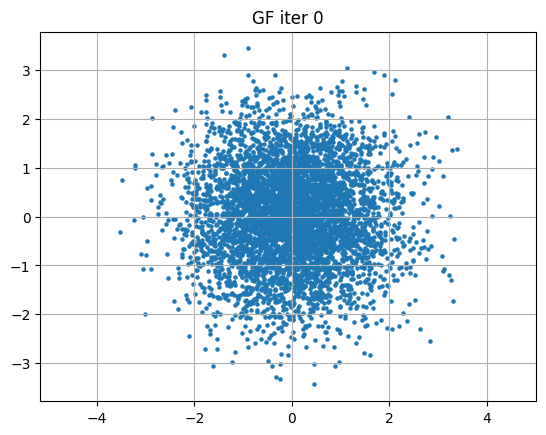

GF iter=1 | mmd=0.39001667499542236
GF iter=2 | mmd=0.38671281933784485
GF iter=3 | mmd=0.38344311714172363
GF iter=4 | mmd=0.3802090585231781
GF iter=5 | mmd=0.37701138854026794
GF iter=6 | mmd=0.37385129928588867
GF iter=7 | mmd=0.3707295060157776
GF iter=8 | mmd=0.3676467537879944
GF iter=9 | mmd=0.3646036982536316
GF iter=10 | mmd=0.36160093545913696
GF iter=11 | mmd=0.3586388826370239
GF iter=12 | mmd=0.3557179868221283
GF iter=13 | mmd=0.3528384864330292
GF iter=14 | mmd=0.3500005304813385
GF iter=15 | mmd=0.34720438718795776
GF iter=16 | mmd=0.34445005655288696
GF iter=17 | mmd=0.3417375385761261
GF iter=18 | mmd=0.3390668034553528
GF iter=19 | mmd=0.33643773198127747
GF iter=20 | mmd=0.3338501453399658
GF iter=21 | mmd=0.3313038945198059
GF iter=22 | mmd=0.32879871129989624
GF iter=23 | mmd=0.3263342082500458
GF iter=24 | mmd=0.3239101767539978
GF iter=25 | mmd=0.3215261995792389
GF iter=26 | mmd=0.3191818594932556
GF iter=27 | mmd=0.3168768286705017
GF iter=28 | mmd=0.31461051

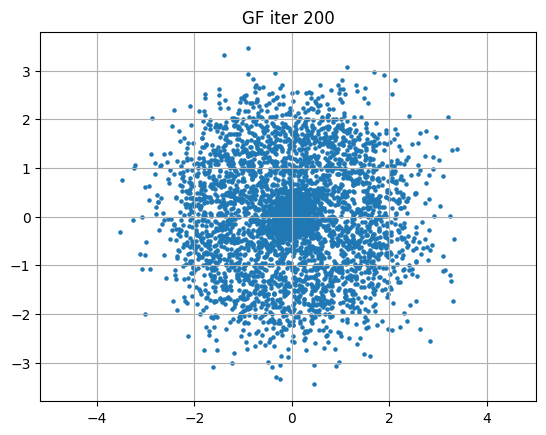

GF iter=201 | mmd=0.1796056628227234
GF iter=202 | mmd=0.17937415838241577
GF iter=203 | mmd=0.1791447401046753
GF iter=204 | mmd=0.17891740798950195
GF iter=205 | mmd=0.17869198322296143
GF iter=206 | mmd=0.1784687042236328
GF iter=207 | mmd=0.178247332572937
GF iter=208 | mmd=0.17802798748016357
GF iter=209 | mmd=0.17781049013137817
GF iter=210 | mmd=0.17759495973587036
GF iter=211 | mmd=0.17738127708435059
GF iter=212 | mmd=0.17716950178146362
GF iter=213 | mmd=0.1769595742225647
GF iter=214 | mmd=0.1767514944076538
GF iter=215 | mmd=0.1765451431274414
GF iter=216 | mmd=0.17634057998657227
GF iter=217 | mmd=0.17613786458969116
GF iter=218 | mmd=0.17593681812286377
GF iter=219 | mmd=0.17573750019073486
GF iter=220 | mmd=0.17553985118865967
GF iter=221 | mmd=0.17534393072128296
GF iter=222 | mmd=0.17514967918395996
GF iter=223 | mmd=0.17495709657669067
GF iter=224 | mmd=0.17476612329483032
GF iter=225 | mmd=0.17457669973373413
GF iter=226 | mmd=0.17438888549804688
GF iter=227 | mmd=0.

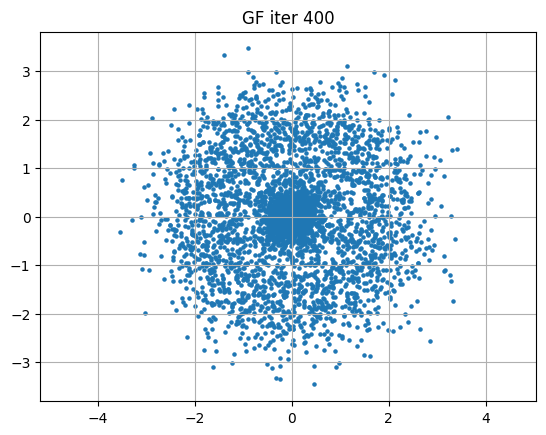

GF iter=401 | mmd=0.15579724311828613
GF iter=402 | mmd=0.15573722124099731
GF iter=403 | mmd=0.15567731857299805
GF iter=404 | mmd=0.15561789274215698
GF iter=405 | mmd=0.15555864572525024
GF iter=406 | mmd=0.15549975633621216
GF iter=407 | mmd=0.15544110536575317
GF iter=408 | mmd=0.15538263320922852
GF iter=409 | mmd=0.15532457828521729
GF iter=410 | mmd=0.15526670217514038
GF iter=411 | mmd=0.15520912408828735
GF iter=412 | mmd=0.1551518440246582
GF iter=413 | mmd=0.15509474277496338
GF iter=414 | mmd=0.1550379991531372
GF iter=415 | mmd=0.15498149394989014
GF iter=416 | mmd=0.1549251675605774
GF iter=417 | mmd=0.1548691987991333
GF iter=418 | mmd=0.15481340885162354
GF iter=419 | mmd=0.15475791692733765
GF iter=420 | mmd=0.15470266342163086
GF iter=421 | mmd=0.15464776754379272
GF iter=422 | mmd=0.15459299087524414
GF iter=423 | mmd=0.15453845262527466
GF iter=424 | mmd=0.15448421239852905
GF iter=425 | mmd=0.15443015098571777
GF iter=426 | mmd=0.15437638759613037
GF iter=427 | mm

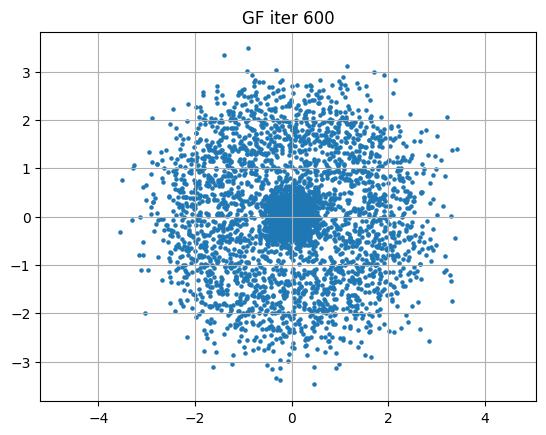

GF iter=601 | mmd=0.14756226539611816
GF iter=602 | mmd=0.14753389358520508
GF iter=603 | mmd=0.147505521774292
GF iter=604 | mmd=0.14747732877731323
GF iter=605 | mmd=0.14744913578033447
GF iter=606 | mmd=0.14742106199264526
GF iter=607 | mmd=0.1473931074142456
GF iter=608 | mmd=0.14736515283584595
GF iter=609 | mmd=0.14733731746673584
GF iter=610 | mmd=0.14730960130691528
GF iter=611 | mmd=0.1472819447517395
GF iter=612 | mmd=0.1472543478012085
GF iter=613 | mmd=0.14722681045532227
GF iter=614 | mmd=0.14719945192337036
GF iter=615 | mmd=0.14717209339141846
GF iter=616 | mmd=0.14714497327804565
GF iter=617 | mmd=0.1471177339553833
GF iter=618 | mmd=0.1470906138420105
GF iter=619 | mmd=0.14706367254257202
GF iter=620 | mmd=0.14703667163848877
GF iter=621 | mmd=0.14700984954833984
GF iter=622 | mmd=0.1469830870628357
GF iter=623 | mmd=0.14695638418197632
GF iter=624 | mmd=0.14692974090576172
GF iter=625 | mmd=0.14690333604812622
GF iter=626 | mmd=0.14687681198120117
GF iter=627 | mmd=0.

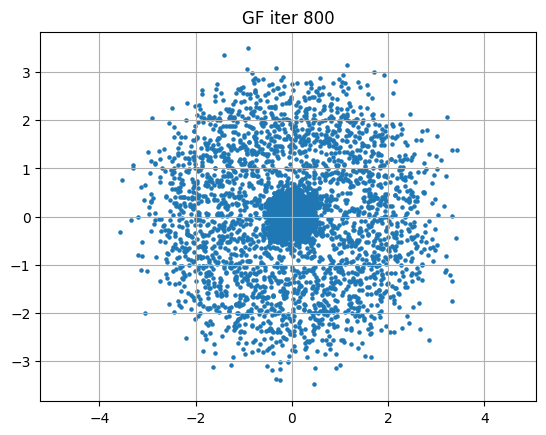

GF iter=801 | mmd=0.14320111274719238
GF iter=802 | mmd=0.14318448305130005
GF iter=803 | mmd=0.1431679129600525
GF iter=804 | mmd=0.14315134286880493
GF iter=805 | mmd=0.14313483238220215
GF iter=806 | mmd=0.14311832189559937
GF iter=807 | mmd=0.1431019902229309
GF iter=808 | mmd=0.14308559894561768
GF iter=809 | mmd=0.14306920766830444
GF iter=810 | mmd=0.143052875995636
GF iter=811 | mmd=0.1430366039276123
GF iter=812 | mmd=0.1430203914642334
GF iter=813 | mmd=0.1430041790008545
GF iter=814 | mmd=0.14298802614212036
GF iter=815 | mmd=0.142971932888031
GF iter=816 | mmd=0.14295578002929688
GF iter=817 | mmd=0.14293986558914185
GF iter=818 | mmd=0.1429237723350525
GF iter=819 | mmd=0.14290779829025269
GF iter=820 | mmd=0.14289188385009766
GF iter=821 | mmd=0.14287596940994263
GF iter=822 | mmd=0.14286011457443237
GF iter=823 | mmd=0.1428443193435669
GF iter=824 | mmd=0.1428285837173462
GF iter=825 | mmd=0.1428127884864807
GF iter=826 | mmd=0.14279711246490479
GF iter=827 | mmd=0.14278

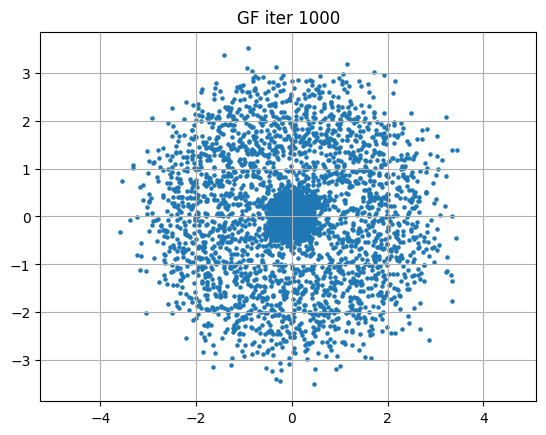

GF iter=1001 | mmd=0.1405341625213623
GF iter=1002 | mmd=0.14052361249923706
GF iter=1003 | mmd=0.14051300287246704
GF iter=1004 | mmd=0.1405024528503418
GF iter=1005 | mmd=0.14049196243286133
GF iter=1006 | mmd=0.14048147201538086
GF iter=1007 | mmd=0.14047110080718994
GF iter=1008 | mmd=0.1404605507850647
GF iter=1009 | mmd=0.140450119972229
GF iter=1010 | mmd=0.14043974876403809
GF iter=1011 | mmd=0.14042937755584717
GF iter=1012 | mmd=0.14041900634765625
GF iter=1013 | mmd=0.14040863513946533
GF iter=1014 | mmd=0.14039838314056396
GF iter=1015 | mmd=0.14038795232772827
GF iter=1016 | mmd=0.14037775993347168
GF iter=1017 | mmd=0.14036744832992554
GF iter=1018 | mmd=0.14035731554031372
GF iter=1019 | mmd=0.14034700393676758
GF iter=1020 | mmd=0.14033687114715576
GF iter=1021 | mmd=0.14032667875289917
GF iter=1022 | mmd=0.14031654596328735
GF iter=1023 | mmd=0.14030641317367554
GF iter=1024 | mmd=0.14029628038406372
GF iter=1025 | mmd=0.14028620719909668
GF iter=1026 | mmd=0.140276134

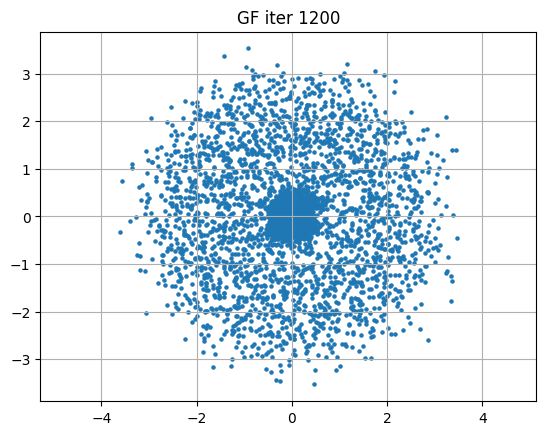

GF iter=1201 | mmd=0.13880014419555664
GF iter=1202 | mmd=0.13879311084747314
GF iter=1203 | mmd=0.13878607749938965
GF iter=1204 | mmd=0.13877910375595093
GF iter=1205 | mmd=0.1387721300125122
GF iter=1206 | mmd=0.1387651562690735
GF iter=1207 | mmd=0.13875824213027954
GF iter=1208 | mmd=0.13875126838684082
GF iter=1209 | mmd=0.13874441385269165
GF iter=1210 | mmd=0.1387374997138977
GF iter=1211 | mmd=0.13873058557510376
GF iter=1212 | mmd=0.1387237310409546
GF iter=1213 | mmd=0.13871675729751587
GF iter=1214 | mmd=0.1387099027633667
GF iter=1215 | mmd=0.13870304822921753
GF iter=1216 | mmd=0.1386963129043579
GF iter=1217 | mmd=0.13868945837020874
GF iter=1218 | mmd=0.13868266344070435
GF iter=1219 | mmd=0.13867580890655518
GF iter=1220 | mmd=0.13866913318634033
GF iter=1221 | mmd=0.1386623978614807
GF iter=1222 | mmd=0.13865560293197632
GF iter=1223 | mmd=0.1386488676071167
GF iter=1224 | mmd=0.13864213228225708
GF iter=1225 | mmd=0.13863545656204224
GF iter=1226 | mmd=0.138628840446

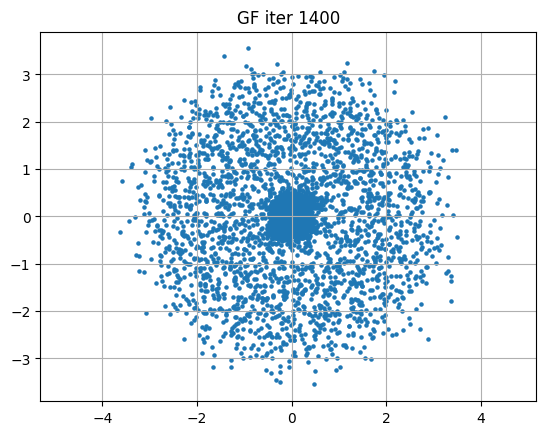

GF iter=1401 | mmd=0.13763833045959473
GF iter=1402 | mmd=0.1376335620880127
GF iter=1403 | mmd=0.13762885332107544
GF iter=1404 | mmd=0.13762414455413818
GF iter=1405 | mmd=0.13761937618255615
GF iter=1406 | mmd=0.1376146674156189
GF iter=1407 | mmd=0.13760995864868164
GF iter=1408 | mmd=0.13760524988174438
GF iter=1409 | mmd=0.13760054111480713
GF iter=1410 | mmd=0.13759589195251465
GF iter=1411 | mmd=0.13759124279022217
GF iter=1412 | mmd=0.1375865936279297
GF iter=1413 | mmd=0.1375819444656372
GF iter=1414 | mmd=0.13757729530334473
GF iter=1415 | mmd=0.13757264614105225
GF iter=1416 | mmd=0.13756805658340454
GF iter=1417 | mmd=0.1375635266304016
GF iter=1418 | mmd=0.13755881786346436
GF iter=1419 | mmd=0.13755428791046143
GF iter=1420 | mmd=0.13754963874816895
GF iter=1421 | mmd=0.13754510879516602
GF iter=1422 | mmd=0.13754045963287354
GF iter=1423 | mmd=0.13753598928451538
GF iter=1424 | mmd=0.13753139972686768
GF iter=1425 | mmd=0.13752681016921997
GF iter=1426 | mmd=0.137522339

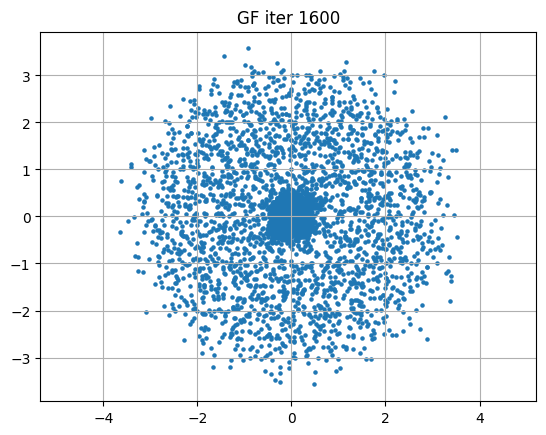

GF iter=1601 | mmd=0.1368497610092163
GF iter=1602 | mmd=0.1368466019630432
GF iter=1603 | mmd=0.13684332370758057
GF iter=1604 | mmd=0.1368401050567627
GF iter=1605 | mmd=0.1368369460105896
GF iter=1606 | mmd=0.13683372735977173
GF iter=1607 | mmd=0.13683050870895386
GF iter=1608 | mmd=0.13682734966278076
GF iter=1609 | mmd=0.13682407140731812
GF iter=1610 | mmd=0.1368209719657898
GF iter=1611 | mmd=0.13681775331497192
GF iter=1612 | mmd=0.13681459426879883
GF iter=1613 | mmd=0.13681143522262573
GF iter=1614 | mmd=0.1368083357810974
GF iter=1615 | mmd=0.13680517673492432
GF iter=1616 | mmd=0.13680195808410645
GF iter=1617 | mmd=0.1367989182472229
GF iter=1618 | mmd=0.1367957592010498
GF iter=1619 | mmd=0.1367926001548767
GF iter=1620 | mmd=0.1367895007133484
GF iter=1621 | mmd=0.1367863416671753
GF iter=1622 | mmd=0.13678330183029175
GF iter=1623 | mmd=0.13678020238876343
GF iter=1624 | mmd=0.1367771029472351
GF iter=1625 | mmd=0.1367740035057068
GF iter=1626 | mmd=0.13677096366882324

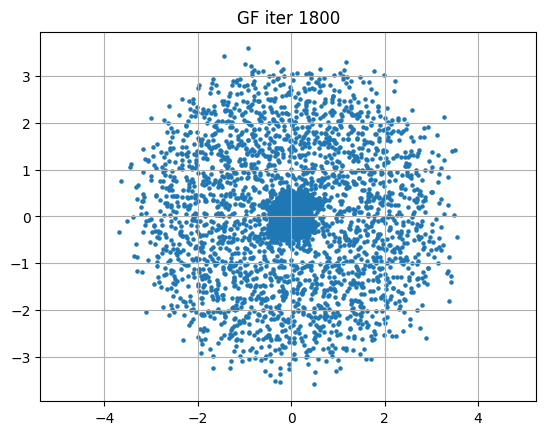

GF iter=1801 | mmd=0.13631457090377808
GF iter=1802 | mmd=0.1363123655319214
GF iter=1803 | mmd=0.13631021976470947
GF iter=1804 | mmd=0.13630813360214233
GF iter=1805 | mmd=0.13630592823028564
GF iter=1806 | mmd=0.13630372285842896
GF iter=1807 | mmd=0.13630163669586182
GF iter=1808 | mmd=0.13629943132400513
GF iter=1809 | mmd=0.136297345161438
GF iter=1810 | mmd=0.13629519939422607
GF iter=1811 | mmd=0.13629299402236938
GF iter=1812 | mmd=0.1362907886505127
GF iter=1813 | mmd=0.13628876209259033
GF iter=1814 | mmd=0.13628655672073364
GF iter=1815 | mmd=0.1362844705581665
GF iter=1816 | mmd=0.1362823247909546
GF iter=1817 | mmd=0.13628029823303223
GF iter=1818 | mmd=0.13627809286117554
GF iter=1819 | mmd=0.13627606630325317
GF iter=1820 | mmd=0.13627386093139648
GF iter=1821 | mmd=0.13627183437347412
GF iter=1822 | mmd=0.1362696886062622
GF iter=1823 | mmd=0.13626760244369507
GF iter=1824 | mmd=0.13626551628112793
GF iter=1825 | mmd=0.13626337051391602
GF iter=1826 | mmd=0.13626140356

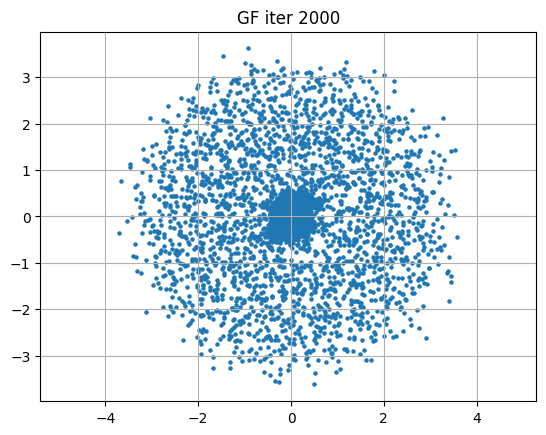

GF iter=2001 | mmd=0.1359560489654541
GF iter=2002 | mmd=0.13595467805862427
GF iter=2003 | mmd=0.13595324754714966
GF iter=2004 | mmd=0.13595175743103027
GF iter=2005 | mmd=0.1359502673149109
GF iter=2006 | mmd=0.13594889640808105
GF iter=2007 | mmd=0.13594752550125122
GF iter=2008 | mmd=0.13594603538513184
GF iter=2009 | mmd=0.13594460487365723
GF iter=2010 | mmd=0.1359432339668274
GF iter=2011 | mmd=0.13594180345535278
GF iter=2012 | mmd=0.13594037294387817
GF iter=2013 | mmd=0.13593894243240356
GF iter=2014 | mmd=0.13593757152557373
GF iter=2015 | mmd=0.13593614101409912
GF iter=2016 | mmd=0.1359347701072693
GF iter=2017 | mmd=0.13593339920043945
GF iter=2018 | mmd=0.13593196868896484
GF iter=2019 | mmd=0.135930597782135
GF iter=2020 | mmd=0.13592922687530518
GF iter=2021 | mmd=0.13592779636383057
GF iter=2022 | mmd=0.1359264850616455
GF iter=2023 | mmd=0.13592499494552612
GF iter=2024 | mmd=0.13592368364334106
GF iter=2025 | mmd=0.13592231273651123
GF iter=2026 | mmd=0.13592094182

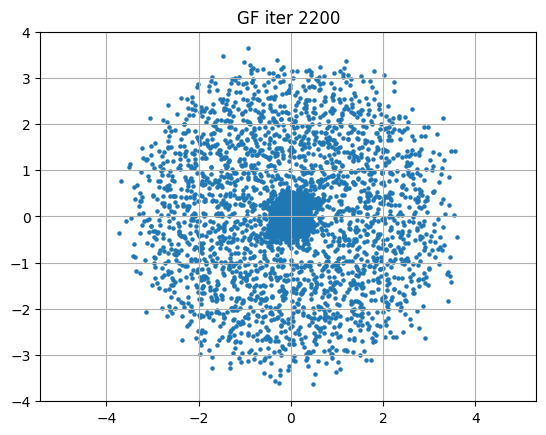

GF iter=2201 | mmd=0.13572311401367188
GF iter=2202 | mmd=0.13572227954864502
GF iter=2203 | mmd=0.13572126626968384
GF iter=2204 | mmd=0.13572043180465698
GF iter=2205 | mmd=0.13571947813034058
GF iter=2206 | mmd=0.13571864366531372
GF iter=2207 | mmd=0.13571768999099731
GF iter=2208 | mmd=0.13571679592132568
GF iter=2209 | mmd=0.13571584224700928
GF iter=2210 | mmd=0.13571494817733765
GF iter=2211 | mmd=0.1357141137123108
GF iter=2212 | mmd=0.13571316003799438
GF iter=2213 | mmd=0.13571232557296753
GF iter=2214 | mmd=0.13571149110794067
GF iter=2215 | mmd=0.13571053743362427
GF iter=2216 | mmd=0.13570964336395264
GF iter=2217 | mmd=0.13570880889892578
GF iter=2218 | mmd=0.13570785522460938
GF iter=2219 | mmd=0.13570702075958252
GF iter=2220 | mmd=0.1357061266899109
GF iter=2221 | mmd=0.13570529222488403
GF iter=2222 | mmd=0.1357043981552124
GF iter=2223 | mmd=0.13570356369018555
GF iter=2224 | mmd=0.1357027292251587
GF iter=2225 | mmd=0.13570183515548706
GF iter=2226 | mmd=0.13570094

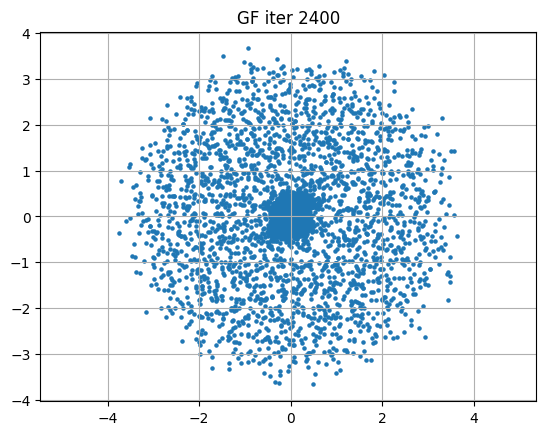

GF iter=2401 | mmd=0.1355806589126587
GF iter=2402 | mmd=0.1355801224708557
GF iter=2403 | mmd=0.1355796456336975
GF iter=2404 | mmd=0.1355791687965393
GF iter=2405 | mmd=0.13557857275009155
GF iter=2406 | mmd=0.13557809591293335
GF iter=2407 | mmd=0.1355774998664856
GF iter=2408 | mmd=0.1355770230293274
GF iter=2409 | mmd=0.13557648658752441
GF iter=2410 | mmd=0.13557595014572144
GF iter=2411 | mmd=0.13557547330856323
GF iter=2412 | mmd=0.13557487726211548
GF iter=2413 | mmd=0.13557446002960205
GF iter=2414 | mmd=0.13557392358779907
GF iter=2415 | mmd=0.13557344675064087
GF iter=2416 | mmd=0.1355729103088379
GF iter=2417 | mmd=0.1355724334716797
GF iter=2418 | mmd=0.1355718970298767
GF iter=2419 | mmd=0.1355714201927185
GF iter=2420 | mmd=0.13557082414627075
GF iter=2421 | mmd=0.1355704665184021
GF iter=2422 | mmd=0.13556987047195435
GF iter=2423 | mmd=0.13556939363479614
GF iter=2424 | mmd=0.13556897640228271
GF iter=2425 | mmd=0.13556838035583496
GF iter=2426 | mmd=0.135567963123321

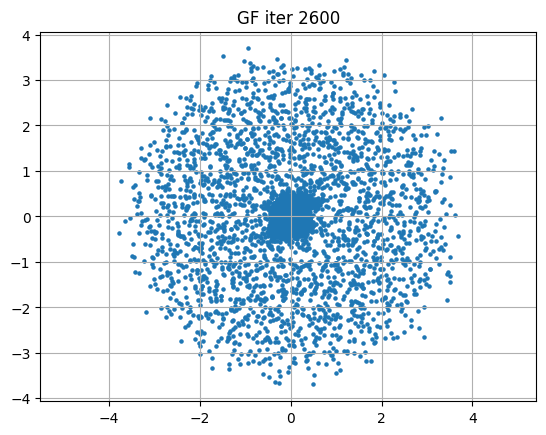

GF iter=2601 | mmd=0.13550406694412231
GF iter=2602 | mmd=0.1355038285255432
GF iter=2603 | mmd=0.1355035901069641
GF iter=2604 | mmd=0.135503351688385
GF iter=2605 | mmd=0.13550305366516113
GF iter=2606 | mmd=0.1355028748512268
GF iter=2607 | mmd=0.13550269603729248
GF iter=2608 | mmd=0.13550233840942383
GF iter=2609 | mmd=0.13550209999084473
GF iter=2610 | mmd=0.1355019211769104
GF iter=2611 | mmd=0.1355016827583313
GF iter=2612 | mmd=0.1355014443397522
GF iter=2613 | mmd=0.13550114631652832
GF iter=2614 | mmd=0.135500967502594
GF iter=2615 | mmd=0.1355007290840149
GF iter=2616 | mmd=0.13550043106079102
GF iter=2617 | mmd=0.1355002522468567
GF iter=2618 | mmd=0.1355000138282776
GF iter=2619 | mmd=0.1354997158050537
GF iter=2620 | mmd=0.13549953699111938
GF iter=2621 | mmd=0.13549935817718506
GF iter=2622 | mmd=0.13549911975860596
GF iter=2623 | mmd=0.13549894094467163
GF iter=2624 | mmd=0.13549870252609253
GF iter=2625 | mmd=0.13549840450286865
GF iter=2626 | mmd=0.13549816608428955


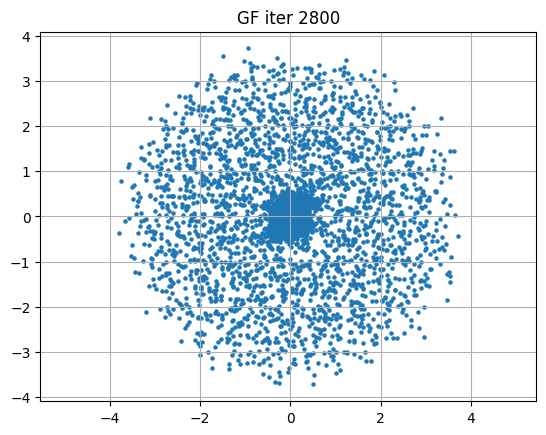

GF iter=2801 | mmd=0.13547581434249878
GF iter=2802 | mmd=0.135475754737854
GF iter=2803 | mmd=0.13547569513320923
GF iter=2804 | mmd=0.13547569513320923
GF iter=2805 | mmd=0.13547557592391968
GF iter=2806 | mmd=0.13547557592391968
GF iter=2807 | mmd=0.1354755163192749
GF iter=2808 | mmd=0.13547545671463013
GF iter=2809 | mmd=0.1354755163192749
GF iter=2810 | mmd=0.13547545671463013
GF iter=2811 | mmd=0.13547539710998535
GF iter=2812 | mmd=0.13547533750534058
GF iter=2813 | mmd=0.13547533750534058
GF iter=2814 | mmd=0.1354752779006958
GF iter=2815 | mmd=0.13547521829605103
GF iter=2816 | mmd=0.13547521829605103
GF iter=2817 | mmd=0.13547521829605103
GF iter=2818 | mmd=0.13547509908676147
GF iter=2819 | mmd=0.13547515869140625
GF iter=2820 | mmd=0.1354750394821167
GF iter=2821 | mmd=0.1354750394821167
GF iter=2822 | mmd=0.1354750394821167
GF iter=2823 | mmd=0.1354750394821167
GF iter=2824 | mmd=0.13547497987747192
GF iter=2825 | mmd=0.13547492027282715
GF iter=2826 | mmd=0.1354749798774

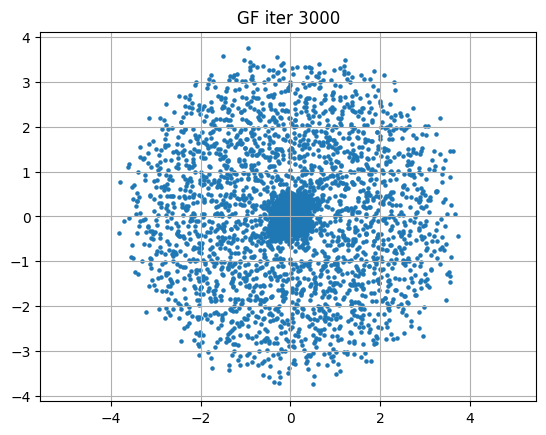

GF iter=3001 | mmd=0.13548296689987183
GF iter=3002 | mmd=0.13548314571380615
GF iter=3003 | mmd=0.13548320531845093
GF iter=3004 | mmd=0.13548338413238525
GF iter=3005 | mmd=0.13548338413238525
GF iter=3006 | mmd=0.13548356294631958
GF iter=3007 | mmd=0.13548362255096436
GF iter=3008 | mmd=0.1354837417602539
GF iter=3009 | mmd=0.13548386096954346
GF iter=3010 | mmd=0.135483980178833
GF iter=3011 | mmd=0.13548409938812256
GF iter=3012 | mmd=0.1354842185974121
GF iter=3013 | mmd=0.13548433780670166
GF iter=3014 | mmd=0.13548439741134644
GF iter=3015 | mmd=0.13548457622528076
GF iter=3016 | mmd=0.1354846954345703
GF iter=3017 | mmd=0.13548487424850464
GF iter=3018 | mmd=0.13548493385314941
GF iter=3019 | mmd=0.13548505306243896
GF iter=3020 | mmd=0.13548511266708374
GF iter=3021 | mmd=0.1354852318763733
GF iter=3022 | mmd=0.13548541069030762
GF iter=3023 | mmd=0.13548552989959717
GF iter=3024 | mmd=0.13548564910888672
GF iter=3025 | mmd=0.1354857087135315
GF iter=3026 | mmd=0.13548588752

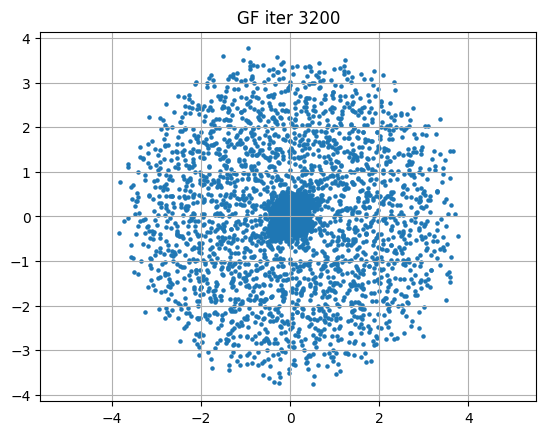

GF iter=3201 | mmd=0.13551628589630127
GF iter=3202 | mmd=0.13551658391952515
GF iter=3203 | mmd=0.13551688194274902
GF iter=3204 | mmd=0.13551706075668335
GF iter=3205 | mmd=0.13551723957061768
GF iter=3206 | mmd=0.13551747798919678
GF iter=3207 | mmd=0.13551771640777588
GF iter=3208 | mmd=0.1355178952217102
GF iter=3209 | mmd=0.1355181336402893
GF iter=3210 | mmd=0.13551843166351318
GF iter=3211 | mmd=0.13551855087280273
GF iter=3212 | mmd=0.1355188488960266
GF iter=3213 | mmd=0.1355191469192505
GF iter=3214 | mmd=0.13551926612854004
GF iter=3215 | mmd=0.13551956415176392
GF iter=3216 | mmd=0.13551974296569824
GF iter=3217 | mmd=0.13551998138427734
GF iter=3218 | mmd=0.13552021980285645
GF iter=3219 | mmd=0.13552045822143555
GF iter=3220 | mmd=0.13552069664001465
GF iter=3221 | mmd=0.13552093505859375
GF iter=3222 | mmd=0.13552111387252808
GF iter=3223 | mmd=0.13552135229110718
GF iter=3224 | mmd=0.13552159070968628
GF iter=3225 | mmd=0.1355217695236206
GF iter=3226 | mmd=0.135522007

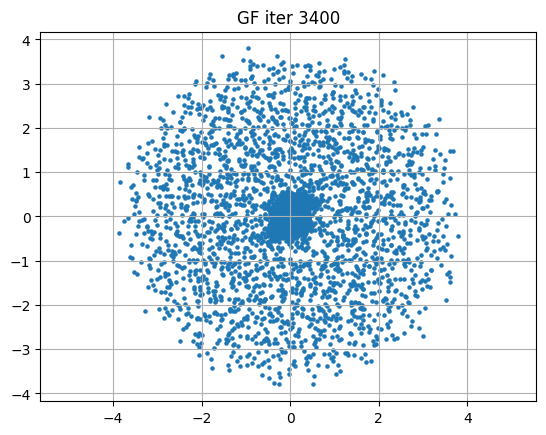

GF iter=3401 | mmd=0.13556909561157227
GF iter=3402 | mmd=0.13556939363479614
GF iter=3403 | mmd=0.13556963205337524
GF iter=3404 | mmd=0.13557004928588867
GF iter=3405 | mmd=0.13557028770446777
GF iter=3406 | mmd=0.13557058572769165
GF iter=3407 | mmd=0.1355709433555603
GF iter=3408 | mmd=0.13557112216949463
GF iter=3409 | mmd=0.13557153940200806
GF iter=3410 | mmd=0.13557183742523193
GF iter=3411 | mmd=0.13557207584381104
GF iter=3412 | mmd=0.13557249307632446
GF iter=3413 | mmd=0.13557273149490356
GF iter=3414 | mmd=0.13557302951812744
GF iter=3415 | mmd=0.1355733871459961
GF iter=3416 | mmd=0.1355736255645752
GF iter=3417 | mmd=0.13557398319244385
GF iter=3418 | mmd=0.13557428121566772
GF iter=3419 | mmd=0.13557463884353638
GF iter=3420 | mmd=0.13557487726211548
GF iter=3421 | mmd=0.13557517528533936
GF iter=3422 | mmd=0.13557547330856323
GF iter=3423 | mmd=0.13557583093643188
GF iter=3424 | mmd=0.13557612895965576
GF iter=3425 | mmd=0.13557642698287964
GF iter=3426 | mmd=0.1355767

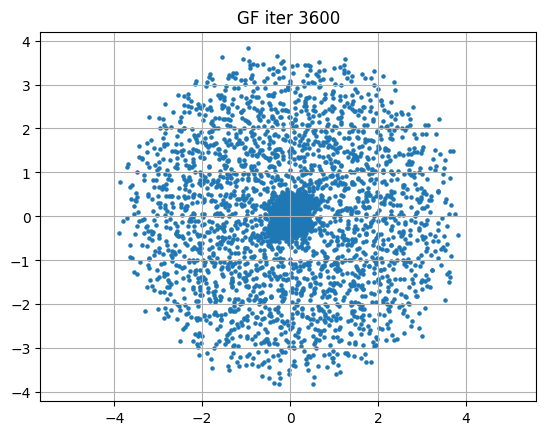

GF iter=3601 | mmd=0.13563597202301025
GF iter=3602 | mmd=0.13563627004623413
GF iter=3603 | mmd=0.13563662767410278
GF iter=3604 | mmd=0.13563698530197144
GF iter=3605 | mmd=0.13563740253448486
GF iter=3606 | mmd=0.13563776016235352
GF iter=3607 | mmd=0.13563811779022217
GF iter=3608 | mmd=0.1356385350227356
GF iter=3609 | mmd=0.13563883304595947
GF iter=3610 | mmd=0.13563919067382812
GF iter=3611 | mmd=0.13563954830169678
GF iter=3612 | mmd=0.13563990592956543
GF iter=3613 | mmd=0.13564032316207886
GF iter=3614 | mmd=0.1356406807899475
GF iter=3615 | mmd=0.13564109802246094
GF iter=3616 | mmd=0.13564139604568481
GF iter=3617 | mmd=0.13564175367355347
GF iter=3618 | mmd=0.13564211130142212
GF iter=3619 | mmd=0.13564252853393555
GF iter=3620 | mmd=0.13564282655715942
GF iter=3621 | mmd=0.13564324378967285
GF iter=3622 | mmd=0.13564354181289673
GF iter=3623 | mmd=0.13564395904541016
GF iter=3624 | mmd=0.13564425706863403
GF iter=3625 | mmd=0.13564473390579224
GF iter=3626 | mmd=0.135645

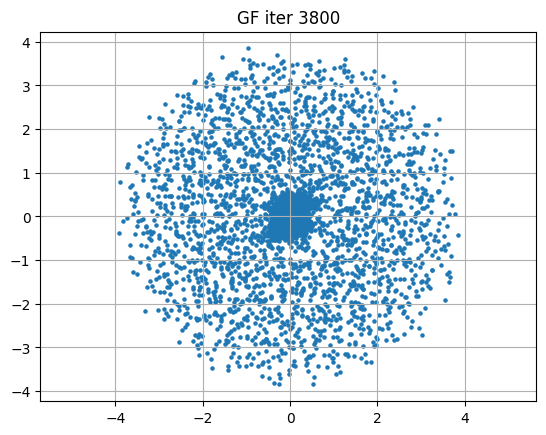

GF iter=3801 | mmd=0.13571304082870483
GF iter=3802 | mmd=0.13571345806121826
GF iter=3803 | mmd=0.13571375608444214
GF iter=3804 | mmd=0.13571417331695557
GF iter=3805 | mmd=0.13571465015411377
GF iter=3806 | mmd=0.13571500778198242
GF iter=3807 | mmd=0.13571548461914062
GF iter=3808 | mmd=0.1357157826423645
GF iter=3809 | mmd=0.1357162594795227
GF iter=3810 | mmd=0.13571661710739136
GF iter=3811 | mmd=0.13571709394454956
GF iter=3812 | mmd=0.135717511177063
GF iter=3813 | mmd=0.13571792840957642
GF iter=3814 | mmd=0.13571834564208984
GF iter=3815 | mmd=0.1357187032699585
GF iter=3816 | mmd=0.13571906089782715
GF iter=3817 | mmd=0.13571953773498535
GF iter=3818 | mmd=0.13571995496749878
GF iter=3819 | mmd=0.13572031259536743
GF iter=3820 | mmd=0.13572078943252563
GF iter=3821 | mmd=0.13572120666503906
GF iter=3822 | mmd=0.1357216238975525
GF iter=3823 | mmd=0.13572198152542114
GF iter=3824 | mmd=0.13572239875793457
GF iter=3825 | mmd=0.135722815990448
GF iter=3826 | mmd=0.135723173618

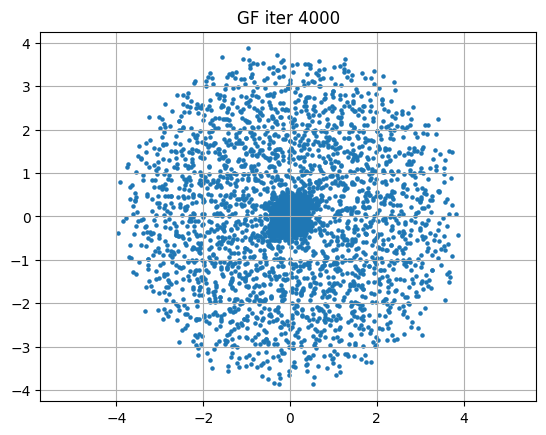

GF iter=4001 | mmd=0.135797381401062
GF iter=4002 | mmd=0.13579785823822021
GF iter=4003 | mmd=0.13579833507537842
GF iter=4004 | mmd=0.13579875230789185
GF iter=4005 | mmd=0.13579916954040527
GF iter=4006 | mmd=0.1357995867729187
GF iter=4007 | mmd=0.1358000636100769
GF iter=4008 | mmd=0.13580048084259033
GF iter=4009 | mmd=0.13580095767974854
GF iter=4010 | mmd=0.1358013153076172
GF iter=4011 | mmd=0.1358017921447754
GF iter=4012 | mmd=0.13580220937728882
GF iter=4013 | mmd=0.13580262660980225
GF iter=4014 | mmd=0.13580310344696045
GF iter=4015 | mmd=0.13580358028411865
GF iter=4016 | mmd=0.13580399751663208
GF iter=4017 | mmd=0.1358044147491455
GF iter=4018 | mmd=0.1358048915863037
GF iter=4019 | mmd=0.13580530881881714
GF iter=4020 | mmd=0.13580572605133057
GF iter=4021 | mmd=0.135806143283844
GF iter=4022 | mmd=0.1358066201210022
GF iter=4023 | mmd=0.13580703735351562
GF iter=4024 | mmd=0.13580745458602905
GF iter=4025 | mmd=0.13580793142318726
GF iter=4026 | mmd=0.135808408260345

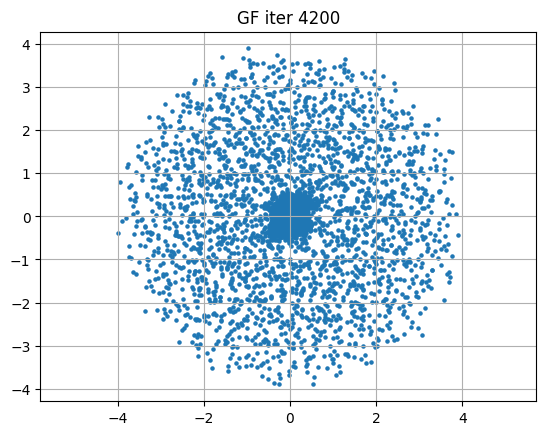

GF iter=4201 | mmd=0.13588696718215942
GF iter=4202 | mmd=0.13588744401931763
GF iter=4203 | mmd=0.13588792085647583
GF iter=4204 | mmd=0.13588839769363403
GF iter=4205 | mmd=0.13588887453079224
GF iter=4206 | mmd=0.13588929176330566
GF iter=4207 | mmd=0.1358897089958191
GF iter=4208 | mmd=0.1358901858329773
GF iter=4209 | mmd=0.1358906626701355
GF iter=4210 | mmd=0.13589107990264893
GF iter=4211 | mmd=0.13589155673980713
GF iter=4212 | mmd=0.13589203357696533
GF iter=4213 | mmd=0.13589251041412354
GF iter=4214 | mmd=0.13589292764663696
GF iter=4215 | mmd=0.1358933448791504
GF iter=4216 | mmd=0.1358938217163086
GF iter=4217 | mmd=0.1358942985534668
GF iter=4218 | mmd=0.135894775390625
GF iter=4219 | mmd=0.13589519262313843
GF iter=4220 | mmd=0.13589560985565186
GF iter=4221 | mmd=0.13589614629745483
GF iter=4222 | mmd=0.13589662313461304
GF iter=4223 | mmd=0.13589709997177124
GF iter=4224 | mmd=0.13589757680892944
GF iter=4225 | mmd=0.13589805364608765
GF iter=4226 | mmd=0.135898470878

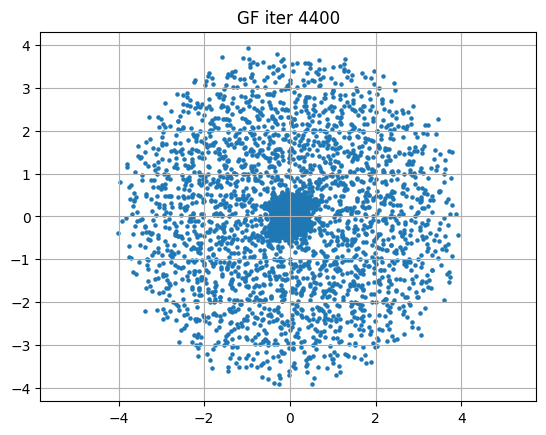

GF iter=4401 | mmd=0.13597995042800903
GF iter=4402 | mmd=0.135980486869812
GF iter=4403 | mmd=0.13598084449768066
GF iter=4404 | mmd=0.13598132133483887
GF iter=4405 | mmd=0.13598185777664185
GF iter=4406 | mmd=0.13598233461380005
GF iter=4407 | mmd=0.1359826922416687
GF iter=4408 | mmd=0.13598328828811646
GF iter=4409 | mmd=0.13598382472991943
GF iter=4410 | mmd=0.13598424196243286
GF iter=4411 | mmd=0.1359846591949463
GF iter=4412 | mmd=0.13598519563674927
GF iter=4413 | mmd=0.13598567247390747
GF iter=4414 | mmd=0.13598603010177612
GF iter=4415 | mmd=0.13598662614822388
GF iter=4416 | mmd=0.1359870433807373
GF iter=4417 | mmd=0.13598746061325073
GF iter=4418 | mmd=0.13598793745040894
GF iter=4419 | mmd=0.1359885334968567
GF iter=4420 | mmd=0.13598889112472534
GF iter=4421 | mmd=0.13598936796188354
GF iter=4422 | mmd=0.13598990440368652
GF iter=4423 | mmd=0.13599026203155518
GF iter=4424 | mmd=0.13599079847335815
GF iter=4425 | mmd=0.13599127531051636
GF iter=4426 | mmd=0.1359917521

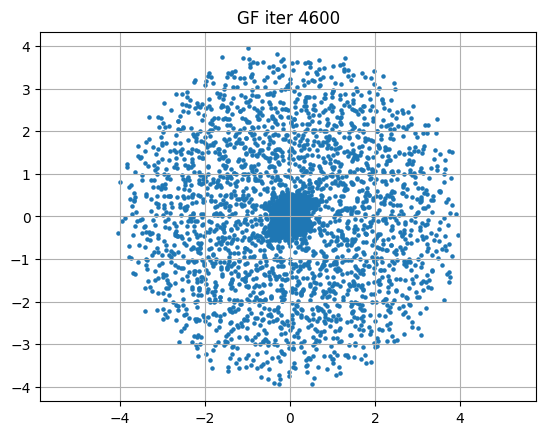

GF iter=4601 | mmd=0.13607513904571533
GF iter=4602 | mmd=0.13607549667358398
GF iter=4603 | mmd=0.13607603311538696
GF iter=4604 | mmd=0.13607650995254517
GF iter=4605 | mmd=0.1360769271850586
GF iter=4606 | mmd=0.13607746362686157
GF iter=4607 | mmd=0.13607794046401978
GF iter=4608 | mmd=0.1360783576965332
GF iter=4609 | mmd=0.13607895374298096
GF iter=4610 | mmd=0.13607943058013916
GF iter=4611 | mmd=0.1360798478126526
GF iter=4612 | mmd=0.1360803246498108
GF iter=4613 | mmd=0.13608086109161377
GF iter=4614 | mmd=0.1360812783241272
GF iter=4615 | mmd=0.13608181476593018
GF iter=4616 | mmd=0.1360822319984436
GF iter=4617 | mmd=0.13608276844024658
GF iter=4618 | mmd=0.13608324527740479
GF iter=4619 | mmd=0.136083722114563
GF iter=4620 | mmd=0.1360841989517212
GF iter=4621 | mmd=0.1360846757888794
GF iter=4622 | mmd=0.13608509302139282
GF iter=4623 | mmd=0.1360856294631958
GF iter=4624 | mmd=0.136086106300354
GF iter=4625 | mmd=0.1360865831375122
GF iter=4626 | mmd=0.13608700037002563


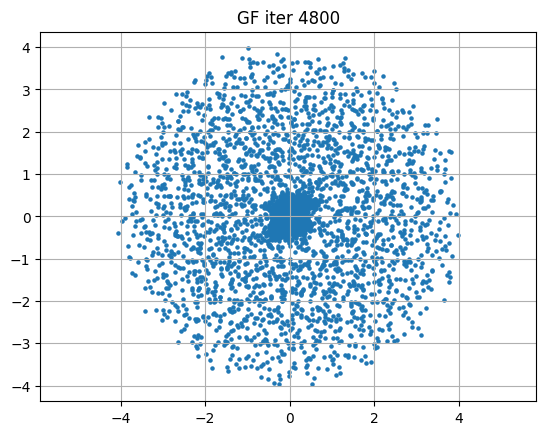

GF iter=4801 | mmd=0.1361714005470276
GF iter=4802 | mmd=0.1361718773841858
GF iter=4803 | mmd=0.13617229461669922
GF iter=4804 | mmd=0.1361728310585022
GF iter=4805 | mmd=0.13617324829101562
GF iter=4806 | mmd=0.1361737847328186
GF iter=4807 | mmd=0.13617420196533203
GF iter=4808 | mmd=0.13617479801177979
GF iter=4809 | mmd=0.1361752152442932
GF iter=4810 | mmd=0.13617569208145142
GF iter=4811 | mmd=0.1361762285232544
GF iter=4812 | mmd=0.13617664575576782
GF iter=4813 | mmd=0.13617712259292603
GF iter=4814 | mmd=0.13617759943008423
GF iter=4815 | mmd=0.13617819547653198
GF iter=4816 | mmd=0.1361786127090454
GF iter=4817 | mmd=0.1361790895462036
GF iter=4818 | mmd=0.13617950677871704
GF iter=4819 | mmd=0.13618004322052002
GF iter=4820 | mmd=0.136180579662323
GF iter=4821 | mmd=0.13618099689483643
GF iter=4822 | mmd=0.13618147373199463
GF iter=4823 | mmd=0.1361820101737976
GF iter=4824 | mmd=0.1361824870109558
GF iter=4825 | mmd=0.136182963848114
GF iter=4826 | mmd=0.13618338108062744


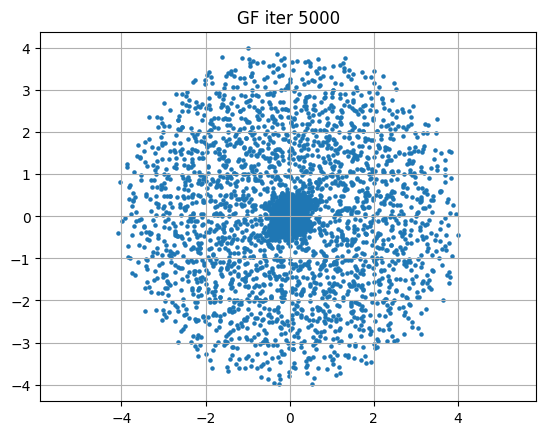

GF iter=5001 | mmd=0.13626807928085327
GF iter=5002 | mmd=0.1362684965133667
GF iter=5003 | mmd=0.1362689733505249
GF iter=5004 | mmd=0.1362694501876831
GF iter=5005 | mmd=0.1362699270248413
GF iter=5006 | mmd=0.1362704038619995
GF iter=5007 | mmd=0.1362709403038025
GF iter=5008 | mmd=0.1362714171409607
GF iter=5009 | mmd=0.1362718939781189
GF iter=5010 | mmd=0.1362723708152771
GF iter=5011 | mmd=0.1362728476524353
GF iter=5012 | mmd=0.1362733244895935
GF iter=5013 | mmd=0.1362738013267517
GF iter=5014 | mmd=0.1362742781639099
GF iter=5015 | mmd=0.13627475500106812
GF iter=5016 | mmd=0.13627523183822632
GF iter=5017 | mmd=0.13627570867538452
GF iter=5018 | mmd=0.1362762451171875
GF iter=5019 | mmd=0.1362767219543457
GF iter=5020 | mmd=0.13627713918685913
GF iter=5021 | mmd=0.1362776756286621
GF iter=5022 | mmd=0.1362782120704651
GF iter=5023 | mmd=0.13627862930297852
GF iter=5024 | mmd=0.13627910614013672
GF iter=5025 | mmd=0.1362796425819397
GF iter=5026 | mmd=0.13628000020980835
GF i

In [ ]:
X_data = data.to(device)
lr = 0.01
N_iter = 10000
N_p = 5000
classical_MMD_GF(X_data,N_p,lr,N_iter,0.4029)

In [14]:
def median_bandwidth(X, Y=None):
    """
    Estimate bandwidth (sigma) for RBF kernel using median trick.
    X: (N, d) torch tensor
    Y: (M, d) or None (defaults to X)
    """
    if Y is None:
        Y = X
    dists = torch.cdist(X, Y, p=2)  # (N, M)
    median = torch.median(dists[dists > 0])  # exclude zeros from diagonal
    return median
median_bandwidth(data)

tensor(0.4029)

In [124]:
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

In [571]:
len(x)

100

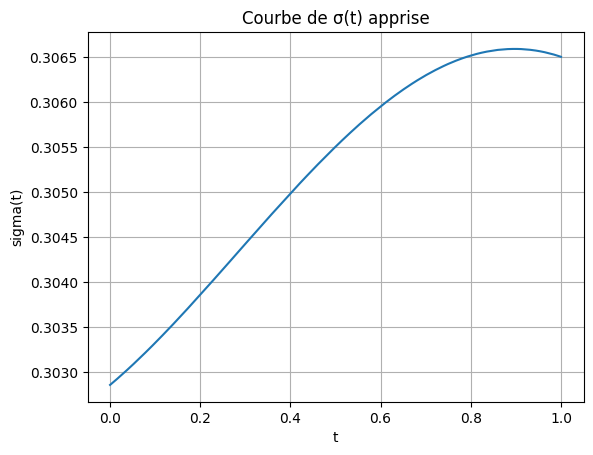

In [129]:
x = np.linspace(0, 1, 500)
y = []

for i in range(len(x)):
    t = torch.tensor([x[i]], device=device).float()  # <- maintenant t a la forme (1,)
    y.append(phi(t).item())

plt.plot(x, y)
plt.xlabel("t")
plt.ylabel("sigma(t)")
plt.title("Courbe de σ(t) apprise")
plt.grid(True)
plt.show()

In [130]:
#phi = Phi().to(device)
for i in [0.01,0.1,0.3,0.5,0.8,0.95]:
  print(phi(torch.tensor([i],device=device)).item())

0.30289778113365173
0.3033228814601898
0.3044241666793823
0.305504709482193
0.3065183758735657
0.3065692186355591


In [320]:
t = torch.tensor([0.5], device=device, requires_grad=False)
phi = Phi().to(device)
sigma_t = phi(t)  # (1, 1)
print("sigma_t:", sigma_t.item())
dummy_loss = (sigma_t - 0.5).pow(2).mean()
dummy_loss.backward()

for name, param in phi.named_parameters():
    print(f"[{name}] grad = {torch.norm(param.grad)}")

sigma_t: 0.17512983083724976
[sigma_mlp.net.0.weight] grad = 0.8179056644439697
[sigma_mlp.net.0.bias] grad = 0.03614666312932968
[sigma_mlp.net.2.weight] grad = 0.2055976539850235
[sigma_mlp.net.2.bias] grad = 0.09614426642656326
[sigma_mlp.net.4.weight] grad = 0.10506633669137955
[sigma_mlp.net.4.bias] grad = 0.2886055111885071
[sigma_mlp.net.6.weight] grad = 0.201498344540596
[sigma_mlp.net.6.bias] grad = 0.6497403383255005


### MNIST

#### Dataset

In [12]:
transform = transforms.Compose([transforms.ToTensor()])
mnist = datasets.MNIST(root="./data", train=True, download=True, transform=transform)
all_imgs = torch.stack([img for img, _ in mnist])

100%|██████████| 9.91M/9.91M [00:00<00:00, 44.1MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 1.18MB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 11.0MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 10.7MB/s]


#### model for phi

In [13]:


class SinusoidalTimeEmbedding(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, t):
        device = t.device
        half_dim = self.dim // 2
        emb = math.log(10000) / (half_dim - 1)
        emb = torch.exp(torch.arange(half_dim, device=device) * -emb)
        emb = t[:, None] * emb[None, :]
        emb = torch.cat([torch.sin(emb), torch.cos(emb)], dim=1)
        return emb  # (B, dim)

class ConvBlock(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.conv = nn.Conv2d(in_ch, out_ch, 3, padding=1)
        self.norm = nn.GroupNorm(8, out_ch)
        self.act = nn.SiLU()

    def forward(self, x):
        return self.act(self.norm(self.conv(x)))

class FeatureHead(nn.Module):
    def __init__(self, in_dim, out_dim=32):
        super().__init__()
        self.layer = nn.Sequential(
            nn.GroupNorm(8, in_dim),
            nn.SiLU(),
            nn.AdaptiveAvgPool2d(1),  # global average pooling (B, C, 1, 1)
            nn.Flatten(),             # (B, C)
            nn.Linear(in_dim, out_dim),
            nn.Dropout(0.2)
        )

    def forward(self, x):
        return self.layer(x)

class DMMDDiscriminatorFeatures(nn.Module):
    def __init__(self, in_ch=1, time_emb_dim=128):
        super().__init__()
        self.time_embedding = SinusoidalTimeEmbedding(time_emb_dim)
        self.time_proj = nn.Sequential(
            nn.Linear(time_emb_dim, 128),
            nn.SiLU()
        )

        # U-Net core
        self.down1 = ConvBlock(in_ch, 64)
        self.down2 = ConvBlock(64, 128)

        self.bottleneck = ConvBlock(128, 128)

        self.up1 = ConvBlock(128, 64)
        self.out_conv = nn.Conv2d(64, 32, 3, padding=1)

        # Feature extraction heads
        self.f1 = FeatureHead(64, 32)  # before downsampling
        self.f2 = FeatureHead(128, 32) # after downsampling
        self.f3 = FeatureHead(128, 32) # before upsampling
        self.f4 = FeatureHead(32, 32)  # final

    def forward(self, x, t):
        B = x.size(0)

        # Embed time and inject it (if needed, e.g., via FiLM or addition – not detailed in paper so we just encode it here)
        time_emb = self.time_proj(self.time_embedding(t))  # (B, 128)

        # U-Net backbone
        h1 = self.down1(x)                # (B, 64, H, W)
        h2 = self.down2(F.avg_pool2d(h1, 2))  # (B, 128, H/2, W/2)
        h3 = self.bottleneck(h2)         # (B, 128, H/2, W/2)
        h4 = self.up1(F.interpolate(h3, scale_factor=2))  # (B, 64, H, W)
        out = self.out_conv(h4)          # (B, 32, H, W)

        # Feature vectors
        f1 = self.f1(h1)  # (B, 32)
        f2 = self.f2(h2)
        f3 = self.f3(h3)
        f4 = self.f4(out)

        feat = torch.cat([f1, f2, f3, f4], dim=1)  # (B, 128)
        return feat  # Final feature vector


#### Train

In [20]:
phi = DMMDDiscriminatorFeatures(in_ch=1).to(device)
X_data = all_imgs.to(device)
lr = 0.00005
lbda_l2 = 0.1
lbda_grad = 1
n_iter = 5000
batch_size = 64
n_noise = 16
T = 1000
kernel = Linear_kernel

forward_phase(X_data,lr,lbda_l2,lbda_grad,n_iter,batch_size,n_noise,T,kernel,phi)

iter=0 | mmd =0.9786006808280945| loss=0.7648851871490479
iter=1 | mmd =1.3033926486968994| loss=0.24337005615234375
iter=2 | mmd =1.342644214630127| loss=0.25855758786201477
iter=3 | mmd =1.9142228364944458| loss=-0.3334333896636963
iter=4 | mmd =2.3372225761413574| loss=-0.6280902028083801
iter=5 | mmd =2.828568696975708| loss=-1.0881626605987549
iter=6 | mmd =3.723700761795044| loss=-1.5556854009628296
iter=7 | mmd =3.2854228019714355| loss=-1.1159981489181519
iter=8 | mmd =4.607195854187012| loss=-1.932772159576416
iter=9 | mmd =5.066987991333008| loss=-2.0179944038391113
iter=10 | mmd =6.734756946563721| loss=-2.5354340076446533
iter=11 | mmd =7.959445953369141| loss=-2.949634552001953
iter=12 | mmd =10.562117576599121| loss=-3.8268120288848877
iter=13 | mmd =13.299646377563477| loss=-4.417236328125
iter=14 | mmd =16.18855857849121| loss=-5.104279041290283
iter=15 | mmd =15.135977745056152| loss=-4.534516334533691
iter=16 | mmd =19.497482299804688| loss=-5.605757236480713
iter=17 

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=0 | mmd=243.6682891845703


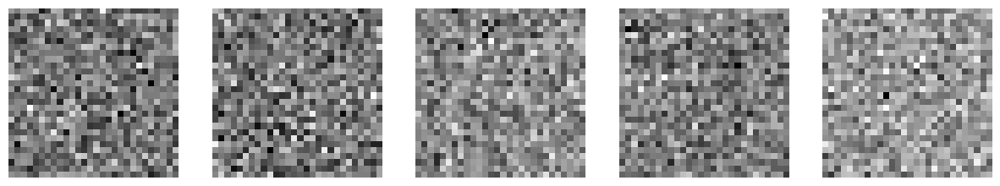

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=1 | mmd=239.14108276367188
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=2 | mmd=234.39340209960938
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=3 | mmd=238.6328887939453
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=4 | mmd=239.30931091308594
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=5 | mmd=238.15960693359375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=6 | mmd=230.37954711914062
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=7 | mmd=237.90086364746094
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=8 | mmd=233.94937133789062
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=9 | mmd=234.97264099121094
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=10 | mmd=233.45864868164062


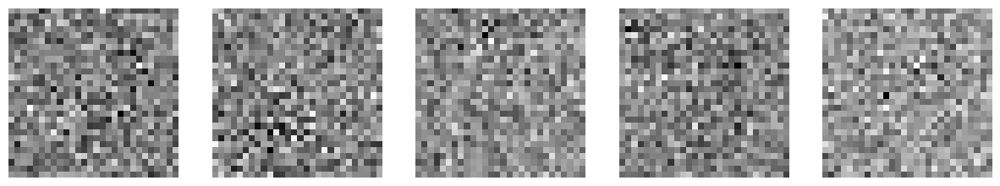

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=11 | mmd=242.7171630859375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=12 | mmd=232.518310546875
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=13 | mmd=239.59222412109375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=14 | mmd=231.43804931640625
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=15 | mmd=231.9154052734375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=16 | mmd=232.74124145507812
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=17 | mmd=231.08624267578125
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=18 | mmd=228.76771545410156
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=19 | mmd=224.2088165283203
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=20 | mmd=233.87594604492188


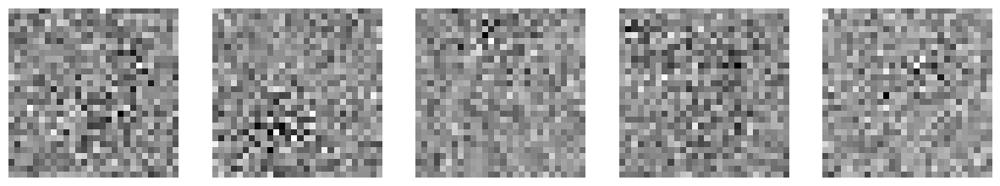

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=21 | mmd=233.12347412109375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=22 | mmd=235.72174072265625
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=23 | mmd=223.7200469970703
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=24 | mmd=222.39837646484375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=25 | mmd=219.2711181640625
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=26 | mmd=217.6654052734375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=27 | mmd=226.00140380859375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=28 | mmd=225.65625
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=29 | mmd=230.37132263183594
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=30 | mmd=220.18362426757812


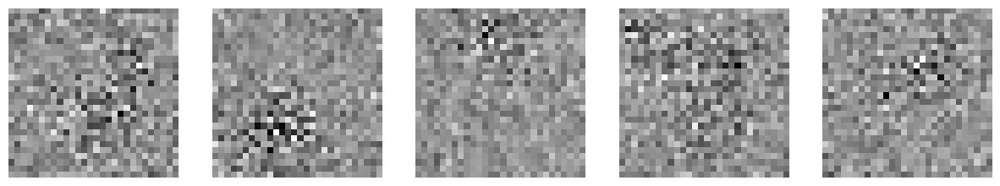

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=31 | mmd=217.52191162109375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=32 | mmd=215.28720092773438
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=33 | mmd=216.7372283935547
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=34 | mmd=207.81289672851562
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=35 | mmd=214.31837463378906
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=36 | mmd=215.15045166015625
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=37 | mmd=205.9757537841797
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=38 | mmd=209.41665649414062
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=39 | mmd=206.6649627685547
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=40 | mmd=208.1548614501953


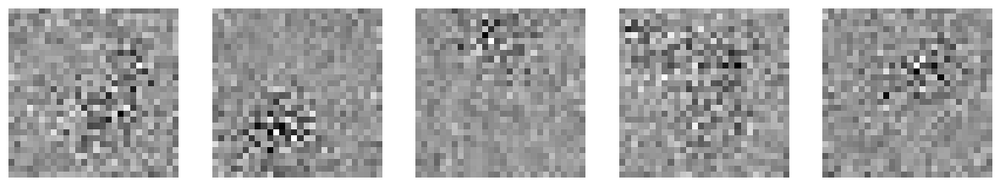

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=41 | mmd=209.70835876464844
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=42 | mmd=210.28762817382812
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=43 | mmd=205.24349975585938
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=44 | mmd=195.52691650390625
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=45 | mmd=208.46295166015625
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=46 | mmd=206.13656616210938
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=47 | mmd=199.87208557128906
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=48 | mmd=203.34671020507812
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=49 | mmd=199.43359375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=50 | mmd=203.79513549804688


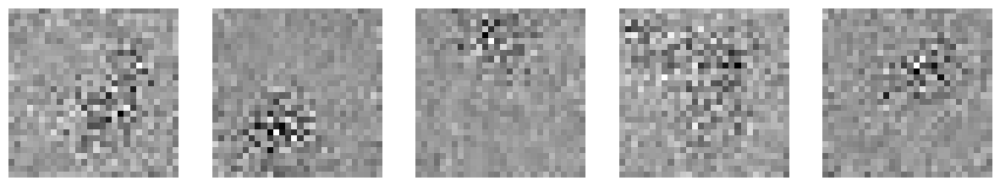

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=51 | mmd=203.1466064453125
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=52 | mmd=191.8093719482422
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=53 | mmd=196.78744506835938
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=54 | mmd=200.8642578125
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=55 | mmd=192.83595275878906
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=56 | mmd=193.37185668945312
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=57 | mmd=187.1081085205078
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=58 | mmd=187.10128784179688
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=59 | mmd=179.58660888671875
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=60 | mmd=179.68020629882812


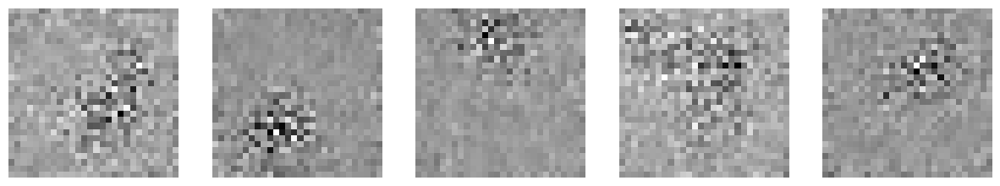

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=61 | mmd=189.11083984375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=62 | mmd=186.12503051757812
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=63 | mmd=184.61416625976562
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=64 | mmd=176.9951629638672
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=65 | mmd=182.0199432373047
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=66 | mmd=182.97317504882812
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=67 | mmd=179.90309143066406
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=68 | mmd=174.34303283691406
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=69 | mmd=179.61007690429688
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=70 | mmd=177.80548095703125


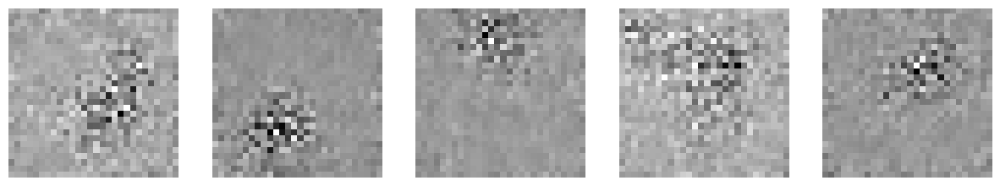

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=71 | mmd=178.05233764648438
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=72 | mmd=175.69671630859375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=73 | mmd=180.028076171875
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=74 | mmd=178.69183349609375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=75 | mmd=175.0028533935547
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=76 | mmd=169.3462677001953
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=77 | mmd=172.27967834472656
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=78 | mmd=170.83958435058594
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=79 | mmd=166.63693237304688
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=80 | mmd=165.91961669921875


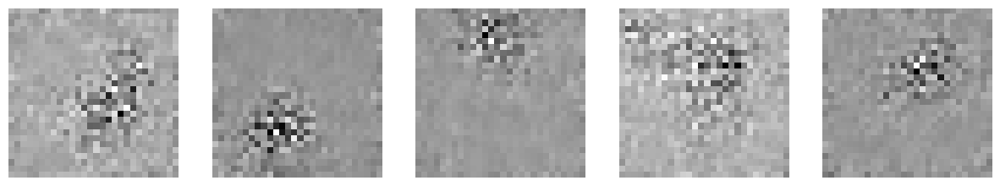

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=81 | mmd=172.494140625
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=82 | mmd=165.69802856445312
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=83 | mmd=171.32614135742188
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=84 | mmd=163.49932861328125
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=85 | mmd=163.71676635742188
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=86 | mmd=163.4373779296875
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=87 | mmd=162.7466278076172
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=88 | mmd=161.72012329101562
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=89 | mmd=166.301025390625
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=90 | mmd=163.40127563476562


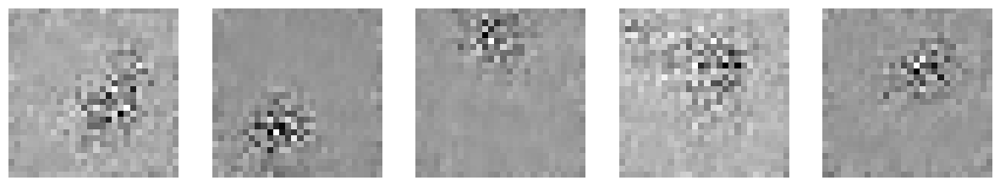

Gradient Flow n0/10 with noise level 0.9990000128746033, iter=91 | mmd=160.88714599609375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=92 | mmd=159.19918823242188
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=93 | mmd=158.92662048339844
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=94 | mmd=160.56661987304688
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=95 | mmd=160.01312255859375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=96 | mmd=157.65692138671875
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=97 | mmd=157.97259521484375
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=98 | mmd=158.05581665039062
Gradient Flow n0/10 with noise level 0.9990000128746033, iter=99 | mmd=156.9128875732422
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=0 | mmd=155.33734130859375


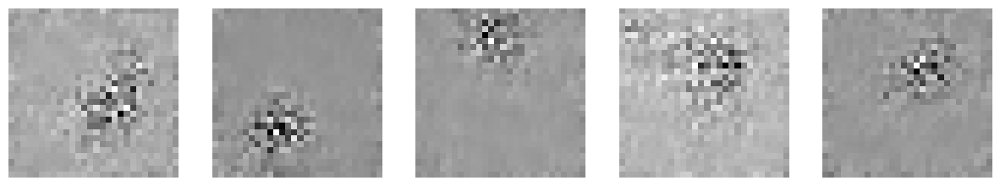

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=1 | mmd=156.97320556640625
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=2 | mmd=154.93788146972656
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=3 | mmd=149.80819702148438
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=4 | mmd=151.05197143554688
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=5 | mmd=153.54470825195312
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=6 | mmd=153.8082733154297
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=7 | mmd=149.82504272460938
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=8 | mmd=147.4212646484375
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=9 | mmd=148.4085235595703
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=10 | mmd=145.19400024414062


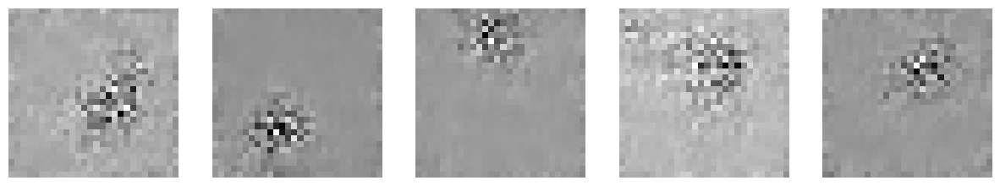

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=11 | mmd=147.05264282226562
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=12 | mmd=145.1927490234375
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=13 | mmd=147.87042236328125
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=14 | mmd=141.1237335205078
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=15 | mmd=141.88558959960938
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=16 | mmd=142.796875
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=17 | mmd=148.4142303466797
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=18 | mmd=149.46884155273438
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=19 | mmd=144.99212646484375
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=20 | mmd=143.81414794921875


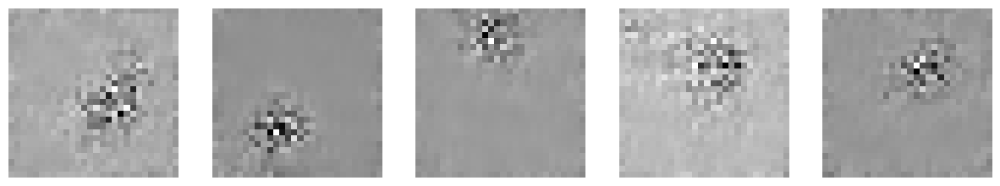

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=21 | mmd=141.35922241210938
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=22 | mmd=143.81063842773438
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=23 | mmd=144.888671875
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=24 | mmd=141.53182983398438
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=25 | mmd=141.8766632080078
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=26 | mmd=137.84767150878906
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=27 | mmd=137.18161010742188
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=28 | mmd=138.56968688964844
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=29 | mmd=137.91107177734375
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=30 | mmd=136.93350219726562


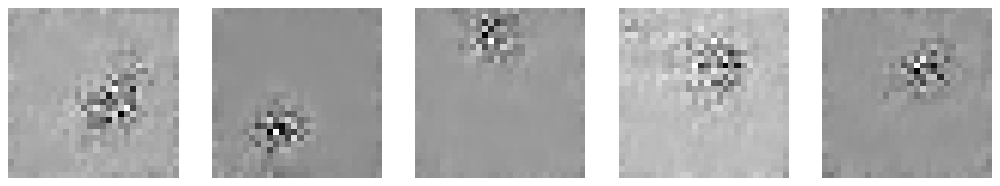

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=31 | mmd=134.981201171875
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=32 | mmd=136.267578125
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=33 | mmd=134.94300842285156
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=34 | mmd=136.4903106689453
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=35 | mmd=135.84133911132812
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=36 | mmd=134.4504852294922
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=37 | mmd=134.49766540527344
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=38 | mmd=134.6055450439453
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=39 | mmd=134.91897583007812
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=40 | mmd=134.95327758789062


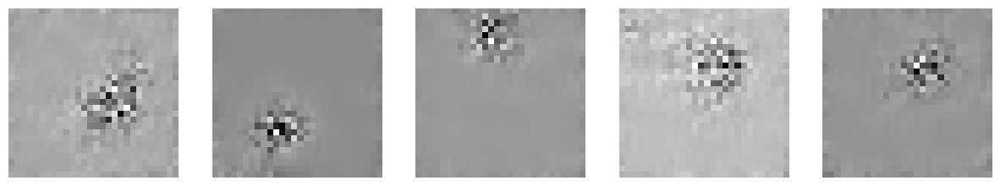

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=41 | mmd=128.33865356445312
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=42 | mmd=129.62091064453125
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=43 | mmd=128.65725708007812
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=44 | mmd=129.88674926757812
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=45 | mmd=127.9135971069336
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=46 | mmd=128.18771362304688
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=47 | mmd=127.26669311523438
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=48 | mmd=126.89027404785156
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=49 | mmd=124.847900390625
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=50 | mmd=123.53030395507812


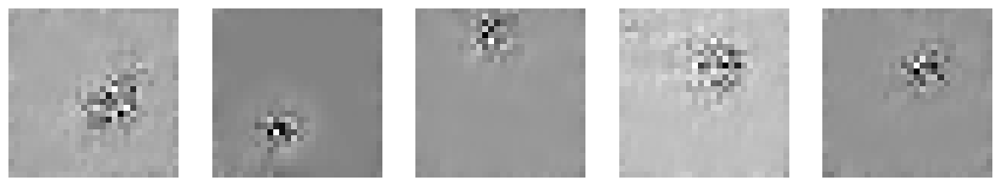

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=51 | mmd=120.49871826171875
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=52 | mmd=122.7613754272461
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=53 | mmd=122.12245178222656
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=54 | mmd=118.72132873535156
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=55 | mmd=116.85191345214844
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=56 | mmd=114.52877807617188
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=57 | mmd=109.69303894042969
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=58 | mmd=109.55349731445312
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=59 | mmd=107.59823608398438
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=60 | mmd=107.65887451171875


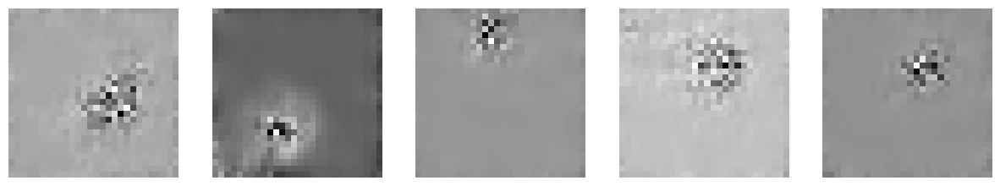

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=61 | mmd=106.62166595458984
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=62 | mmd=105.57298278808594
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=63 | mmd=104.067626953125
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=64 | mmd=105.34619140625
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=65 | mmd=101.06758117675781
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=66 | mmd=96.47633361816406
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=67 | mmd=95.53533172607422
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=68 | mmd=95.53227233886719
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=69 | mmd=94.67190551757812
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=70 | mmd=94.41355895996094


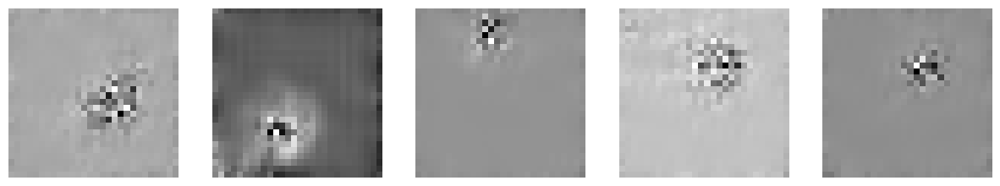

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=71 | mmd=92.85089874267578
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=72 | mmd=90.60585021972656
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=73 | mmd=91.61636352539062
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=74 | mmd=87.88972473144531
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=75 | mmd=87.72228240966797
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=76 | mmd=85.6903076171875
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=77 | mmd=88.42848205566406
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=78 | mmd=85.86771392822266
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=79 | mmd=84.75740051269531
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=80 | mmd=83.27063751220703


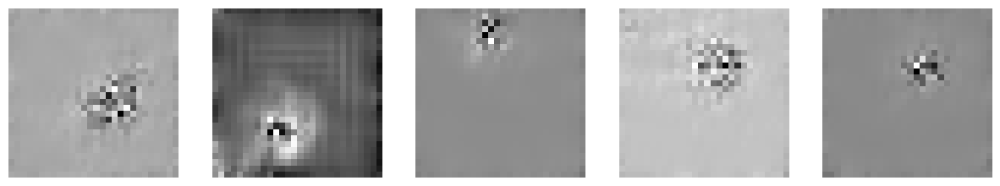

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=81 | mmd=83.37114715576172
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=82 | mmd=80.11007690429688
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=83 | mmd=79.22661590576172
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=84 | mmd=79.068603515625
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=85 | mmd=74.2099609375
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=86 | mmd=71.2184829711914
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=87 | mmd=70.10266876220703
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=88 | mmd=66.97516632080078
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=89 | mmd=64.59260559082031
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=90 | mmd=67.81568908691406


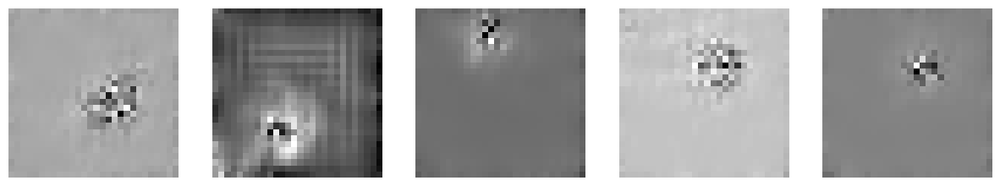

Gradient Flow n1/10 with noise level 0.8992000222206116, iter=91 | mmd=62.104454040527344
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=92 | mmd=60.77434158325195
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=93 | mmd=57.805206298828125
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=94 | mmd=56.375797271728516
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=95 | mmd=52.598388671875
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=96 | mmd=50.13876724243164
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=97 | mmd=49.147640228271484
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=98 | mmd=48.42071533203125
Gradient Flow n1/10 with noise level 0.8992000222206116, iter=99 | mmd=47.8728141784668
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=0 | mmd=48.54060363769531


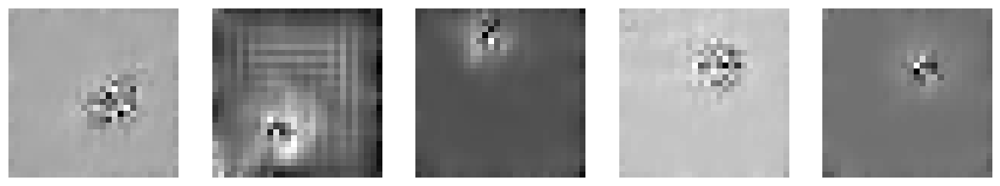

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=1 | mmd=49.4477424621582
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=2 | mmd=48.23075866699219
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=3 | mmd=46.152076721191406
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=4 | mmd=44.74891662597656
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=5 | mmd=45.50679016113281
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=6 | mmd=45.87339782714844
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=7 | mmd=47.205928802490234
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=8 | mmd=42.36577224731445
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=9 | mmd=40.930084228515625
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=10 | mmd=45.06212615966797


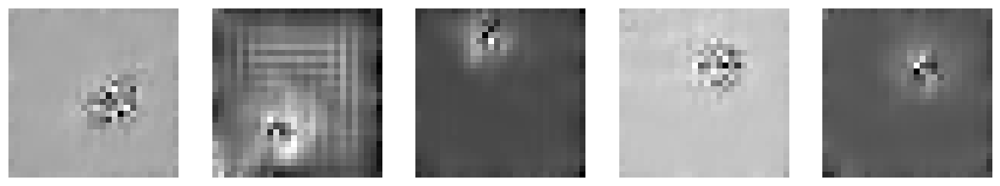

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=11 | mmd=41.20088195800781
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=12 | mmd=43.52257537841797
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=13 | mmd=43.403228759765625
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=14 | mmd=44.597042083740234
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=15 | mmd=43.63837432861328
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=16 | mmd=42.68539810180664
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=17 | mmd=40.20624542236328
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=18 | mmd=41.08875274658203
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=19 | mmd=40.654205322265625
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=20 | mmd=39.2342529296875


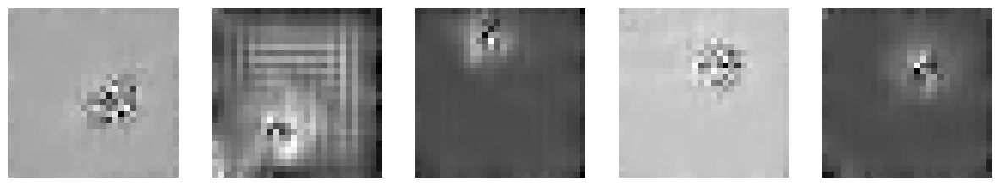

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=21 | mmd=37.70109558105469
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=22 | mmd=40.78466033935547
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=23 | mmd=39.376869201660156
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=24 | mmd=39.19224548339844
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=25 | mmd=36.63014221191406
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=26 | mmd=34.49938201904297
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=27 | mmd=34.83088684082031
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=28 | mmd=36.86573791503906
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=29 | mmd=35.22686004638672
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=30 | mmd=33.32500457763672


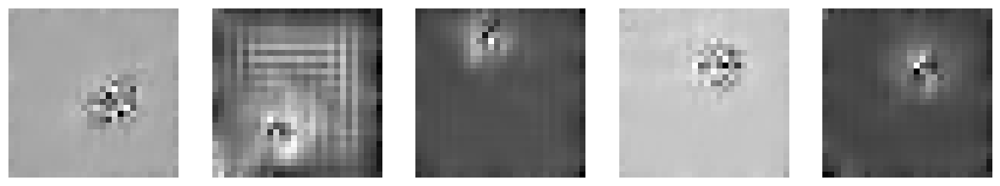

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=31 | mmd=33.44209289550781
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=32 | mmd=34.762298583984375
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=33 | mmd=31.70220375061035
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=34 | mmd=28.37726593017578
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=35 | mmd=33.74860763549805
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=36 | mmd=31.336082458496094
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=37 | mmd=28.908065795898438
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=38 | mmd=29.370346069335938
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=39 | mmd=25.625953674316406
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=40 | mmd=27.932559967041016


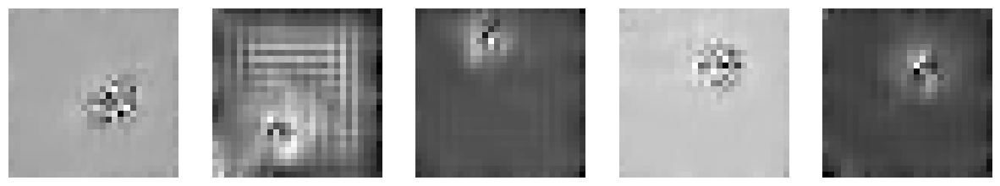

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=41 | mmd=26.046234130859375
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=42 | mmd=26.229816436767578
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=43 | mmd=25.96465301513672
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=44 | mmd=23.401660919189453
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=45 | mmd=25.424114227294922
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=46 | mmd=25.723255157470703
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=47 | mmd=22.96987533569336
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=48 | mmd=27.870800018310547
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=49 | mmd=24.170883178710938
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=50 | mmd=23.68503189086914


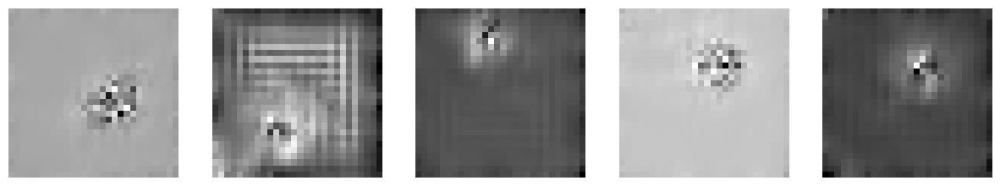

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=51 | mmd=21.700572967529297
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=52 | mmd=23.74073028564453
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=53 | mmd=20.888195037841797
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=54 | mmd=21.273170471191406
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=55 | mmd=23.396366119384766
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=56 | mmd=21.46965789794922
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=57 | mmd=22.200397491455078
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=58 | mmd=20.836383819580078
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=59 | mmd=20.18566131591797
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=60 | mmd=21.22830581665039


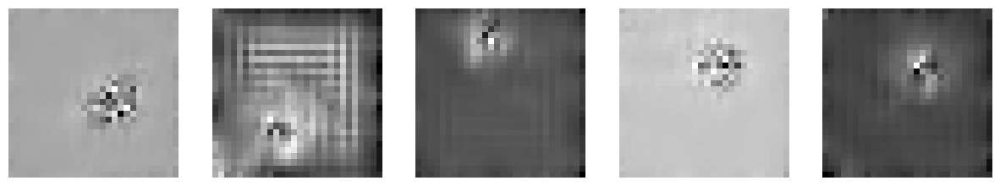

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=61 | mmd=21.696971893310547
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=62 | mmd=18.983657836914062
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=63 | mmd=18.704391479492188
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=64 | mmd=21.026077270507812
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=65 | mmd=19.104389190673828
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=66 | mmd=20.508758544921875
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=67 | mmd=19.54064178466797
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=68 | mmd=21.12671661376953
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=69 | mmd=18.593883514404297
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=70 | mmd=19.589920043945312


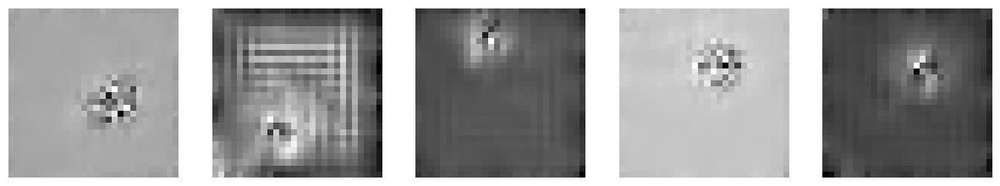

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=71 | mmd=20.03573226928711
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=72 | mmd=19.68582534790039
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=73 | mmd=19.355979919433594
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=74 | mmd=20.582077026367188
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=75 | mmd=20.08536148071289
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=76 | mmd=20.407958984375
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=77 | mmd=18.918376922607422
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=78 | mmd=19.189815521240234
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=79 | mmd=20.433067321777344
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=80 | mmd=18.852432250976562


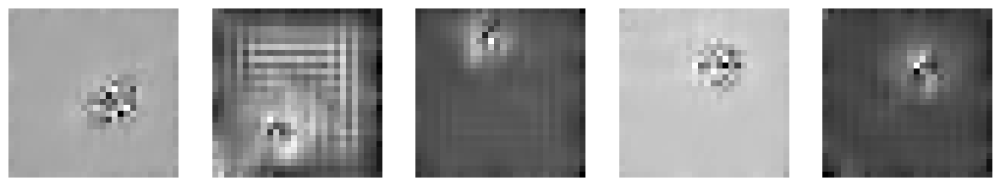

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=81 | mmd=17.70459747314453
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=82 | mmd=17.47046661376953
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=83 | mmd=16.634929656982422
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=84 | mmd=17.123233795166016
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=85 | mmd=18.63058090209961
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=86 | mmd=16.951980590820312
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=87 | mmd=17.251750946044922
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=88 | mmd=18.226139068603516
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=89 | mmd=18.553787231445312
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=90 | mmd=14.982620239257812


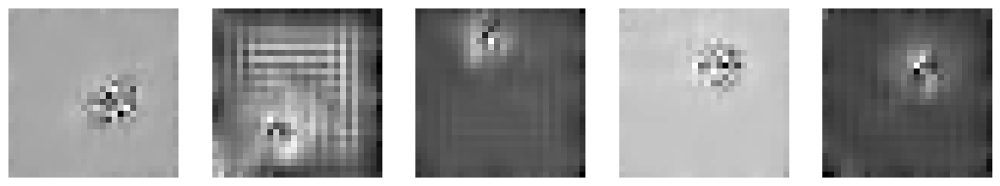

Gradient Flow n2/10 with noise level 0.7993999719619751, iter=91 | mmd=18.686199188232422
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=92 | mmd=17.974578857421875
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=93 | mmd=16.766735076904297
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=94 | mmd=16.58565902709961
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=95 | mmd=16.13772964477539
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=96 | mmd=17.79669189453125
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=97 | mmd=16.439319610595703
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=98 | mmd=16.764347076416016
Gradient Flow n2/10 with noise level 0.7993999719619751, iter=99 | mmd=16.876754760742188
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=0 | mmd=18.416522979736328


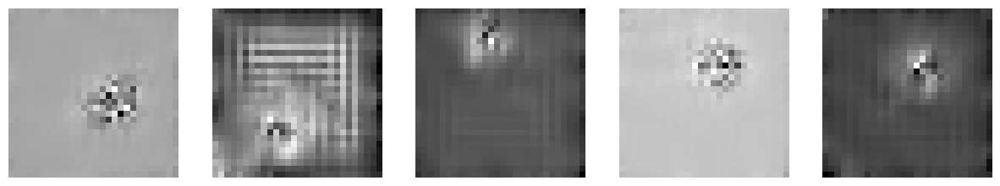

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=1 | mmd=18.798465728759766
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=2 | mmd=16.85818862915039
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=3 | mmd=18.647686004638672
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=4 | mmd=17.169902801513672
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=5 | mmd=17.099349975585938
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=6 | mmd=16.098548889160156
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=7 | mmd=17.595794677734375
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=8 | mmd=17.44451141357422
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=9 | mmd=16.51897430419922
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=10 | mmd=16.58578872680664


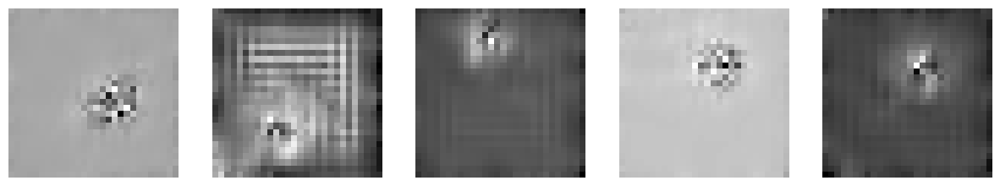

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=11 | mmd=16.37932586669922
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=12 | mmd=16.529556274414062
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=13 | mmd=15.439502716064453
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=14 | mmd=16.341041564941406
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=15 | mmd=16.38119888305664
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=16 | mmd=16.433696746826172
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=17 | mmd=17.720664978027344
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=18 | mmd=18.026844024658203
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=19 | mmd=16.955894470214844
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=20 | mmd=15.51651382446289


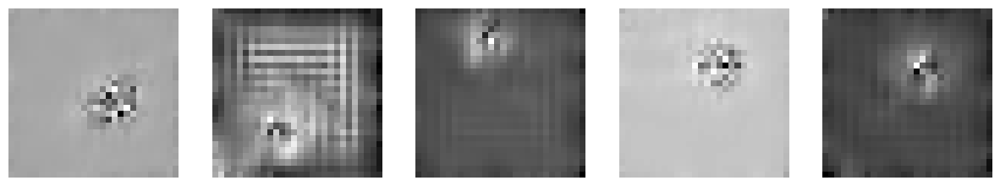

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=21 | mmd=16.56412124633789
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=22 | mmd=16.230934143066406
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=23 | mmd=16.824451446533203
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=24 | mmd=16.626026153564453
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=25 | mmd=17.155269622802734
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=26 | mmd=15.992816925048828
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=27 | mmd=14.620838165283203
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=28 | mmd=15.220367431640625
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=29 | mmd=15.067352294921875
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=30 | mmd=14.964927673339844


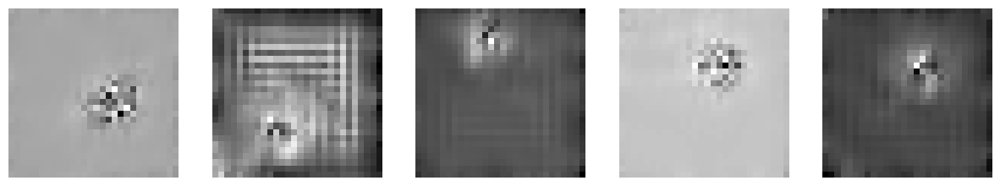

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=31 | mmd=16.432353973388672
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=32 | mmd=16.19278335571289
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=33 | mmd=16.996448516845703
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=34 | mmd=15.521907806396484
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=35 | mmd=16.908592224121094
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=36 | mmd=16.33832550048828
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=37 | mmd=14.81130599975586
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=38 | mmd=15.857582092285156
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=39 | mmd=16.105911254882812
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=40 | mmd=17.119873046875


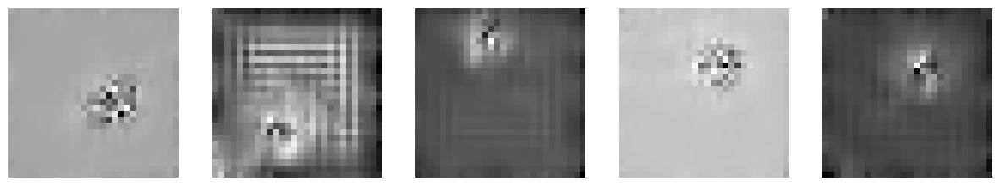

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=41 | mmd=15.952667236328125
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=42 | mmd=16.9766845703125
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=43 | mmd=15.709571838378906
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=44 | mmd=15.798942565917969
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=45 | mmd=16.09372329711914
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=46 | mmd=16.007686614990234
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=47 | mmd=17.697772979736328
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=48 | mmd=15.34750747680664
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=49 | mmd=16.23426055908203
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=50 | mmd=16.191238403320312


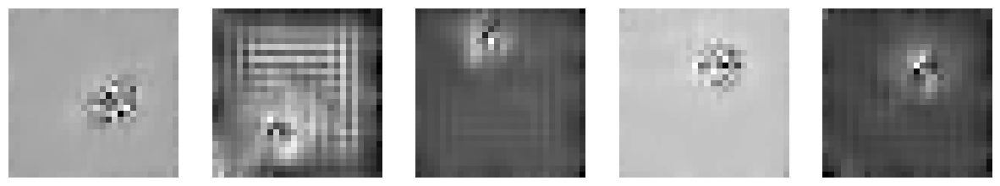

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=51 | mmd=15.462562561035156
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=52 | mmd=17.051654815673828
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=53 | mmd=14.926719665527344
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=54 | mmd=13.901447296142578
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=55 | mmd=14.944385528564453
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=56 | mmd=15.319900512695312
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=57 | mmd=16.70153045654297
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=58 | mmd=17.890464782714844
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=59 | mmd=14.257251739501953
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=60 | mmd=15.568500518798828


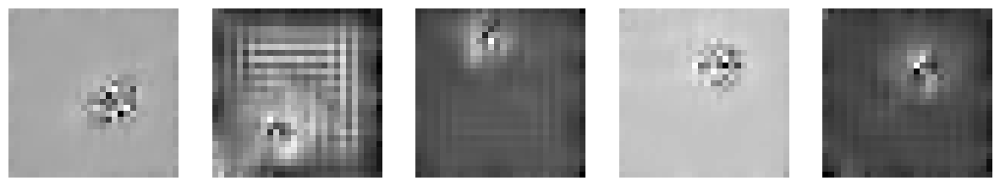

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=61 | mmd=14.497005462646484
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=62 | mmd=18.64527130126953
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=63 | mmd=15.479751586914062
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=64 | mmd=14.676277160644531
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=65 | mmd=16.228801727294922
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=66 | mmd=15.265945434570312
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=67 | mmd=14.916206359863281
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=68 | mmd=14.946815490722656
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=69 | mmd=15.53249740600586
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=70 | mmd=13.831512451171875


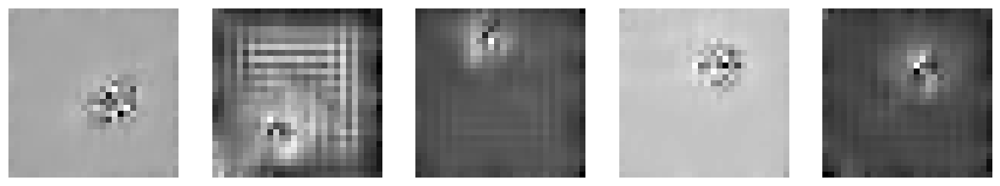

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=71 | mmd=17.685489654541016
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=72 | mmd=16.37762451171875
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=73 | mmd=16.96356201171875
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=74 | mmd=16.18096923828125
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=75 | mmd=17.703468322753906
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=76 | mmd=15.117130279541016
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=77 | mmd=15.088680267333984
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=78 | mmd=17.0570068359375
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=79 | mmd=15.624382019042969
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=80 | mmd=14.077194213867188


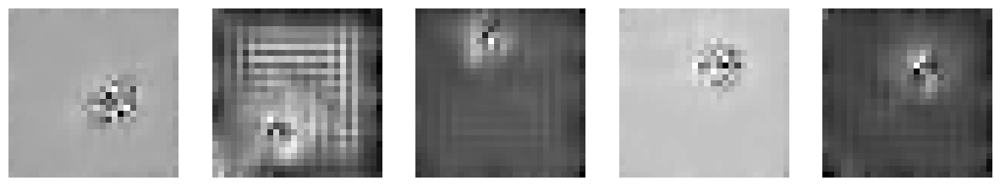

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=81 | mmd=13.79275894165039
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=82 | mmd=16.272701263427734
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=83 | mmd=15.825019836425781
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=84 | mmd=14.035194396972656
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=85 | mmd=15.503181457519531
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=86 | mmd=15.78805923461914
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=87 | mmd=15.241645812988281
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=88 | mmd=15.307586669921875
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=89 | mmd=16.086780548095703
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=90 | mmd=16.566082000732422


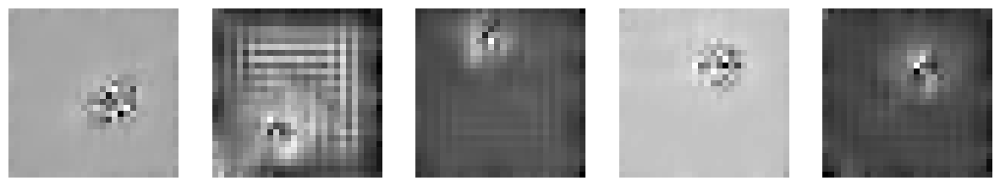

Gradient Flow n3/10 with noise level 0.6995999813079834, iter=91 | mmd=17.814640045166016
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=92 | mmd=15.53470230102539
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=93 | mmd=17.435504913330078
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=94 | mmd=14.490188598632812
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=95 | mmd=15.1651611328125
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=96 | mmd=15.714183807373047
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=97 | mmd=15.93252182006836
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=98 | mmd=15.112682342529297
Gradient Flow n3/10 with noise level 0.6995999813079834, iter=99 | mmd=16.429752349853516
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=0 | mmd=15.098373413085938


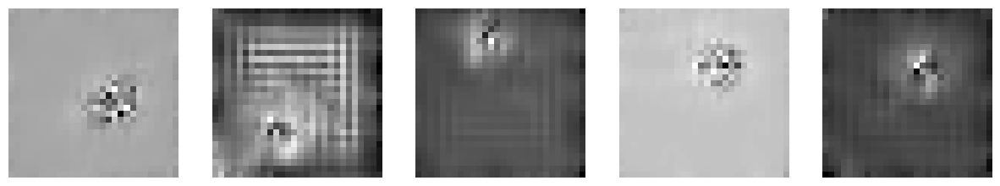

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=1 | mmd=14.301177978515625
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=2 | mmd=17.135272979736328
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=3 | mmd=14.292228698730469
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=4 | mmd=15.182437896728516
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=5 | mmd=17.24294662475586
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=6 | mmd=16.667652130126953
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=7 | mmd=15.15875244140625
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=8 | mmd=15.493568420410156
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=9 | mmd=12.831890106201172
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=10 | mmd=19.139835357666016


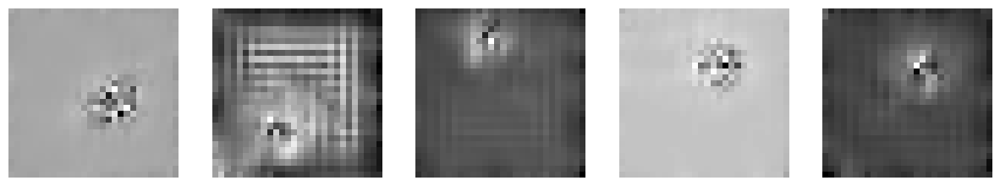

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=11 | mmd=14.485282897949219
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=12 | mmd=16.264636993408203
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=13 | mmd=15.010536193847656
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=14 | mmd=17.05255889892578
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=15 | mmd=15.344444274902344
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=16 | mmd=14.153701782226562
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=17 | mmd=14.256973266601562
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=18 | mmd=16.865371704101562
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=19 | mmd=15.552993774414062
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=20 | mmd=15.554344177246094


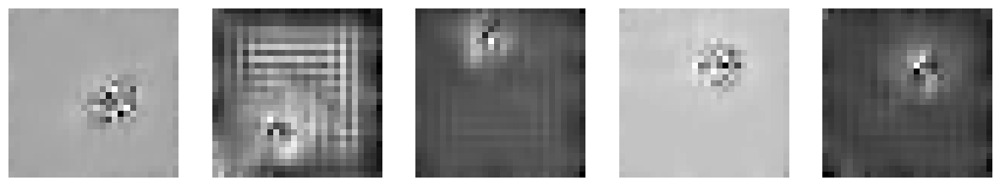

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=21 | mmd=14.866512298583984
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=22 | mmd=16.737319946289062
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=23 | mmd=15.759868621826172
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=24 | mmd=15.940425872802734
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=25 | mmd=13.972671508789062
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=26 | mmd=15.52606201171875
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=27 | mmd=15.410247802734375
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=28 | mmd=14.111198425292969
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=29 | mmd=13.737098693847656
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=30 | mmd=13.824893951416016


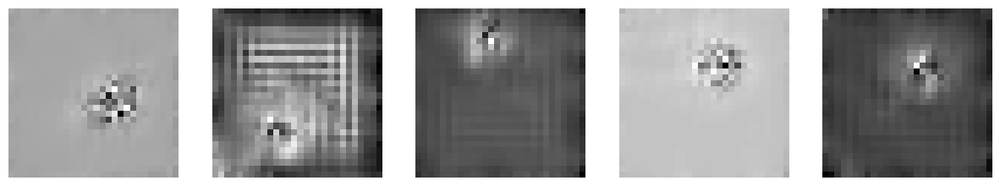

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=31 | mmd=14.541500091552734
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=32 | mmd=13.926597595214844
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=33 | mmd=15.743976593017578
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=34 | mmd=13.359859466552734
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=35 | mmd=14.866985321044922
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=36 | mmd=15.147026062011719
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=37 | mmd=13.756412506103516
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=38 | mmd=15.125843048095703
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=39 | mmd=15.92892074584961
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=40 | mmd=16.598926544189453


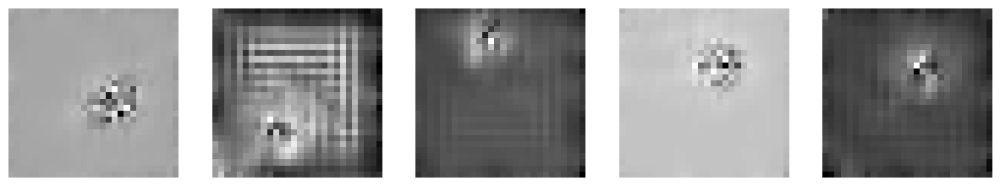

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=41 | mmd=13.988418579101562
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=42 | mmd=15.06793212890625
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=43 | mmd=15.20943832397461
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=44 | mmd=15.85970687866211
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=45 | mmd=15.927970886230469
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=46 | mmd=16.101810455322266
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=47 | mmd=16.606346130371094
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=48 | mmd=17.13797378540039
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=49 | mmd=15.206218719482422
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=50 | mmd=16.085887908935547


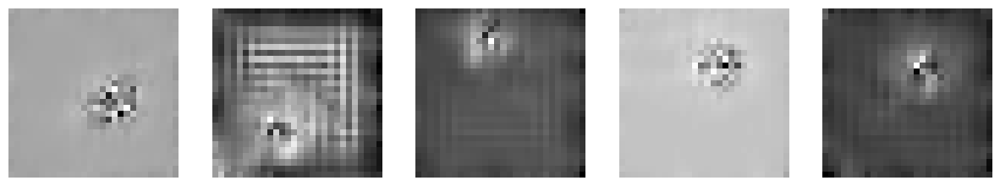

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=51 | mmd=15.534149169921875
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=52 | mmd=16.550609588623047
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=53 | mmd=14.873729705810547
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=54 | mmd=16.059776306152344
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=55 | mmd=14.43008041381836
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=56 | mmd=14.866996765136719
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=57 | mmd=17.399887084960938
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=58 | mmd=15.64178466796875
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=59 | mmd=13.464393615722656
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=60 | mmd=15.789798736572266


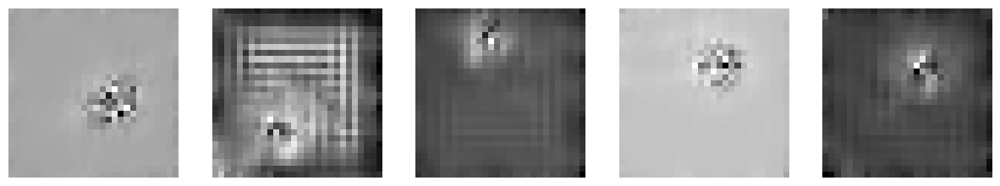

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=61 | mmd=14.952198028564453
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=62 | mmd=15.010673522949219
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=63 | mmd=15.149272918701172
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=64 | mmd=14.642372131347656
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=65 | mmd=13.348751068115234
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=66 | mmd=16.21713638305664
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=67 | mmd=13.65926742553711
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=68 | mmd=14.87307357788086
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=69 | mmd=15.249645233154297
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=70 | mmd=17.531147003173828


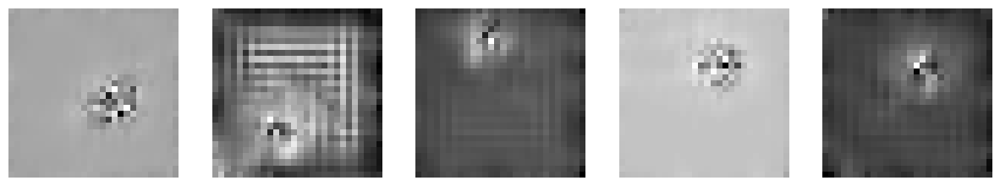

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=71 | mmd=15.942310333251953
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=72 | mmd=13.95766830444336
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=73 | mmd=15.240127563476562
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=74 | mmd=15.408611297607422
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=75 | mmd=13.959762573242188
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=76 | mmd=13.917400360107422
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=77 | mmd=14.5216064453125
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=78 | mmd=14.243034362792969
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=79 | mmd=14.788734436035156
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=80 | mmd=14.925209045410156


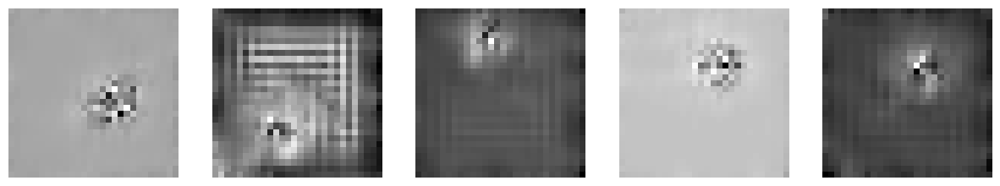

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=81 | mmd=16.036815643310547
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=82 | mmd=14.475650787353516
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=83 | mmd=14.37112045288086
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=84 | mmd=15.756690979003906
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=85 | mmd=15.69863510131836
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=86 | mmd=14.564701080322266
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=87 | mmd=13.835517883300781
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=88 | mmd=15.638862609863281
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=89 | mmd=15.48916244506836
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=90 | mmd=14.103225708007812


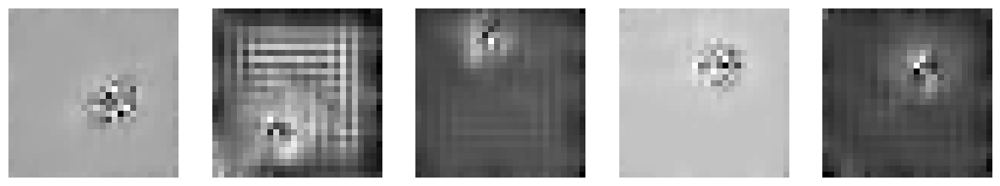

Gradient Flow n4/10 with noise level 0.5997999906539917, iter=91 | mmd=13.589214324951172
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=92 | mmd=17.009021759033203
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=93 | mmd=13.471031188964844
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=94 | mmd=16.61532211303711
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=95 | mmd=13.833660125732422
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=96 | mmd=14.01846694946289
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=97 | mmd=15.597724914550781
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=98 | mmd=15.372440338134766
Gradient Flow n4/10 with noise level 0.5997999906539917, iter=99 | mmd=14.472610473632812
Gradient Flow n5/10 with noise level 0.5, iter=0 | mmd=15.72585678100586


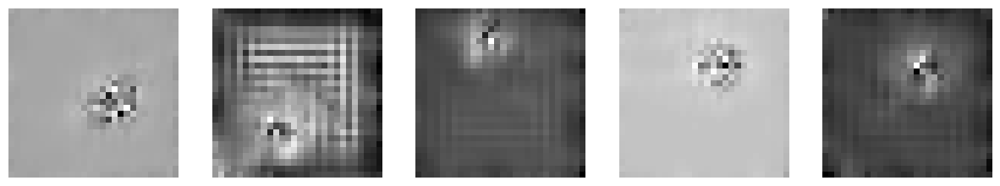

Gradient Flow n5/10 with noise level 0.5, iter=1 | mmd=15.700824737548828
Gradient Flow n5/10 with noise level 0.5, iter=2 | mmd=14.702461242675781
Gradient Flow n5/10 with noise level 0.5, iter=3 | mmd=16.115921020507812
Gradient Flow n5/10 with noise level 0.5, iter=4 | mmd=15.85406494140625
Gradient Flow n5/10 with noise level 0.5, iter=5 | mmd=15.750534057617188
Gradient Flow n5/10 with noise level 0.5, iter=6 | mmd=14.2635498046875
Gradient Flow n5/10 with noise level 0.5, iter=7 | mmd=15.761253356933594
Gradient Flow n5/10 with noise level 0.5, iter=8 | mmd=15.664730072021484
Gradient Flow n5/10 with noise level 0.5, iter=9 | mmd=14.176002502441406
Gradient Flow n5/10 with noise level 0.5, iter=10 | mmd=13.326385498046875


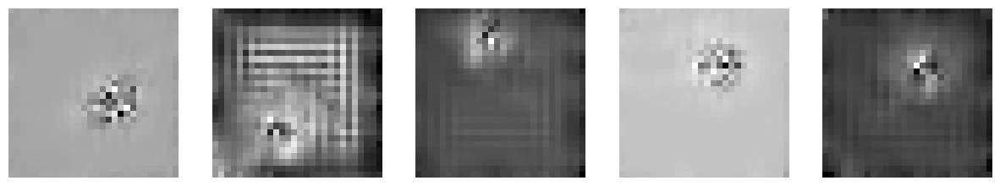

Gradient Flow n5/10 with noise level 0.5, iter=11 | mmd=14.352386474609375
Gradient Flow n5/10 with noise level 0.5, iter=12 | mmd=15.131397247314453
Gradient Flow n5/10 with noise level 0.5, iter=13 | mmd=15.35858154296875
Gradient Flow n5/10 with noise level 0.5, iter=14 | mmd=14.096748352050781
Gradient Flow n5/10 with noise level 0.5, iter=15 | mmd=15.145252227783203
Gradient Flow n5/10 with noise level 0.5, iter=16 | mmd=14.610103607177734
Gradient Flow n5/10 with noise level 0.5, iter=17 | mmd=16.238445281982422
Gradient Flow n5/10 with noise level 0.5, iter=18 | mmd=16.452167510986328
Gradient Flow n5/10 with noise level 0.5, iter=19 | mmd=12.983257293701172
Gradient Flow n5/10 with noise level 0.5, iter=20 | mmd=16.739120483398438


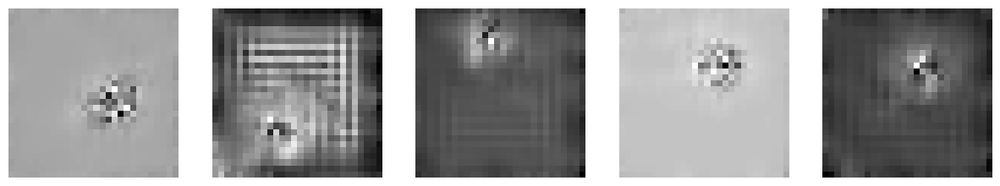

Gradient Flow n5/10 with noise level 0.5, iter=21 | mmd=15.62076187133789
Gradient Flow n5/10 with noise level 0.5, iter=22 | mmd=14.274665832519531
Gradient Flow n5/10 with noise level 0.5, iter=23 | mmd=14.220878601074219
Gradient Flow n5/10 with noise level 0.5, iter=24 | mmd=16.460609436035156
Gradient Flow n5/10 with noise level 0.5, iter=25 | mmd=15.552471160888672
Gradient Flow n5/10 with noise level 0.5, iter=26 | mmd=17.677669525146484
Gradient Flow n5/10 with noise level 0.5, iter=27 | mmd=16.527225494384766
Gradient Flow n5/10 with noise level 0.5, iter=28 | mmd=14.450908660888672
Gradient Flow n5/10 with noise level 0.5, iter=29 | mmd=15.259315490722656
Gradient Flow n5/10 with noise level 0.5, iter=30 | mmd=14.369560241699219


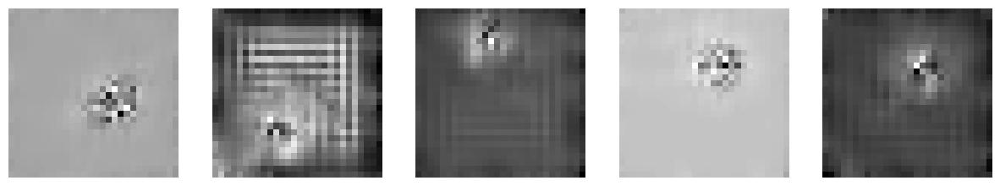

Gradient Flow n5/10 with noise level 0.5, iter=31 | mmd=16.273845672607422
Gradient Flow n5/10 with noise level 0.5, iter=32 | mmd=15.859291076660156
Gradient Flow n5/10 with noise level 0.5, iter=33 | mmd=14.832649230957031
Gradient Flow n5/10 with noise level 0.5, iter=34 | mmd=14.866596221923828
Gradient Flow n5/10 with noise level 0.5, iter=35 | mmd=15.86367416381836
Gradient Flow n5/10 with noise level 0.5, iter=36 | mmd=16.320770263671875
Gradient Flow n5/10 with noise level 0.5, iter=37 | mmd=13.979591369628906
Gradient Flow n5/10 with noise level 0.5, iter=38 | mmd=15.408920288085938
Gradient Flow n5/10 with noise level 0.5, iter=39 | mmd=14.357612609863281
Gradient Flow n5/10 with noise level 0.5, iter=40 | mmd=14.91485595703125


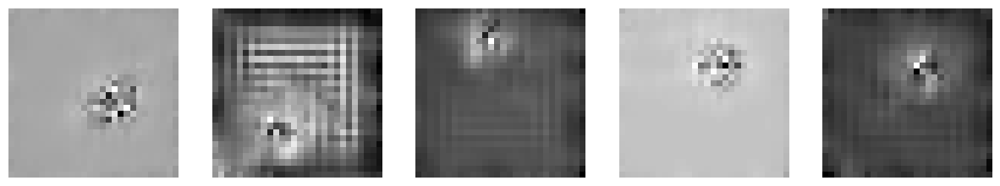

Gradient Flow n5/10 with noise level 0.5, iter=41 | mmd=16.845077514648438
Gradient Flow n5/10 with noise level 0.5, iter=42 | mmd=13.760265350341797
Gradient Flow n5/10 with noise level 0.5, iter=43 | mmd=14.734344482421875
Gradient Flow n5/10 with noise level 0.5, iter=44 | mmd=18.618389129638672
Gradient Flow n5/10 with noise level 0.5, iter=45 | mmd=14.852645874023438
Gradient Flow n5/10 with noise level 0.5, iter=46 | mmd=14.003753662109375
Gradient Flow n5/10 with noise level 0.5, iter=47 | mmd=13.76961898803711
Gradient Flow n5/10 with noise level 0.5, iter=48 | mmd=15.516700744628906
Gradient Flow n5/10 with noise level 0.5, iter=49 | mmd=15.065216064453125
Gradient Flow n5/10 with noise level 0.5, iter=50 | mmd=15.127628326416016


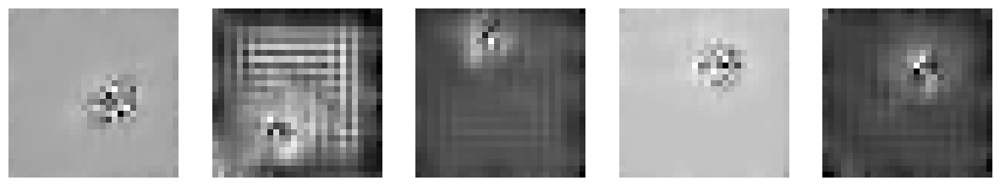

Gradient Flow n5/10 with noise level 0.5, iter=51 | mmd=14.96023178100586
Gradient Flow n5/10 with noise level 0.5, iter=52 | mmd=15.48453140258789
Gradient Flow n5/10 with noise level 0.5, iter=53 | mmd=15.282867431640625
Gradient Flow n5/10 with noise level 0.5, iter=54 | mmd=15.501678466796875
Gradient Flow n5/10 with noise level 0.5, iter=55 | mmd=13.764904022216797
Gradient Flow n5/10 with noise level 0.5, iter=56 | mmd=15.135883331298828
Gradient Flow n5/10 with noise level 0.5, iter=57 | mmd=14.440021514892578
Gradient Flow n5/10 with noise level 0.5, iter=58 | mmd=15.08782958984375
Gradient Flow n5/10 with noise level 0.5, iter=59 | mmd=14.091400146484375
Gradient Flow n5/10 with noise level 0.5, iter=60 | mmd=15.72454833984375


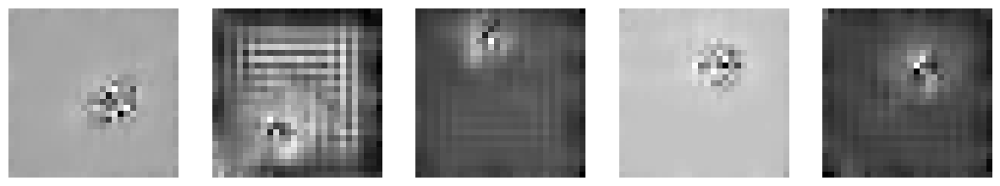

Gradient Flow n5/10 with noise level 0.5, iter=61 | mmd=14.69131088256836
Gradient Flow n5/10 with noise level 0.5, iter=62 | mmd=13.714202880859375
Gradient Flow n5/10 with noise level 0.5, iter=63 | mmd=14.273395538330078
Gradient Flow n5/10 with noise level 0.5, iter=64 | mmd=15.793472290039062
Gradient Flow n5/10 with noise level 0.5, iter=65 | mmd=15.688743591308594
Gradient Flow n5/10 with noise level 0.5, iter=66 | mmd=14.123340606689453
Gradient Flow n5/10 with noise level 0.5, iter=67 | mmd=15.891422271728516
Gradient Flow n5/10 with noise level 0.5, iter=68 | mmd=15.249435424804688
Gradient Flow n5/10 with noise level 0.5, iter=69 | mmd=15.174930572509766
Gradient Flow n5/10 with noise level 0.5, iter=70 | mmd=15.87607192993164


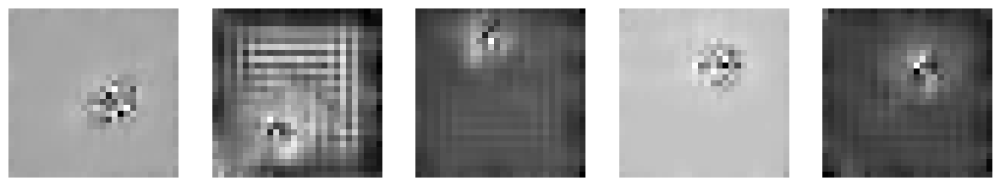

Gradient Flow n5/10 with noise level 0.5, iter=71 | mmd=14.494007110595703
Gradient Flow n5/10 with noise level 0.5, iter=72 | mmd=14.690864562988281
Gradient Flow n5/10 with noise level 0.5, iter=73 | mmd=12.658889770507812
Gradient Flow n5/10 with noise level 0.5, iter=74 | mmd=13.479808807373047
Gradient Flow n5/10 with noise level 0.5, iter=75 | mmd=15.330429077148438
Gradient Flow n5/10 with noise level 0.5, iter=76 | mmd=16.04358673095703
Gradient Flow n5/10 with noise level 0.5, iter=77 | mmd=15.7261962890625
Gradient Flow n5/10 with noise level 0.5, iter=78 | mmd=15.427192687988281
Gradient Flow n5/10 with noise level 0.5, iter=79 | mmd=16.376445770263672
Gradient Flow n5/10 with noise level 0.5, iter=80 | mmd=15.686897277832031


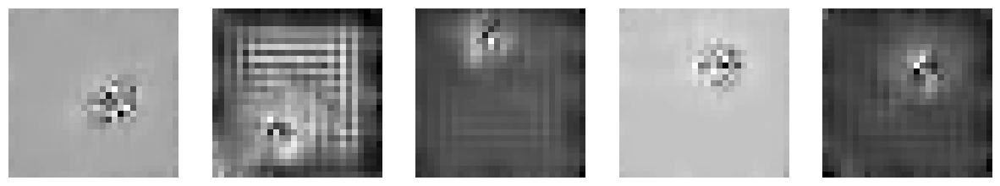

Gradient Flow n5/10 with noise level 0.5, iter=81 | mmd=16.458114624023438
Gradient Flow n5/10 with noise level 0.5, iter=82 | mmd=16.26770782470703
Gradient Flow n5/10 with noise level 0.5, iter=83 | mmd=12.47711181640625
Gradient Flow n5/10 with noise level 0.5, iter=84 | mmd=17.460121154785156
Gradient Flow n5/10 with noise level 0.5, iter=85 | mmd=15.167675018310547
Gradient Flow n5/10 with noise level 0.5, iter=86 | mmd=15.39560317993164
Gradient Flow n5/10 with noise level 0.5, iter=87 | mmd=14.159858703613281
Gradient Flow n5/10 with noise level 0.5, iter=88 | mmd=15.023983001708984
Gradient Flow n5/10 with noise level 0.5, iter=89 | mmd=15.345355987548828
Gradient Flow n5/10 with noise level 0.5, iter=90 | mmd=14.417564392089844


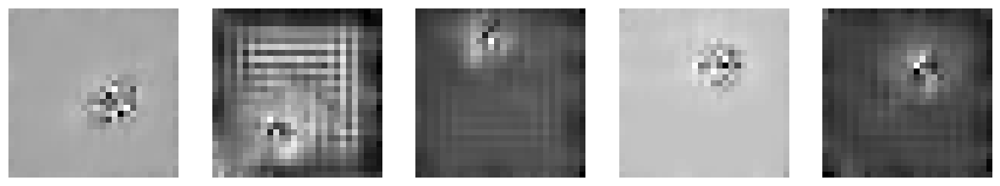

Gradient Flow n5/10 with noise level 0.5, iter=91 | mmd=15.695880889892578
Gradient Flow n5/10 with noise level 0.5, iter=92 | mmd=15.333316802978516
Gradient Flow n5/10 with noise level 0.5, iter=93 | mmd=15.469612121582031
Gradient Flow n5/10 with noise level 0.5, iter=94 | mmd=15.42108154296875
Gradient Flow n5/10 with noise level 0.5, iter=95 | mmd=13.457271575927734
Gradient Flow n5/10 with noise level 0.5, iter=96 | mmd=13.78341293334961
Gradient Flow n5/10 with noise level 0.5, iter=97 | mmd=15.228565216064453
Gradient Flow n5/10 with noise level 0.5, iter=98 | mmd=14.557361602783203
Gradient Flow n5/10 with noise level 0.5, iter=99 | mmd=16.200828552246094
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=0 | mmd=15.286476135253906


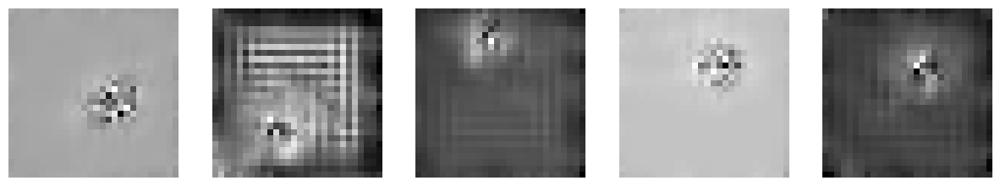

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=1 | mmd=14.484195709228516
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=2 | mmd=15.467754364013672
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=3 | mmd=17.91132354736328
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=4 | mmd=15.81735610961914
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=5 | mmd=16.153255462646484
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=6 | mmd=15.066520690917969
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=7 | mmd=13.729110717773438
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=8 | mmd=15.054691314697266
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=9 | mmd=15.534828186035156
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=10 | mmd=14.750289916992188


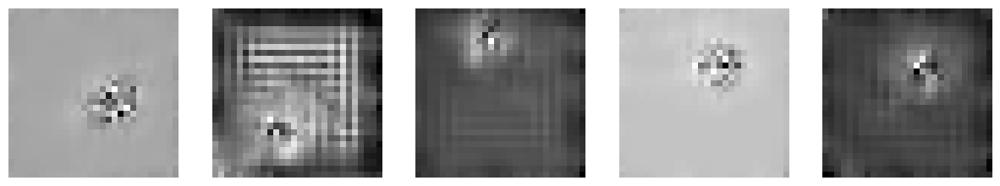

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=11 | mmd=14.562450408935547
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=12 | mmd=13.637123107910156
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=13 | mmd=16.15493392944336
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=14 | mmd=14.886993408203125
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=15 | mmd=14.321773529052734
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=16 | mmd=15.228668212890625
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=17 | mmd=13.586799621582031
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=18 | mmd=14.971672058105469
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=19 | mmd=17.458988189697266
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=20 | mmd=14.696533203125


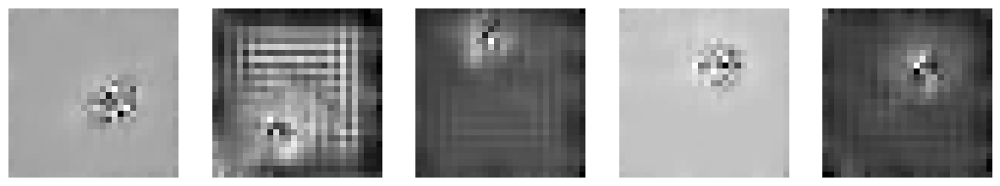

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=21 | mmd=17.380542755126953
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=22 | mmd=14.660350799560547
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=23 | mmd=15.712272644042969
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=24 | mmd=14.415210723876953
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=25 | mmd=14.9989013671875
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=26 | mmd=14.748115539550781
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=27 | mmd=14.847724914550781
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=28 | mmd=14.973594665527344
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=29 | mmd=16.01569366455078
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=30 | mmd=14.685428619384766


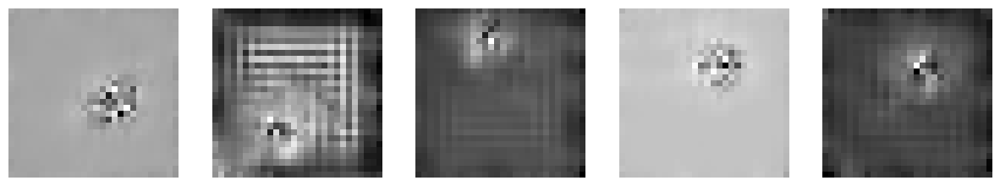

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=31 | mmd=13.309329986572266
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=32 | mmd=16.358802795410156
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=33 | mmd=15.789600372314453
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=34 | mmd=15.561046600341797
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=35 | mmd=14.86419677734375
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=36 | mmd=15.565593719482422
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=37 | mmd=14.846294403076172
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=38 | mmd=15.393562316894531
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=39 | mmd=15.711227416992188
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=40 | mmd=16.343002319335938


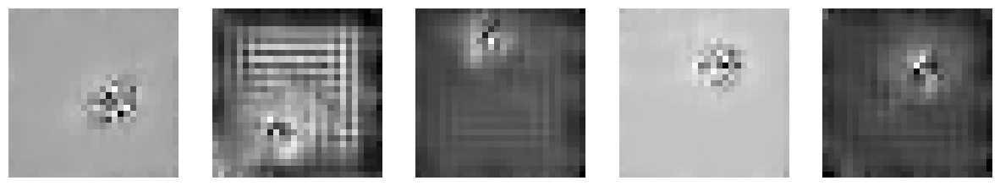

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=41 | mmd=13.902118682861328
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=42 | mmd=17.231887817382812
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=43 | mmd=15.490432739257812
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=44 | mmd=14.405414581298828
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=45 | mmd=15.351512908935547
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=46 | mmd=15.719867706298828
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=47 | mmd=14.801021575927734
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=48 | mmd=15.424629211425781
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=49 | mmd=15.457286834716797
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=50 | mmd=13.017749786376953


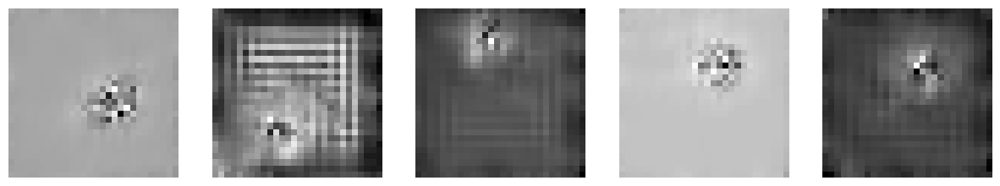

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=51 | mmd=15.750804901123047
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=52 | mmd=14.45248794555664
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=53 | mmd=15.721794128417969
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=54 | mmd=14.309558868408203
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=55 | mmd=15.91299057006836
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=56 | mmd=14.570350646972656
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=57 | mmd=15.993492126464844
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=58 | mmd=14.307708740234375
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=59 | mmd=15.389087677001953
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=60 | mmd=15.13140869140625


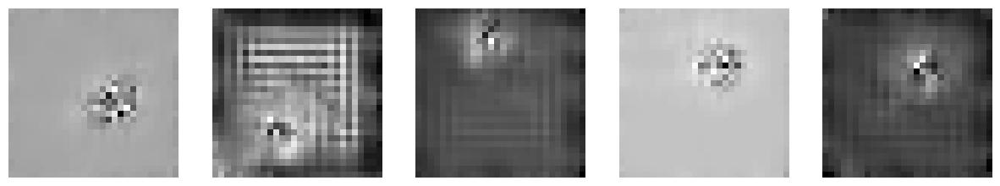

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=61 | mmd=14.783817291259766
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=62 | mmd=14.969585418701172
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=63 | mmd=13.05025863647461
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=64 | mmd=16.088191986083984
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=65 | mmd=13.874382019042969
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=66 | mmd=14.388874053955078
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=67 | mmd=18.55467987060547
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=68 | mmd=14.449844360351562
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=69 | mmd=15.019981384277344
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=70 | mmd=14.86492919921875


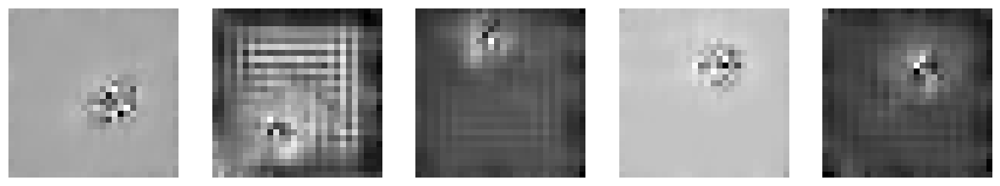

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=71 | mmd=13.956886291503906
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=72 | mmd=14.855789184570312
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=73 | mmd=15.880687713623047
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=74 | mmd=15.31100845336914
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=75 | mmd=15.030712127685547
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=76 | mmd=15.094806671142578
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=77 | mmd=16.09177017211914
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=78 | mmd=16.36882781982422
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=79 | mmd=12.941513061523438
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=80 | mmd=16.458045959472656


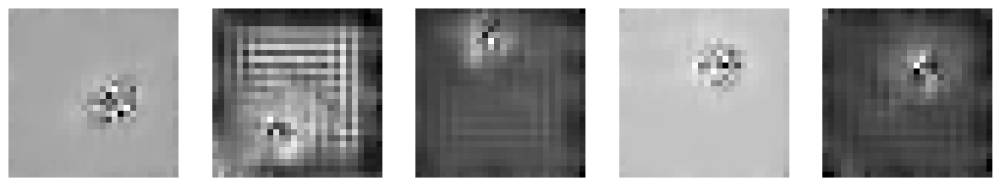

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=81 | mmd=14.89407730102539
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=82 | mmd=15.382225036621094
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=83 | mmd=14.362773895263672
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=84 | mmd=15.451896667480469
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=85 | mmd=15.96915054321289
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=86 | mmd=15.809101104736328
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=87 | mmd=15.144561767578125
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=88 | mmd=14.776580810546875
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=89 | mmd=15.288490295410156
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=90 | mmd=14.407012939453125


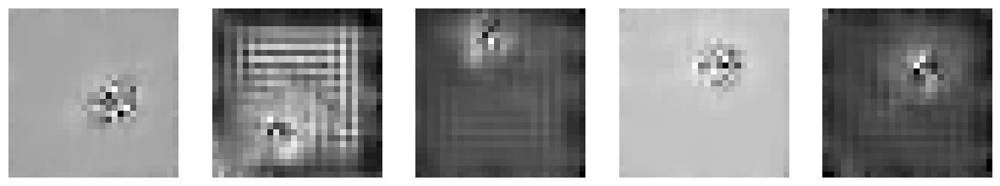

Gradient Flow n6/10 with noise level 0.4002000093460083, iter=91 | mmd=14.549232482910156
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=92 | mmd=14.76668930053711
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=93 | mmd=14.92049789428711
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=94 | mmd=15.17379379272461
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=95 | mmd=14.631484985351562
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=96 | mmd=15.263683319091797
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=97 | mmd=14.835514068603516
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=98 | mmd=13.45650863647461
Gradient Flow n6/10 with noise level 0.4002000093460083, iter=99 | mmd=15.232383728027344
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=0 | mmd=16.225082397460938


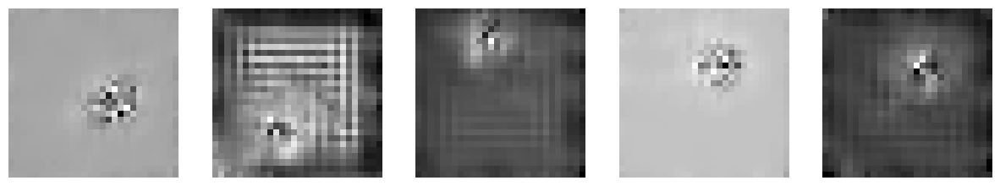

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=1 | mmd=16.265178680419922
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=2 | mmd=15.216571807861328
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=3 | mmd=15.280097961425781
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=4 | mmd=15.246467590332031
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=5 | mmd=17.880619049072266
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=6 | mmd=15.60049057006836
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=7 | mmd=15.73623275756836
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=8 | mmd=14.364822387695312
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=9 | mmd=14.747058868408203
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=10 | mmd=15.285636901855469


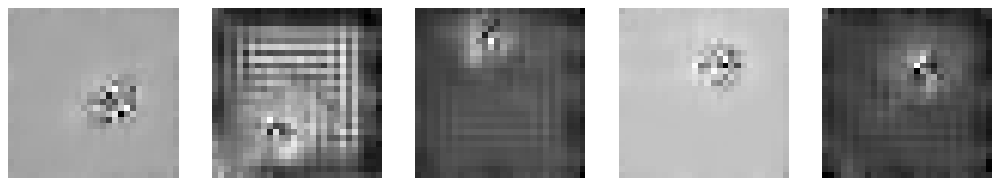

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=11 | mmd=15.42245864868164
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=12 | mmd=15.146984100341797
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=13 | mmd=14.738636016845703
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=14 | mmd=13.974422454833984
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=15 | mmd=19.71125030517578
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=16 | mmd=15.408943176269531
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=17 | mmd=14.8790283203125
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=18 | mmd=14.109630584716797
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=19 | mmd=15.734291076660156
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=20 | mmd=15.504852294921875


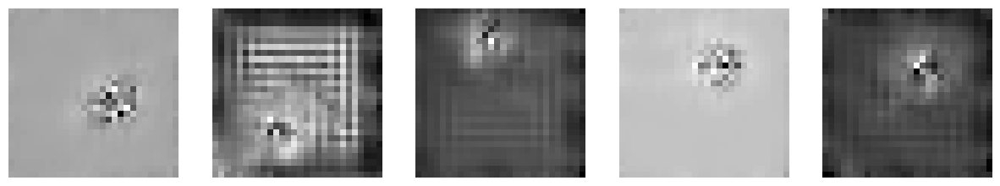

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=21 | mmd=15.243526458740234
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=22 | mmd=14.512775421142578
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=23 | mmd=15.150238037109375
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=24 | mmd=14.203502655029297
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=25 | mmd=14.635810852050781
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=26 | mmd=15.14358901977539
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=27 | mmd=14.17861557006836
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=28 | mmd=13.917221069335938
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=29 | mmd=15.116584777832031
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=30 | mmd=13.149547576904297


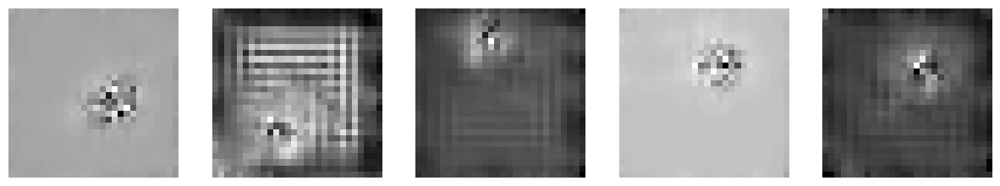

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=31 | mmd=15.648967742919922
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=32 | mmd=14.193572998046875
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=33 | mmd=16.052207946777344
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=34 | mmd=14.855476379394531
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=35 | mmd=15.412250518798828
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=36 | mmd=15.388202667236328
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=37 | mmd=14.986652374267578
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=38 | mmd=15.300735473632812
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=39 | mmd=13.880577087402344
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=40 | mmd=15.51287841796875


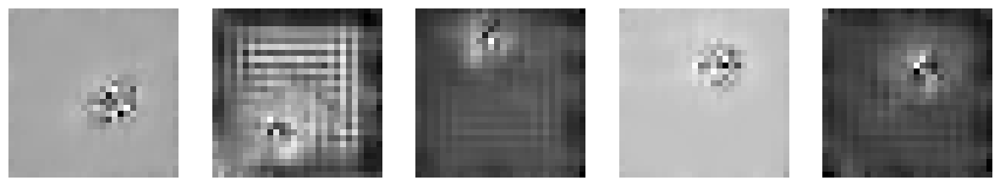

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=41 | mmd=15.258460998535156
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=42 | mmd=12.717906951904297
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=43 | mmd=16.26632308959961
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=44 | mmd=15.994964599609375
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=45 | mmd=15.985755920410156
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=46 | mmd=15.730003356933594
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=47 | mmd=14.75082778930664
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=48 | mmd=16.418872833251953
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=49 | mmd=12.686344146728516
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=50 | mmd=12.871749877929688


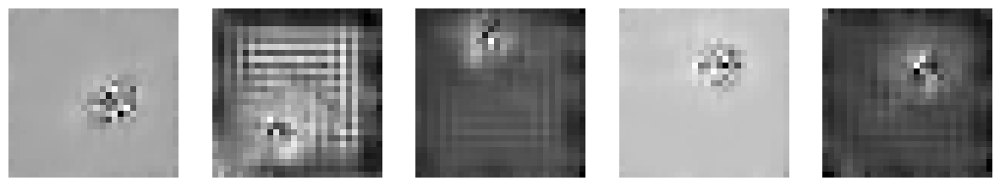

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=51 | mmd=15.491771697998047
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=52 | mmd=15.56832504272461
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=53 | mmd=15.821094512939453
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=54 | mmd=14.752269744873047
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=55 | mmd=15.008464813232422
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=56 | mmd=14.735668182373047
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=57 | mmd=14.642383575439453
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=58 | mmd=15.611385345458984
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=59 | mmd=15.907073974609375
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=60 | mmd=15.43496322631836


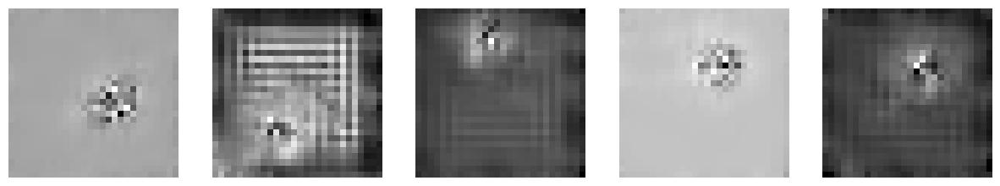

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=61 | mmd=13.49029541015625
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=62 | mmd=15.527729034423828
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=63 | mmd=16.14834976196289
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=64 | mmd=15.294788360595703
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=65 | mmd=15.677345275878906
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=66 | mmd=16.541542053222656
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=67 | mmd=14.274696350097656
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=68 | mmd=14.224998474121094
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=69 | mmd=17.315242767333984
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=70 | mmd=16.1092529296875


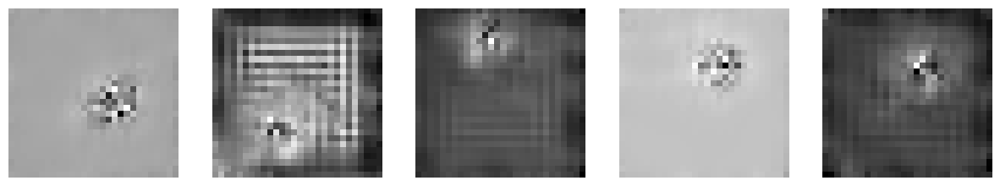

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=71 | mmd=14.099632263183594
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=72 | mmd=17.54336166381836
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=73 | mmd=15.278610229492188
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=74 | mmd=15.286590576171875
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=75 | mmd=16.99321746826172
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=76 | mmd=14.319770812988281
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=77 | mmd=14.017196655273438
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=78 | mmd=13.437305450439453
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=79 | mmd=13.223251342773438
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=80 | mmd=16.296985626220703


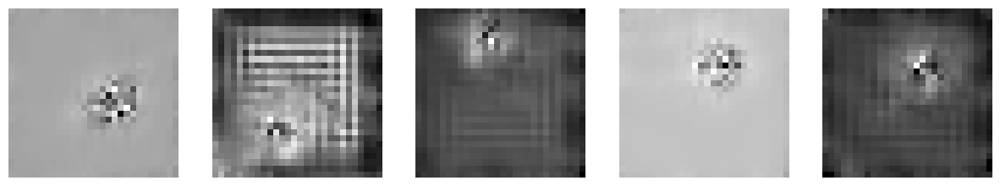

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=81 | mmd=14.01068115234375
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=82 | mmd=15.301742553710938
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=83 | mmd=15.35296630859375
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=84 | mmd=16.841960906982422
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=85 | mmd=14.672050476074219
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=86 | mmd=13.700687408447266
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=87 | mmd=15.142528533935547
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=88 | mmd=14.186729431152344
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=89 | mmd=15.614593505859375
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=90 | mmd=16.025909423828125


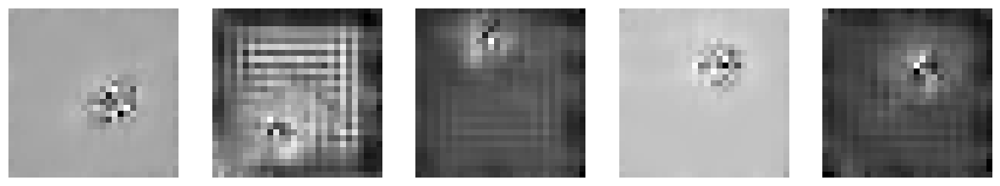

Gradient Flow n7/10 with noise level 0.3003999888896942, iter=91 | mmd=16.539432525634766
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=92 | mmd=14.351356506347656
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=93 | mmd=14.719623565673828
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=94 | mmd=16.555557250976562
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=95 | mmd=15.303913116455078
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=96 | mmd=16.04220199584961
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=97 | mmd=14.699935913085938
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=98 | mmd=16.312091827392578
Gradient Flow n7/10 with noise level 0.3003999888896942, iter=99 | mmd=15.31317138671875
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=0 | mmd=13.83962631225586


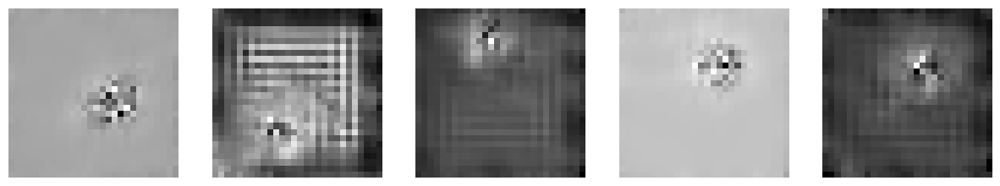

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=1 | mmd=14.825668334960938
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=2 | mmd=15.157642364501953
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=3 | mmd=15.036663055419922
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=4 | mmd=14.111091613769531
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=5 | mmd=16.441890716552734
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=6 | mmd=15.219013214111328
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=7 | mmd=14.254459381103516
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=8 | mmd=15.676082611083984
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=9 | mmd=14.001018524169922
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=10 | mmd=14.33388900756836


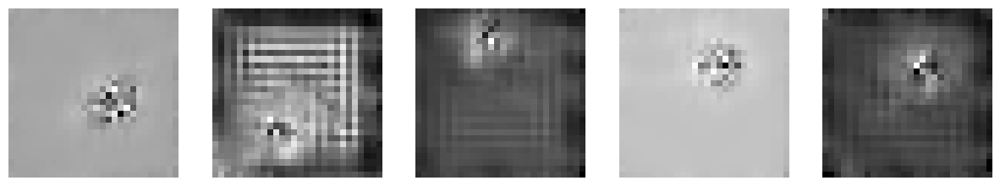

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=11 | mmd=16.057392120361328
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=12 | mmd=18.31560516357422
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=13 | mmd=15.053165435791016
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=14 | mmd=16.00201416015625
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=15 | mmd=14.739494323730469
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=16 | mmd=15.655147552490234
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=17 | mmd=14.938606262207031
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=18 | mmd=14.342170715332031
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=19 | mmd=14.879684448242188
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=20 | mmd=14.027759552001953


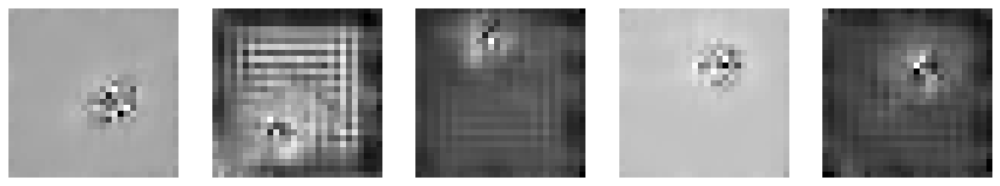

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=21 | mmd=14.97042465209961
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=22 | mmd=15.823375701904297
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=23 | mmd=16.616870880126953
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=24 | mmd=14.843463897705078
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=25 | mmd=14.97177505493164
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=26 | mmd=14.078502655029297
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=27 | mmd=14.293266296386719
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=28 | mmd=14.025764465332031
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=29 | mmd=14.829315185546875
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=30 | mmd=16.21712875366211


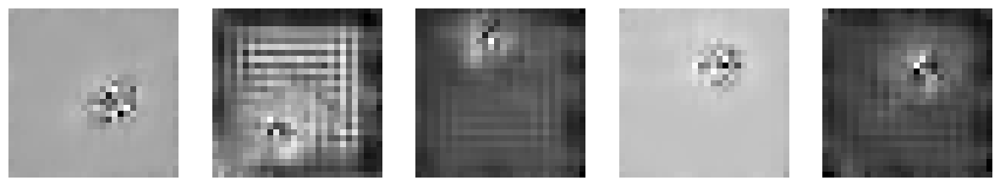

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=31 | mmd=14.0732421875
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=32 | mmd=14.48989486694336
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=33 | mmd=14.412883758544922
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=34 | mmd=15.041419982910156
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=35 | mmd=14.666683197021484
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=36 | mmd=15.256645202636719
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=37 | mmd=15.18703842163086
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=38 | mmd=14.822868347167969
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=39 | mmd=17.96773910522461
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=40 | mmd=15.91812515258789


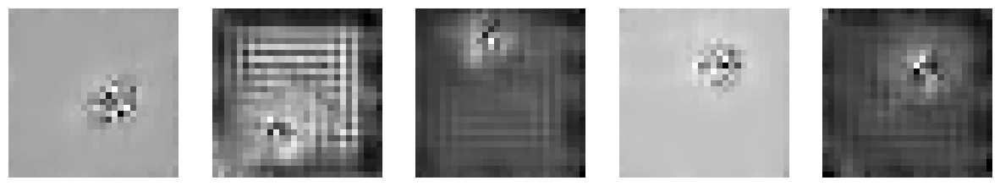

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=41 | mmd=15.453254699707031
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=42 | mmd=14.185810089111328
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=43 | mmd=18.536640167236328
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=44 | mmd=14.572975158691406
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=45 | mmd=14.054252624511719
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=46 | mmd=16.600696563720703
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=47 | mmd=15.153633117675781
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=48 | mmd=15.388912200927734
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=49 | mmd=15.332023620605469
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=50 | mmd=16.38518524169922


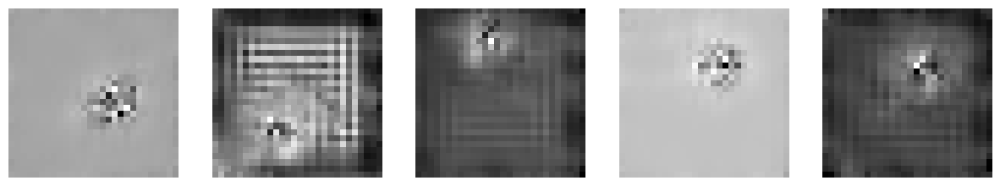

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=51 | mmd=15.912174224853516
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=52 | mmd=14.452404022216797
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=53 | mmd=15.56344223022461
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=54 | mmd=15.874824523925781
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=55 | mmd=15.442546844482422
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=56 | mmd=16.132606506347656
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=57 | mmd=14.983638763427734
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=58 | mmd=17.05343246459961
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=59 | mmd=13.735111236572266
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=60 | mmd=15.438289642333984


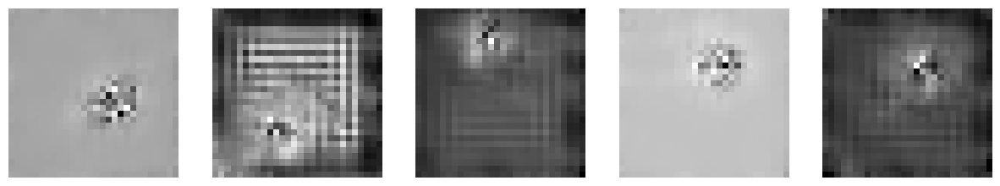

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=61 | mmd=14.493907928466797
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=62 | mmd=15.477775573730469
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=63 | mmd=13.431224822998047
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=64 | mmd=14.968914031982422
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=65 | mmd=18.311504364013672
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=66 | mmd=14.277889251708984
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=67 | mmd=13.147781372070312
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=68 | mmd=15.440208435058594
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=69 | mmd=16.61829376220703
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=70 | mmd=14.158313751220703


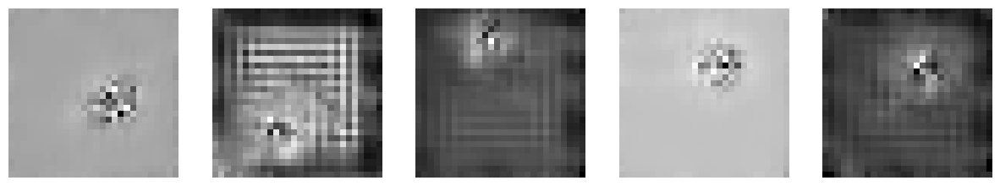

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=71 | mmd=14.349128723144531
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=72 | mmd=14.689960479736328
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=73 | mmd=13.826225280761719
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=74 | mmd=15.019050598144531
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=75 | mmd=14.44683837890625
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=76 | mmd=15.717639923095703
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=77 | mmd=15.428573608398438
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=78 | mmd=15.649932861328125
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=79 | mmd=15.750419616699219
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=80 | mmd=14.644611358642578


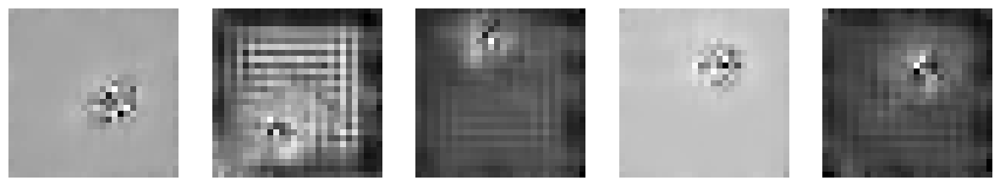

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=81 | mmd=16.485183715820312
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=82 | mmd=16.084152221679688
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=83 | mmd=15.959129333496094
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=84 | mmd=14.643058776855469
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=85 | mmd=13.771282196044922
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=86 | mmd=17.234432220458984
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=87 | mmd=14.531204223632812
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=88 | mmd=14.306774139404297
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=89 | mmd=13.996253967285156
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=90 | mmd=14.584785461425781


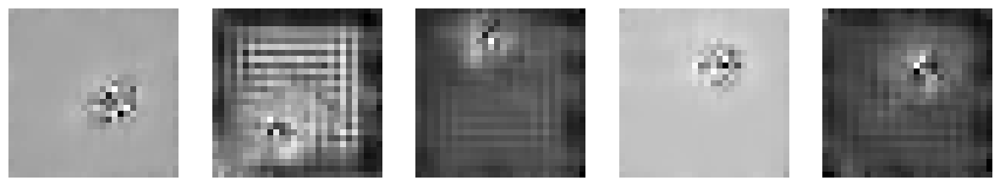

Gradient Flow n8/10 with noise level 0.20059999823570251, iter=91 | mmd=15.463741302490234
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=92 | mmd=14.079959869384766
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=93 | mmd=16.208045959472656
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=94 | mmd=15.670669555664062
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=95 | mmd=12.905792236328125
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=96 | mmd=13.638484954833984
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=97 | mmd=15.796405792236328
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=98 | mmd=13.998947143554688
Gradient Flow n8/10 with noise level 0.20059999823570251, iter=99 | mmd=16.136489868164062
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=0 | mmd=15.788471221923828


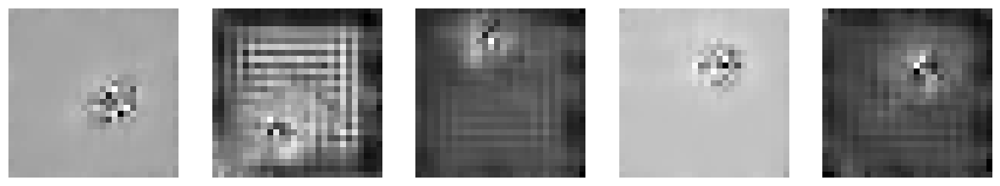

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=1 | mmd=16.83283233642578
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=2 | mmd=13.55667495727539
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=3 | mmd=17.178489685058594
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=4 | mmd=14.931934356689453
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=5 | mmd=14.616527557373047
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=6 | mmd=14.804107666015625
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=7 | mmd=15.928451538085938
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=8 | mmd=14.286567687988281
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=9 | mmd=14.6448974609375
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=10 | mmd=15.88104248046875


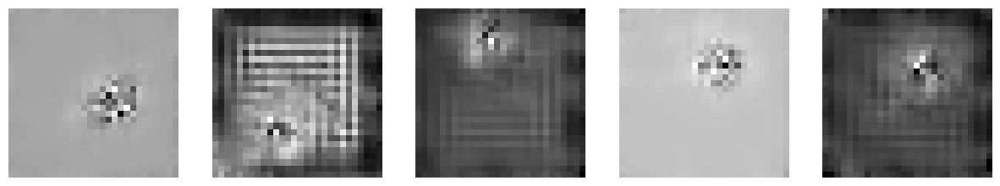

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=11 | mmd=13.979728698730469
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=12 | mmd=15.591472625732422
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=13 | mmd=15.456192016601562
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=14 | mmd=15.1732177734375
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=15 | mmd=15.007633209228516
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=16 | mmd=14.916107177734375
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=17 | mmd=15.538803100585938
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=18 | mmd=13.88687515258789
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=19 | mmd=14.551155090332031
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=20 | mmd=14.855918884277344


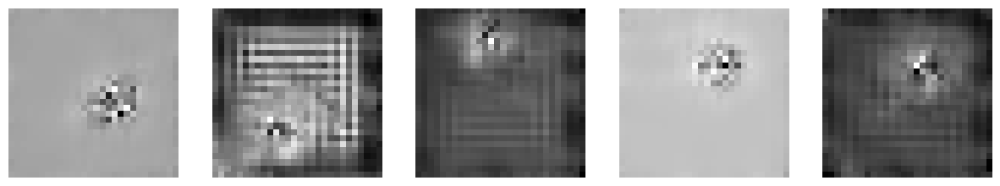

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=21 | mmd=14.967010498046875
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=22 | mmd=15.64108657836914
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=23 | mmd=16.190750122070312
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=24 | mmd=13.866161346435547
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=25 | mmd=14.78188705444336
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=26 | mmd=13.5831298828125
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=27 | mmd=14.21115493774414
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=28 | mmd=13.714000701904297
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=29 | mmd=14.173789978027344
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=30 | mmd=14.016178131103516


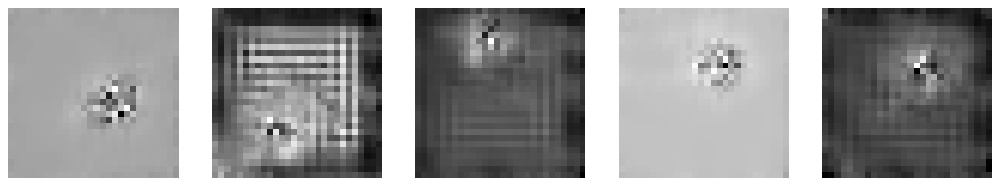

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=31 | mmd=14.190750122070312
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=32 | mmd=14.476600646972656
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=33 | mmd=18.438732147216797
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=34 | mmd=14.383499145507812
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=35 | mmd=14.928230285644531
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=36 | mmd=15.861408233642578
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=37 | mmd=15.808616638183594
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=38 | mmd=13.035381317138672
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=39 | mmd=15.433921813964844
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=40 | mmd=15.68905258178711


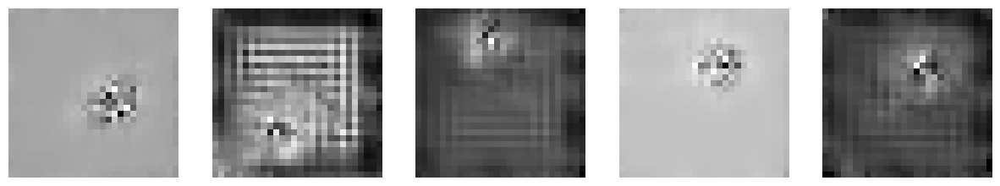

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=41 | mmd=16.596328735351562
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=42 | mmd=15.07650375366211
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=43 | mmd=15.351879119873047
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=44 | mmd=14.88125228881836
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=45 | mmd=17.59992218017578
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=46 | mmd=14.688838958740234
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=47 | mmd=15.116729736328125
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=48 | mmd=13.678874969482422
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=49 | mmd=14.180862426757812
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=50 | mmd=14.65695571899414


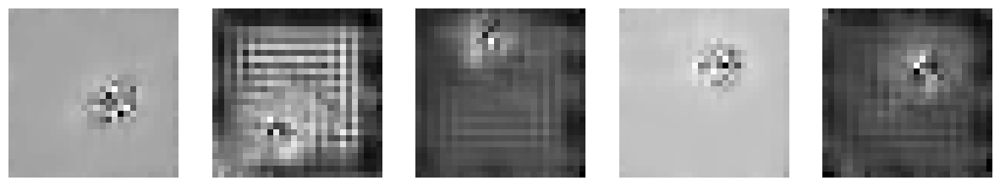

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=51 | mmd=16.062259674072266
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=52 | mmd=15.24453353881836
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=53 | mmd=14.354576110839844
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=54 | mmd=14.181648254394531
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=55 | mmd=14.30682373046875
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=56 | mmd=15.094245910644531
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=57 | mmd=13.89565658569336
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=58 | mmd=14.419063568115234
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=59 | mmd=17.080284118652344
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=60 | mmd=13.5404052734375


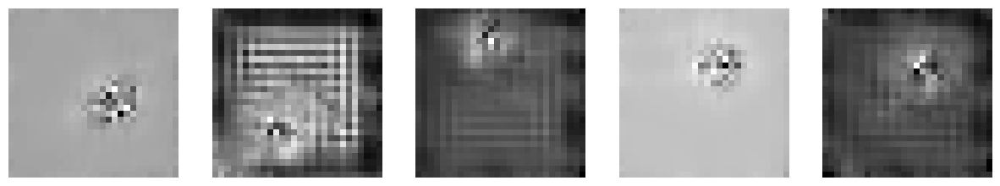

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=61 | mmd=13.672771453857422
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=62 | mmd=14.922283172607422
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=63 | mmd=15.480117797851562
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=64 | mmd=13.89431381225586
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=65 | mmd=16.209346771240234
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=66 | mmd=14.015850067138672
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=67 | mmd=16.917457580566406
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=68 | mmd=15.868961334228516
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=69 | mmd=16.317771911621094
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=70 | mmd=14.708389282226562


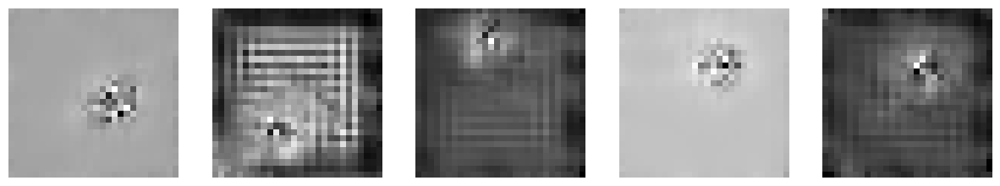

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=71 | mmd=15.1055908203125
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=72 | mmd=15.869365692138672
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=73 | mmd=14.281326293945312
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=74 | mmd=14.142704010009766
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=75 | mmd=16.74652862548828
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=76 | mmd=13.266132354736328
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=77 | mmd=15.268718719482422
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=78 | mmd=15.274017333984375
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=79 | mmd=13.971759796142578
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=80 | mmd=15.875099182128906


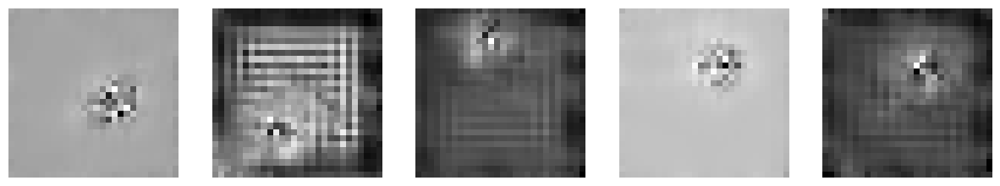

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=81 | mmd=14.272514343261719
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=82 | mmd=14.11892318725586
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=83 | mmd=15.10898208618164
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=84 | mmd=17.50204849243164
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=85 | mmd=16.38802719116211
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=86 | mmd=14.396408081054688
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=87 | mmd=15.933090209960938
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=88 | mmd=14.38836669921875
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=89 | mmd=13.57071304321289
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=90 | mmd=15.099052429199219


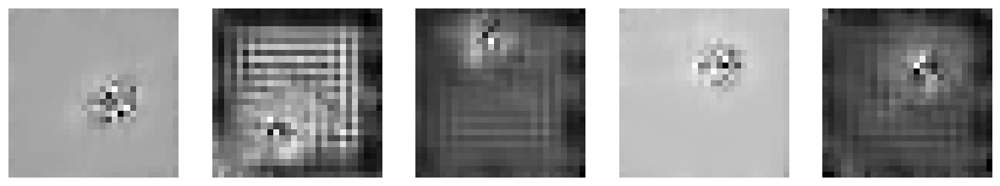

Gradient Flow n9/10 with noise level 0.10080000013113022, iter=91 | mmd=14.967002868652344
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=92 | mmd=14.252120971679688
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=93 | mmd=15.987770080566406
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=94 | mmd=15.200057983398438
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=95 | mmd=15.024139404296875
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=96 | mmd=14.03909683227539
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=97 | mmd=15.216503143310547
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=98 | mmd=15.972148895263672
Gradient Flow n9/10 with noise level 0.10080000013113022, iter=99 | mmd=16.728836059570312
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=0 | mmd=12.894111633300781


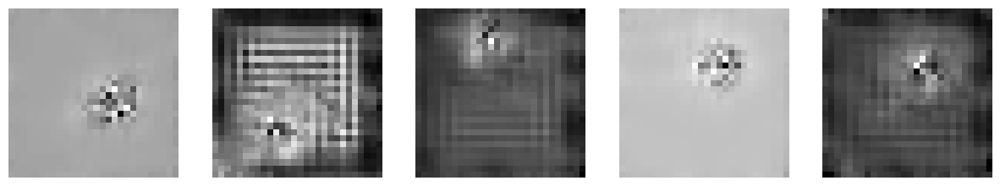

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=1 | mmd=15.602073669433594
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=2 | mmd=15.395416259765625
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=3 | mmd=15.285049438476562
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=4 | mmd=15.953834533691406
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=5 | mmd=13.511810302734375
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=6 | mmd=14.09195327758789
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=7 | mmd=16.397552490234375
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=8 | mmd=16.01116180419922
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=9 | mmd=15.012325286865234
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=10 | mmd=16.46734619140625


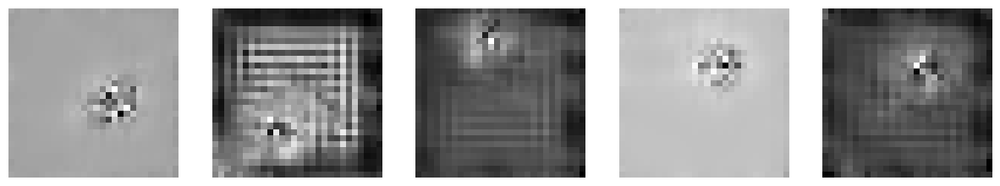

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=11 | mmd=13.61056900024414
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=12 | mmd=13.396713256835938
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=13 | mmd=16.31072235107422
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=14 | mmd=14.305099487304688
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=15 | mmd=15.336723327636719
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=16 | mmd=14.956192016601562
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=17 | mmd=14.998374938964844
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=18 | mmd=14.575759887695312
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=19 | mmd=15.022380828857422
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=20 | mmd=17.830581665039062


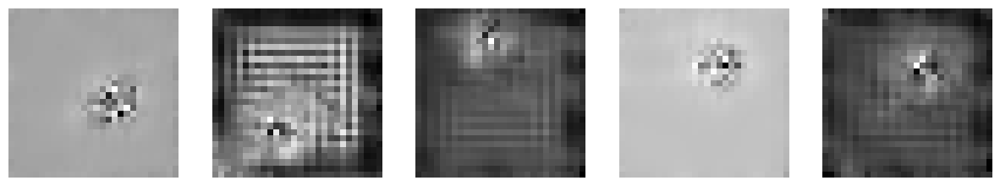

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=21 | mmd=17.15633773803711
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=22 | mmd=14.302566528320312
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=23 | mmd=14.034255981445312
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=24 | mmd=13.531280517578125
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=25 | mmd=14.897506713867188
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=26 | mmd=14.274566650390625
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=27 | mmd=15.198802947998047
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=28 | mmd=15.32815933227539
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=29 | mmd=13.228622436523438
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=30 | mmd=15.664230346679688


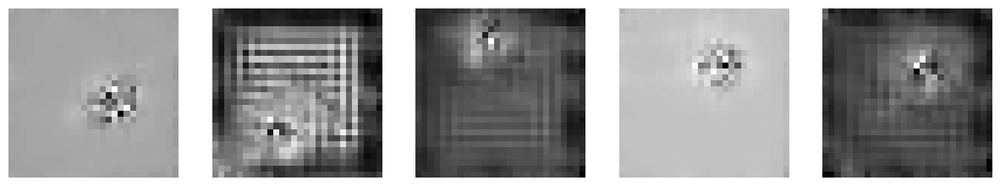

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=31 | mmd=15.07828140258789
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=32 | mmd=15.884471893310547
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=33 | mmd=16.34139633178711
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=34 | mmd=14.39426040649414
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=35 | mmd=14.72830581665039
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=36 | mmd=14.555919647216797
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=37 | mmd=16.05860137939453
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=38 | mmd=14.379962921142578
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=39 | mmd=15.20224380493164
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=40 | mmd=14.651165008544922


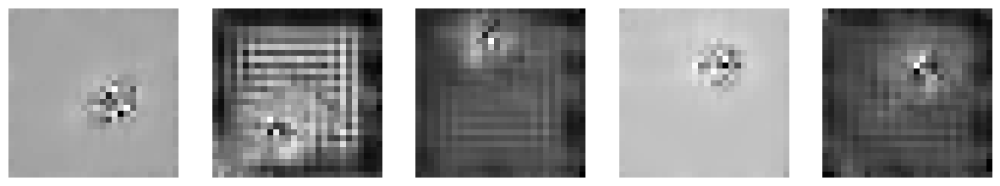

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=41 | mmd=13.93918228149414
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=42 | mmd=14.822101593017578
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=43 | mmd=14.917804718017578
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=44 | mmd=14.875839233398438
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=45 | mmd=13.772235870361328
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=46 | mmd=15.740795135498047
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=47 | mmd=15.409095764160156
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=48 | mmd=15.146026611328125
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=49 | mmd=14.02634048461914
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=50 | mmd=16.324562072753906


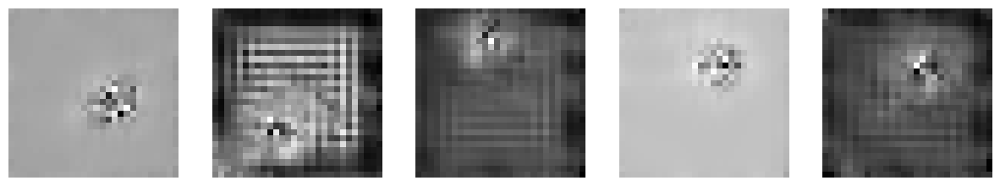

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=51 | mmd=15.88608169555664
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=52 | mmd=14.508132934570312
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=53 | mmd=16.102771759033203
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=54 | mmd=15.141796112060547
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=55 | mmd=16.564910888671875
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=56 | mmd=14.871707916259766
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=57 | mmd=15.133258819580078
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=58 | mmd=14.92995834350586
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=59 | mmd=15.340316772460938
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=60 | mmd=14.530712127685547


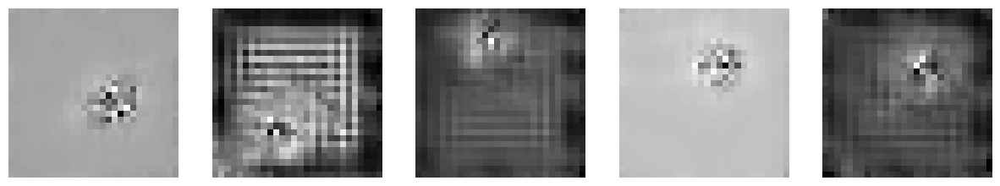

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=61 | mmd=17.297283172607422
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=62 | mmd=15.613212585449219
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=63 | mmd=13.91018295288086
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=64 | mmd=16.072311401367188
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=65 | mmd=15.300121307373047
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=66 | mmd=14.426807403564453
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=67 | mmd=14.73013687133789
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=68 | mmd=15.315620422363281
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=69 | mmd=12.582782745361328
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=70 | mmd=14.783638000488281


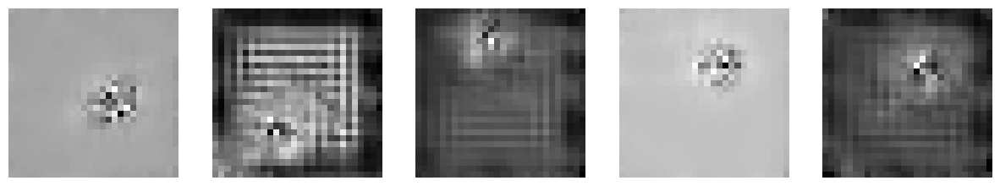

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=71 | mmd=13.866878509521484
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=72 | mmd=14.611701965332031
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=73 | mmd=13.528114318847656
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=74 | mmd=15.974430084228516
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=75 | mmd=15.63772201538086
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=76 | mmd=14.736961364746094
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=77 | mmd=15.031246185302734
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=78 | mmd=15.75509262084961
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=79 | mmd=15.287487030029297
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=80 | mmd=14.90975570678711


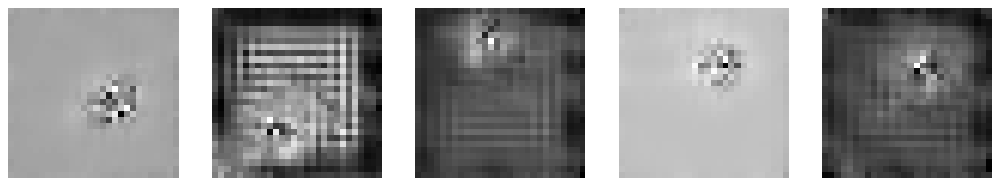

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=81 | mmd=15.714771270751953
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=82 | mmd=15.851531982421875
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=83 | mmd=14.90035629272461
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=84 | mmd=15.342788696289062
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=85 | mmd=14.558658599853516
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=86 | mmd=17.384742736816406
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=87 | mmd=13.42403793334961
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=88 | mmd=15.227947235107422
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=89 | mmd=14.911922454833984
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=90 | mmd=15.009010314941406


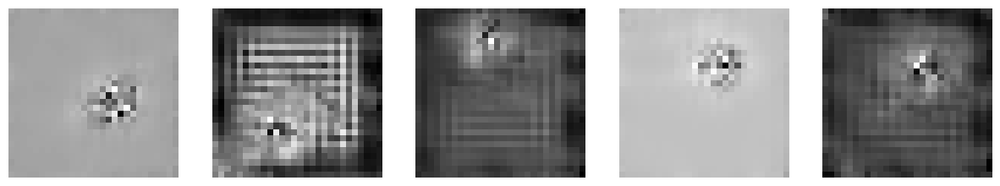

Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=91 | mmd=16.27428436279297
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=92 | mmd=14.210784912109375
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=93 | mmd=15.573230743408203
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=94 | mmd=14.82928466796875
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=95 | mmd=15.736221313476562
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=96 | mmd=15.770877838134766
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=97 | mmd=14.734081268310547
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=98 | mmd=14.747245788574219
Gradient Flow n10/10 with noise level 0.0010000000474974513, iter=99 | mmd=15.833091735839844


tensor([[[[ 0.5196,  0.1303,  0.4055,  ...,  0.2237,  0.1600, -0.0554],
          [ 0.1119,  0.1247,  0.3560,  ...,  0.3088,  0.2017,  0.0834],
          [ 0.0221,  0.2696,  0.3190,  ...,  0.3861,  0.2174,  0.3201],
          ...,
          [ 0.0123,  0.2610,  0.3056,  ...,  0.4000,  0.3597,  0.3600],
          [ 0.1538,  0.2449,  0.2338,  ...,  0.2112,  0.4666, -0.2198],
          [ 0.3977,  0.2822,  0.2664,  ...,  0.0480,  0.3715, -0.3163]]],


        [[[ 0.2577,  0.0869, -0.0911,  ..., -0.1750,  0.0048, -0.0121],
          [ 0.1781,  0.0235, -0.0109,  ..., -0.2648, -0.1844, -0.0887],
          [ 0.1570,  0.0273,  0.0735,  ..., -0.2319, -0.1902, -0.0972],
          ...,
          [ 0.7863,  0.6497,  0.5874,  ..., -0.1141, -0.1045, -0.0698],
          [ 0.7182,  0.8670,  0.7856,  ..., -0.1200, -0.1210, -0.0383],
          [ 0.6324,  1.0002,  0.5335,  ...,  0.0714,  0.0341,  0.1486]]],


        [[[-0.0348, -0.0852, -0.0195,  ..., -0.1723, -0.0236, -0.4891],
          [-0.0777, -0.136

In [21]:
lr = 0.1
N_s = 100
T = 10
t_min = 0.001
t_max = 1 - 0.001
N_p = 20
batch_size = 5_000

sampling_phase(X_data,lr,N_s,N_p,T,t_min,t_max,phi,batch_size)

In [168]:
x = all_imgs[0:28].to(device)
t_value = 0.1
alpha = 1 - t_value
beta = t_value
noise = torch.randn_like(x).to(device)
x_t = alpha * x + beta * noise


with torch.no_grad():
    f_x = phi(x, torch.tensor([t_value]).to(device))
    f_xt = phi(x_t, torch.tensor([t_value]).to(device))

mmd2_unbiased(f_x,f_xt,Linear_kernel),mmd2_unbiased(x.view(28,-1),x_t.view(28,-1),Linear_kernel)

(tensor(8.2164, device='cuda:0'), tensor(-2.8529, device='cuda:0'))

In [38]:
x.view(-1).shape

torch.Size([784])